In [1]:
import os
import csv
import optuna
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, Conv1D, MaxPooling1D, LSTM, Dense, Activation, Dropout
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from math import sqrt
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
from numpy import array
import keras.backend as K
import itertools
#!pip install pydot
    
# date-time parsing function for loading the dataset
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')
    
def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
    
# convert time series into a supervised learning problem
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
# convert time series into a supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):

    n_vars = 1 if type(data) is list else data.shape[1]
    cols, names = list(), list()
    df = DataFrame(data)
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
    	cols.append(df.shift(i))
    	names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df[0].shift(-i)) # df[0] for temperature
        if i == 0:
            names += [('var%d(t)' % (1))] # % (1) for temperature
        else:            
            names += [('var%d(t+%d)' % (1, i))] # % (1) for temperature
    
    # put it all together
    agg = concat(cols, axis=1)

    if dropnan:
        #Drop rows containing NaN
        agg.dropna(inplace=True)

    #print("Agg:")
    agg.columns = names
    #print(type(agg))
    #print(agg)

    #print("Test columns:")
    #print(agg.iloc[:, -36]) # Column containing response actual values (temperature) at time t

    return agg
     
# create a differenced series
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)
     
# transform series into training sets for supervised learning
def prepare_training_data(data, n_lag, n_seq, n_time_steps):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    print(n_vars)
    print(len(data))
    print(type(data))

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(84):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    #print("Diff values:")
    #print(len(diff_values))
    #print(len(diff_values[0]))
    #print(len(diff_values_for_training))
    #print(len(diff_values_for_training[0]))
    
    # rescale values to 0, 1
    scaler_all_features =  MinMaxScaler(feature_range=(0, 1))
    scaler =  MinMaxScaler(feature_range=(0, 1))
    #diff_values_training = np.array(diff_values_for_training)
    #diff_values_training = diff_values_training.reshape(1, -1) 
    train_scaled_values = scaler_all_features.fit_transform(diff_values)
    response_train_values = []
    for i in range(len(diff_values)):
        response_train_values.append(diff_values[i][0]) # Uses first column (temperatures) as response variable
    response_train_values = np.array(response_train_values)
    response_train_values = response_train_values.reshape(len(response_train_values), 1)

    # Fit the scaler for just the response variable for use later when forecasting
    response_scaled_values = scaler.fit_transform(response_train_values) 
    scaled_values = scaler_all_features.transform(diff_values)

    #print("Scaled values rows:")
    #print(len(scaled_values))

    train = []

    # Transform each weather station as a separate "batch"
    for ws in range(84):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        #print("Batch "+str(ws+1)+":")
        #print("Range: "+str(first)+"-"+str(last))
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        train.append([supervised_values])
        #print("Supervised count:")
        #print(len(supervised_values))
        #print(len(supervised_values[0]))
    
    return scaler, scaler_all_features, train

# transform series into testing and validation sets for supervised learning
def prepare_testing_and_validation_data(data, n_lag, n_seq, n_time_steps, scaler_all_features):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    print(n_vars)
    print(len(data))
    print(type(data))

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(21):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    #print("Diff values:")
    #print(len(diff_values))
    #print(len(diff_values[0]))
    #print(len(diff_values_for_training))
    #print(len(diff_values_for_training[0]))
    
    # rescale values to 0, 1
    scaled_values = scaler_all_features.transform(diff_values)

    validation = []
    test = []

    # Transform each weather station as a separate "batch"
    for ws in range(21):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        #print("Batch "+str(ws+1)+":")
        #print("Range: "+str(first)+"-"+str(last))
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        # training/test/validation split is 80%/10%/10%
        if ws < 11:
            test.append([supervised_values])
        else:
            validation.append([supervised_values])
        #print("Supervised count:")
        #print(len(supervised_values))
        #print(len(supervised_values[0]))
    
    return validation, test
    
def plot_kfold(cv, X, y, ax, n_splits, xlim_max=105):
    
    #Plots the indices for a cross-validation object.
    #Taken from https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
    #Parameters:
    #cv: Cross-validation object
    #X: Feature set
    #y: Target variable
    #ax: Matplotlib axis object
    #n_splits: Number of folds in the cross-validation
    #xlim_max: Maximum limit for the x-axis
        
    # Set color map for the plot
    cmap_cv = plt.cm.coolwarm
    cv_split = cv.split(X=X, y=y)
        
    for i_split, (train_idx, test_idx) in enumerate(cv_split):
        # Create an array of NaNs and fill in training/testing indices
        indices = np.full(len(X), np.nan)
        indices[test_idx], indices[train_idx] = 1, 0
            
        # Plot the training and testing indices
        ax_x = range(len(indices))
        ax_y = [i_split + 0.5] * len(indices)
        ax.scatter(ax_x, ax_y, c=indices, marker="_", 
                   lw=10, cmap=cmap_cv, vmin=-0.2, vmax=1.2)
    
        # Set y-ticks and labels
        y_ticks = np.arange(n_splits) + 0.5
        ax.set(yticks=y_ticks, yticklabels=range(n_splits),
               xlabel="Weather Station index (file_id)", ylabel="Fold",
               ylim=[n_splits, -0.2], xlim=[0, xlim_max])
    
        # Set plot title and create legend
        ax.set_title("KFold", fontsize=14)
        legend_patches = [Patch(color=cmap_cv(0.8), label="Testing set"), 
                          Patch(color=cmap_cv(0.02), label="Training set")]
        ax.legend(handles=legend_patches, loc=(1.03, 0.8))
    
#Main

#Configure
n_seq = 6
if n_seq > 46:
    n_lag = 179 - n_seq + 46
else:
    n_lag = 179
n_time_steps = 227
n_test = 1

print("Model Parameters:")
print("n_lag (number of input time steps): "+str(n_lag))
print("n_seq (number of output/future prediction time steps): "+str(n_seq))

# Create 2D array with file_ids to use for sample creation
array = np.array([
    6501, 6541, 6640, 6668, 6678, 
    6687, 6697, 6714, 6744, 6772, 
    6783, 6840, 6844, 6854, 6870, 
    6891, 6895, 6899, 6901, 6909, 
    6929, 6950, 6963, 6969, 6994, 
    7032, 7057, 7094, 7095, 7100, 
    7108, 7116, 7119, 7131, 7139, 
    7152, 7155, 7156, 7182, 7193, 
    7202, 7239, 7280, 7286, 7287, 
    7311, 7321, 7329, 7347, 7350, 
    7354, 7357, 7361, 7414, 7423, 
    7424, 7432, 7463, 7482, 7489, 
    7528, 7531, 7534, 7538, 7549, 
    7553, 7555, 7562, 7571, 7573, 
    7574, 7575, 7585, 7599, 7603, 
    7606, 7622, 7652, 7671, 7704, 
    7786, 7805, 7816, 7838, 7861, 
    7862, 7863, 7870, 7892, 7907, 
    7938, 7962, 7979, 7987, 7999, 
    8000, 8034, 8083, 8120, 8133, 
    8184, 8186, 8247, 8248, 9858])
    
#Create arrays holding the 5-fold cross-validation indices gathered for consistency across models
train_array = []
test_array = []
    
train_array.append([1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 
                        23, 24, 25, 27, 28, 29, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 
                        43, 44, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 
                        62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 81, 
                        82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103])
test_array.append([0, 4, 10, 12, 18, 26, 30, 31, 33, 45, 47, 53, 64, 65, 77, 80, 89, 94, 96, 99, 104])
    
train_array.append([0, 1, 2, 3, 4, 6, 7, 8, 10, 12, 13, 14, 17, 18, 19, 20, 21, 23, 
                        24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 41, 43, 45, 
                        46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 63, 64, 
                        65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 83, 84, 
                        86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104])
test_array.append([5, 9, 11, 15, 16, 22, 28, 35, 39, 40, 42, 44, 55, 56, 62, 72, 76, 78, 79, 85, 103])
    
train_array.append([0, 1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 
                    28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 47, 
                    48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 
                    70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 88, 89, 
                    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104])
test_array.append([3, 6, 7, 8, 13, 17, 19, 24, 25, 27, 34, 38, 43, 49, 66, 67, 68, 69, 73, 81, 84])
    
train_array.append([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 
                        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 
                        35, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 55, 56, 
                        60, 62, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 76, 77, 78, 79, 
                        80, 81, 82, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 99, 102, 103, 104])
test_array.append([32, 36, 41, 46, 48, 50, 54, 57, 58, 59, 61, 63, 70, 75, 83, 90, 91, 97, 98, 100, 101])
    
train_array.append([0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 22,
                        24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 
                        42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 
                        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 77, 78, 
                        79, 80, 81, 83, 84, 85, 89, 90, 91, 94, 96, 97, 98, 99, 100, 101, 103, 104])
test_array.append([1, 2, 14, 20, 21, 23, 29, 37, 51, 52, 60, 71, 74, 82, 86, 87, 88, 92, 93, 95, 102])
    
# Equations for three Principal Components from PCA using response variables combined with other predictors
#PC1=-0.0002714X1+0.02612X2+0.03858X3-0.007658X4+0.001592X5-0.02087X6+0.8564X7-0.1468X8+0.01192X9-0.0001049X10+0.01913X11+0.02076X12
#PC2=0.0003944X1+0.002204X2+0.01052X3+0.3248X4-0.0009976X5-0.04421X6+2.3406X7+0.06103X8+0.08841X9+0.00009018X10+0.05678X11-0.002022X12
#PC3=-0.00007998X1-0.0006124X2-0.001063X3-0.01855X4+0.00001956X5+0.01170X6+0.6076X7+0.4664X8-0.002995X9+0.008185X10+0.8815X11-0.0004730X12
    
# Equations for three Principal Components from PCA omitting both response variables,
#PC-1=-0.0004514X1+0.03194X2-0.04343X3+0.002243X4-0.02252X5+0.9877X6-0.2265X7+0.006144X8-0.0001488X9+0.02943X10
#PC-2=0.0001702X1+0.005484X2+0.2057X3-0.0003188X4-0.02584X5+1.6963X6-0.05890X7+0.05809X8+1.9748X9+0.03686X10
#PC-3=-0.00006323X1-0.001180X2-0.02384X3-0.00002833X4+0.01170X5+0.5204X6+0.4791X7-0.004318X8+0.008271X9+0.8765X10
    
# Get the current working directory 
current_directory = os.getcwd() 
    
# Print the current working directory 
print(current_directory)
    
# Define the directory containing the files 
path = current_directory+"\\Modeling\\"
print(path)
    
filename = path + 'Final_Monthly_Dataset.csv'
    
# load dataset
df = read_csv(filename, header=0, parse_dates=[0], index_col=0, date_format='%Y-%m')
    
df = df.rename(columns={'Unnamed: 0' : 'indices'})
    
#Remove unused columns
df = df.drop(['Day', 'vapor_pressure'], axis=1)
    
# Round numbers in columns to reasonable precision,
df['temperatures'] = np.round(df['temperatures'], 2)
df['slp'] = np.round(df['slp'], 2)
df['wet_bulb_temperature'] = np.round(df['wet_bulb_temperature'], 2)
df['specific_humidity'] = np.round(df['specific_humidity'], 2)
df['GHI'] = np.round(df['GHI'], 2)
df['PRCP'] = np.round(df['PRCP'], 2)
df['SNDP'] = np.round(df['SNDP'], 2)
df['solar_activity'] = np.round(df['solar_activity'], 2)
df['ONI'] = np.round(df['ONI'], 2)
df['water'] = np.round(df['water'], 0)
df['region'] = np.round(df['region'], 0)
    
df_trimmed = df[df['file_id'] != 7533] # Remove file_id 7533 so there are 105 weather stations for 5-fold CV
df_trimmed = df_trimmed.drop(['Year', 'Month', 'date', 'latitude', 'longitude', 'elevation'], axis=1)
    
X = []
y = []
    
for i in array:
    add_to_X = [] # create list to store each column to add to X
    new_df = df_trimmed[df_trimmed['file_id'] == i].drop(['file_id'], axis=1)
    #new_df = new_df.iloc[:180, :]
    add_to_y = []
    for j in range(new_df.shape[0]):
        add_to_y.append(new_df['temperatures'].iloc[j])
    y.append(add_to_y)
    #new_df = new_df.drop(['temperatures'], axis=1)
    columns_list = new_df.columns.tolist()
    for j in range(new_df.shape[0]):
        l=0
        new_row = []
        for m in columns_list:
            new_row.append(new_df.iloc[j, l])
            l += 1
        add_to_X.append(new_row)
    X.append(add_to_X)
    
#Perform k-fold cross-validation
#Taken from: https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
#k = 5  # Number of folds
#kf = KFold(n_splits=k, shuffle=True, random_state=42)
    
#for i, (train_index, test_index) in enumerate(kf.split(X)):
#    print(f"Fold {i}:")
#    print(f"  Training dataset index: {train_index}")
#    print(f"  Test dataset index: {test_index}")
    
#for train_indices, test_indices in kf.split(X):
#    print('Train: %s | test: %s' % (train_indices, test_indices))
    
# Create figure and axis
#fig, ax = plt.subplots(figsize=(6, 3))
#plot_kfold(kf, X, y, ax, k)
#plt.tight_layout()
#fig.subplots_adjust(right=0.6)
    
#Create train and test sets for each cross-validation split
train_X = []
train_y = []
val_X = []
val_y = []
for i in range(5):
    print(f"Fold {i+1}")
    #Add each corresponding sample for each entry of train index 
    train_X_rows = [] # Stores all the samples for one fold of train_X
    train_y_rows = [] # Stores all the samples for one fold of train_y
    for j in train_array[i]:
        train_X_rows.append(X[j])
        train_y_rows.append(y[j])
    # Stores one fold of train dataset
    train_X.append(train_X_rows)
    train_y.append(train_y_rows)
    #Add each corresponding sample for each entry of the validation index 
    val_X_rows = [] # Stores all the samples for one fold of val_X
    val_y_rows = [] # Stores all the samples for one fold of val_y
    for j in test_array[i]: 
            val_X_rows.append(X[j])
            val_y_rows.append(y[j])
    # Stores one fold of validation dataset
    val_X.append(val_X_rows)
    val_y.append(val_y_rows) 
    
    #print("Train_X Fold "+str(i)+":")
    #print(len(train_X[i]))
    #print(len(train_X[i][0]))
    #print(len(train_X[i][0][0])) 
    #print("Train_y Fold "+str(i)+":")
    #print(len(train_y[i]))
    #print(len(train_y[i][0]))
    #print(train_y[i][0][0])
    #print("Validation_X Fold "+str(i)+":")
    #print(len(val_X[i]))
    #print(len(val_X[i][0]))
    #print(len(val_X[i][0][0]))
    #print("Validation_y Fold "+str(i)+":")
    #print(len(val_y[i]))
    #print(len(val_y[i][0]))
    #print(val_y[i][0][0])
    
#Convert 3D arrays to DataFrames
df_X = []
df_y = []
val_df_X = []
val_df_y = []
dataset = []
dataset_test = []
scaler = []
scaler_all_features = []
train = []
test = []
validation = []

for i in range(5):
    dataset_scaling = [] # Holds all 84 weather station rows to train the scaling function
    dataset_testing = [] # Holds remaining 21 weather station rows for testing and validation
    print("Fold "+str(i+1)+":")
    #Transform train_X to the correct format
    df1 = []
    dataset_df = [] # captures each weather station's dataset as values for training scaler mapping
    df_X.append(pd.DataFrame(train_X[i]))
    X_t = df_X[i].transpose()
    for k in range(84):
        X = np.array(X_t.iloc[:, k])
        df = pd.DataFrame()
        for j in range(n_time_steps):
            new_row = pd.DataFrame(X[j]).transpose()
            new_row.columns = new_df.columns
            # Add the new row
            df = pd.concat([df, new_row], ignore_index=True)
        df.columns = new_df.columns
        df1.append(df)
        dataset_df.append(df.values)
        dataset_scaling.append(df.values)
    df_X[i] = df1
    dataset.append(dataset_df)

    #print(len(dataset))
    #print(len(dataset[0]))
    #print(len(dataset_scaling))
    #print(len(dataset_scaling[:][0]))
    #print("Stop")
    
    #Transform train_y to the correct format
    df2 = []
    df_y.append(pd.DataFrame(train_y[i]))
    y_t = df_y[i].transpose()
    
    for j in range(84):
        y = np.array(y_t.iloc[:, j])
        y = pd.DataFrame(y)
        y.columns = ['temperatures']
        df2.append(y)
    df_y[i] = df2

    #Transform val_X to the correct format
    df3 = []
    dataset_vl_df = [] # captures each weather station's dataset as values for training scaler mapping
    val_df_X.append(pd.DataFrame(val_X[i]))
    val_X_t = val_df_X[i].transpose()
    for k in range(21):
        vl_X = np.array(val_X_t.iloc[:, k])
        vl_df = pd.DataFrame()
        for j in range(n_time_steps):
            new1_row = pd.DataFrame(vl_X[j]).transpose()
            new1_row.columns = new_df.columns
            # Add the new row
            vl_df = pd.concat([vl_df, new1_row], ignore_index=True)
        vl_df.columns = new_df.columns
        df3.append(vl_df)
        dataset_vl_df.append(vl_df.values)
        dataset_testing.append(vl_df.values)
    val_df_X[i] = df3
    dataset_test.append(dataset_vl_df) 

    #Transform val_y to the correct format
    df4 = []
    val_df_y.append(pd.DataFrame(train_y[i]))
    val_y_t = val_df_y[i].transpose()
    
    for j in range(21):
        v_y = np.array(val_y_t.iloc[:, j])
        v_y = pd.DataFrame(v_y)
        v_y.columns = ['temperatures']
        df4.append(v_y)
    val_df_y[i] = df4
    
    scaler.append(MinMaxScaler(feature_range=(0, 1)))
    scaler_all_features.append(MinMaxScaler(feature_range=(0, 1)))
    train.append([1])
    test.append([1])
    validation.append([1])
    
    # prepare data
    scaler[i], scaler_all_features[i], train[i] = prepare_training_data(dataset_scaling, n_lag, n_seq, n_time_steps)

    validation[i], test[i] = prepare_testing_and_validation_data(dataset_testing, n_lag, n_seq, n_time_steps, scaler_all_features[i])

    #Reshape dimensionality
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]
    print(np.array(train1).shape)
    print(np.array(test1).shape)
    print(np.array(validation1).shape)
    train2 = []
    test2 = []
    validation2 = []

    for k in range(84):
        train2.append(train1[k][0])
        
    for k in range(11):
        test2.append(test1[k][0])

    for k in range(10):
        validation2.append(validation1[k][0])

    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2

    #Reshape dimensionality (again)
    dim_size = n_seq + 12*n_lag
    train1 = np.array(train[i]).reshape(84, dim_size)
    test1 = np.array(test[i]).reshape(11, dim_size)
    validation1 = np.array(validation[i]).reshape(10, dim_size)
    train2 = pd.DataFrame(train1).values
    test2 = pd.DataFrame(test1).values
    validation2 = pd.DataFrame(validation1).values
    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    print(train2)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2
    
    #X_train = train1[:][:-n_seq]
    #y_train = train1[:][-n_seq:]
    #X_test = test1[:][:-n_seq]
    #y_test = test1[:][-n_seq:]


Model Parameters:
n_lag (number of input time steps): 179
n_seq (number of output/future prediction time steps): 6
C:\Users\User
C:\Users\User\Modeling\
Fold 1
Fold 2
Fold 3
Fold 4
Fold 5
Fold 1:
12
84
<class 'list'>
12
21
<class 'list'>
(84, 1, 1, 2154)
(11, 1, 1, 2154)
(10, 1, 1, 2154)
(84, 1, 2154)
(11, 1, 2154)
(10, 1, 2154)
(84, 2154)
(11, 2154)
(10, 2154)
[[0.39307412 0.69695044 0.32924264 ... 0.59173755 0.63122722 0.7436209 ]
 [0.45747266 0.51683609 0.42215989 ... 0.54708384 0.62606318 0.55285541]
 [0.38487242 0.62674714 0.3411641  ... 0.56014581 0.64854192 0.66281896]
 ...
 [0.54100851 0.46473952 0.46949509 ... 0.63153098 0.55467801 0.62697448]
 [0.44896719 0.51620076 0.3997195  ... 0.55042527 0.62697448 0.57837181]
 [0.46780073 0.52414231 0.42356241 ... 0.54829891 0.55923451 0.52885784]]
Fold 2:
12
84
<class 'list'>
12
21
<class 'list'>
(84, 1, 1, 2154)
(11, 1, 1, 2154)
(10, 1, 1, 2154)
(84, 1, 2154)
(11, 1, 2154)
(10, 1, 2154)
(84, 2154)
(11, 2154)
(10, 2154)
[[0.38166311 0.6

In [2]:
print(n_seq)
print(n_lag)
print(np.array(train[1]).shape)
print(np.array(test[1]).shape)

6
179
(84, 2154)
(11, 2154)


[I 2025-05-22 01:46:39,870] A new study created in memory with name: no-name-f48ca6b9-27f9-497b-b49a-695595d2cbc0
[I 2025-05-22 01:57:13,067] Trial 0 finished with value: 0.19456789791584014 and parameters: {'lr': 0.07138459850237705, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.21793940278618731}. Best is trial 0 with value: 0.19456789791584014.


Cross Validation Accuracies:
[0.21324504911899567, 0.17619585990905762, 0.2143375277519226, 0.1971493810415268, 0.17191167175769806]
Mean Cross Validation Accuracy:
0.19456789791584014
Standard Deviation of Cross Validation Accuracy:
0.01787274271230358


[I 2025-05-22 02:05:29,809] Trial 1 finished with value: 1.8470359802246095 and parameters: {'lr': 0.7948523910856146, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.4154196562711924}. Best is trial 0 with value: 0.19456789791584014.


Cross Validation Accuracies:
[2.3215479850769043, 1.6479270458221436, 1.5946415662765503, 2.0176098346710205, 1.6534534692764282]
Mean Cross Validation Accuracy:
1.8470359802246095
Standard Deviation of Cross Validation Accuracy:
0.2810973422377815


[I 2025-05-22 02:15:57,030] Trial 2 finished with value: 2.3031479358673095 and parameters: {'lr': 0.7763850432975103, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.1961366535988591}. Best is trial 0 with value: 0.19456789791584014.


Cross Validation Accuracies:
[1.605867862701416, 3.021923303604126, 1.2385647296905518, 2.7161402702331543, 2.9332435131073]
Mean Cross Validation Accuracy:
2.3031479358673095
Standard Deviation of Cross Validation Accuracy:
0.7353581491049598


[I 2025-05-22 02:24:38,696] Trial 3 finished with value: 6.289863395690918 and parameters: {'lr': 0.06686712105071506, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.318274763150977}. Best is trial 0 with value: 0.19456789791584014.


Cross Validation Accuracies:
[7.314968585968018, 6.634979724884033, 7.3362040519714355, 4.888267993927002, 5.274896621704102]
Mean Cross Validation Accuracy:
6.289863395690918
Standard Deviation of Cross Validation Accuracy:
1.0256121999408239


[I 2025-05-22 02:34:05,970] Trial 4 finished with value: 1.7288306117057801 and parameters: {'lr': 0.21654018596125116, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.45760458248265934}. Best is trial 0 with value: 0.19456789791584014.


Cross Validation Accuracies:
[2.9429094791412354, 1.454270362854004, 0.9766704440116882, 1.7301675081253052, 1.5401352643966675]
Mean Cross Validation Accuracy:
1.7288306117057801
Standard Deviation of Cross Validation Accuracy:
0.6558541706594011


[I 2025-05-22 02:40:23,929] Trial 5 finished with value: 0.06672623008489609 and parameters: {'lr': 0.016913109661791586, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.18748871588248375}. Best is trial 5 with value: 0.06672623008489609.


Cross Validation Accuracies:
[0.05332784727215767, 0.05280810967087746, 0.07733418047428131, 0.08502943068742752, 0.06513158231973648]
Mean Cross Validation Accuracy:
0.06672623008489609
Standard Deviation of Cross Validation Accuracy:
0.01283206455026548


[I 2025-05-22 02:52:40,608] Trial 6 finished with value: 0.07911472171545028 and parameters: {'lr': 0.7871259779873316, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.15823387134926936}. Best is trial 5 with value: 0.06672623008489609.


Cross Validation Accuracies:
[0.055710360407829285, 0.067813940346241, 0.12010693550109863, 0.08453327417373657, 0.06740909814834595]
Mean Cross Validation Accuracy:
0.07911472171545028
Standard Deviation of Cross Validation Accuracy:
0.022459811720753946


[I 2025-05-22 03:00:17,048] Trial 7 finished with value: 0.06246095895767212 and parameters: {'lr': 0.01341199618425076, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.23236805322418608}. Best is trial 7 with value: 0.06246095895767212.


Cross Validation Accuracies:
[0.05035260692238808, 0.04677153751254082, 0.06585235893726349, 0.0849093422293663, 0.06441894918680191]
Mean Cross Validation Accuracy:
0.06246095895767212
Standard Deviation of Cross Validation Accuracy:
0.013505816268298134


[I 2025-05-22 03:09:16,054] Trial 8 finished with value: 21.724080801010132 and parameters: {'lr': 0.2590446642689855, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.4741993472481614}. Best is trial 7 with value: 0.06246095895767212.


Cross Validation Accuracies:
[33.644065856933594, 3.9037225246429443, 14.817549705505371, 28.61741828918457, 27.63764762878418]
Mean Cross Validation Accuracy:
21.724080801010132
Standard Deviation of Cross Validation Accuracy:
10.861305252658376


[I 2025-05-22 03:23:18,769] Trial 9 finished with value: 3.6795135498046876 and parameters: {'lr': 0.3542522456195246, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.4466398655968097}. Best is trial 7 with value: 0.06246095895767212.


Cross Validation Accuracies:
[2.899380683898926, 4.595232963562012, 2.7833750247955322, 3.329927682876587, 4.789651393890381]
Mean Cross Validation Accuracy:
3.6795135498046876
Standard Deviation of Cross Validation Accuracy:
0.8490971558580422


[I 2025-05-22 03:32:16,626] Trial 10 finished with value: 0.3992197096347809 and parameters: {'lr': 0.0018128855898197896, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.29774943755847205}. Best is trial 7 with value: 0.06246095895767212.


Cross Validation Accuracies:
[0.4034897983074188, 0.4188060462474823, 0.4161691963672638, 0.40428751707077026, 0.35334599018096924]
Mean Cross Validation Accuracy:
0.3992197096347809
Standard Deviation of Cross Validation Accuracy:
0.02374541702479929


[I 2025-05-22 03:39:44,901] Trial 11 finished with value: 0.06627352833747864 and parameters: {'lr': 0.006730854459904528, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.11250158672069892}. Best is trial 7 with value: 0.06246095895767212.


Cross Validation Accuracies:
[0.053750861436128616, 0.05107361450791359, 0.07712273299694061, 0.08395595103502274, 0.06546448171138763]
Mean Cross Validation Accuracy:
0.06627352833747864
Standard Deviation of Cross Validation Accuracy:
0.012797518801619895


[I 2025-05-22 03:47:17,561] Trial 12 finished with value: 0.06781770512461663 and parameters: {'lr': 0.006044578675131689, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.27030231268234595}. Best is trial 7 with value: 0.06246095895767212.


Cross Validation Accuracies:
[0.05465992912650108, 0.054446712136268616, 0.07911398261785507, 0.08304549008607864, 0.0678224116563797]
Mean Cross Validation Accuracy:
0.06781770512461663
Standard Deviation of Cross Validation Accuracy:
0.011928133675468704


[I 2025-05-22 03:54:07,938] Trial 13 finished with value: 0.06589897200465203 and parameters: {'lr': 0.011781747933497152, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.10492513580442037}. Best is trial 7 with value: 0.06246095895767212.


Cross Validation Accuracies:
[0.0530758835375309, 0.05098371207714081, 0.07705648243427277, 0.08400978147983551, 0.06436900049448013]
Mean Cross Validation Accuracy:
0.06589897200465203
Standard Deviation of Cross Validation Accuracy:
0.012974812894190543


[I 2025-05-22 04:01:45,664] Trial 14 finished with value: 0.06425782665610313 and parameters: {'lr': 0.015988617264600376, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.10163931107087404}. Best is trial 7 with value: 0.06246095895767212.


Cross Validation Accuracies:
[0.05003483593463898, 0.04983198270201683, 0.07606454938650131, 0.0816100463271141, 0.06374771893024445]
Mean Cross Validation Accuracy:
0.06425782665610313
Standard Deviation of Cross Validation Accuracy:
0.013047274641748029


[I 2025-05-22 04:10:51,220] Trial 15 finished with value: 0.14126526415348054 and parameters: {'lr': 0.0014068215079074777, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.36868821374168137}. Best is trial 7 with value: 0.06246095895767212.


Cross Validation Accuracies:
[0.07300487160682678, 0.17848898470401764, 0.10956548899412155, 0.1063043400645256, 0.23896263539791107]
Mean Cross Validation Accuracy:
0.14126526415348054
Standard Deviation of Cross Validation Accuracy:
0.05969422898174899


[I 2025-05-22 04:20:13,605] Trial 16 finished with value: 0.0621643602848053 and parameters: {'lr': 0.025739225199875045, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.26348337927591514}. Best is trial 16 with value: 0.0621643602848053.


Cross Validation Accuracies:
[0.05022982135415077, 0.047504547983407974, 0.06978949904441833, 0.08067890256643295, 0.06261903047561646]
Mean Cross Validation Accuracy:
0.0621643602848053
Standard Deviation of Cross Validation Accuracy:
0.012316501598939954


[I 2025-05-22 04:27:32,105] Trial 17 finished with value: 0.061169306933879855 and parameters: {'lr': 0.04534399185337687, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.24438320827712043}. Best is trial 17 with value: 0.061169306933879855.


Cross Validation Accuracies:
[0.04810553416609764, 0.04447473585605621, 0.06378732621669769, 0.0873512327671051, 0.06212770566344261]
Mean Cross Validation Accuracy:
0.061169306933879855
Standard Deviation of Cross Validation Accuracy:
0.015117120465401437


[I 2025-05-22 04:36:28,063] Trial 18 finished with value: 0.06069026291370392 and parameters: {'lr': 0.06432835948931773, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.34700816769477183}. Best is trial 18 with value: 0.06069026291370392.


Cross Validation Accuracies:
[0.042797159403562546, 0.06264299899339676, 0.07172701507806778, 0.07176221907138824, 0.05452192202210426]
Mean Cross Validation Accuracy:
0.06069026291370392
Standard Deviation of Cross Validation Accuracy:
0.011012927605971288


[I 2025-05-22 04:44:12,188] Trial 19 finished with value: 0.06023008450865745 and parameters: {'lr': 0.07066613060844872, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.34233326273862175}. Best is trial 19 with value: 0.06023008450865745.


Cross Validation Accuracies:
[0.05441584438085556, 0.0455486923456192, 0.07553979009389877, 0.07174507528543472, 0.05390102043747902]
Mean Cross Validation Accuracy:
0.06023008450865745
Standard Deviation of Cross Validation Accuracy:
0.011457642111898758


[I 2025-05-22 04:51:17,137] Trial 20 finished with value: 0.07090260162949562 and parameters: {'lr': 0.12257838451293325, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.3644825162022047}. Best is trial 19 with value: 0.06023008450865745.


Cross Validation Accuracies:
[0.08018458634614944, 0.07621472328901291, 0.0632246732711792, 0.07402375340461731, 0.06086527183651924]
Mean Cross Validation Accuracy:
0.07090260162949562
Standard Deviation of Cross Validation Accuracy:
0.0075341096150436234


[I 2025-05-22 04:57:37,074] Trial 21 finished with value: 0.0609585091471672 and parameters: {'lr': 0.04798539597148275, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.36260919575809913}. Best is trial 19 with value: 0.06023008450865745.


Cross Validation Accuracies:
[0.052548691630363464, 0.04314175248146057, 0.06706273555755615, 0.07620792090892792, 0.06583144515752792]
Mean Cross Validation Accuracy:
0.0609585091471672
Standard Deviation of Cross Validation Accuracy:
0.011676587628764038


[I 2025-05-22 05:04:25,929] Trial 22 finished with value: 0.06739138066768646 and parameters: {'lr': 0.11721614209110488, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.3558357566012862}. Best is trial 19 with value: 0.06023008450865745.


Cross Validation Accuracies:
[0.07151925563812256, 0.059421051293611526, 0.07870469242334366, 0.06574544310569763, 0.06156646087765694]
Mean Cross Validation Accuracy:
0.06739138066768646
Standard Deviation of Cross Validation Accuracy:
0.007002789815519658


[I 2025-05-22 05:10:04,100] Trial 23 finished with value: 0.06023879125714302 and parameters: {'lr': 0.037799774886668684, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.41006290457132843}. Best is trial 19 with value: 0.06023008450865745.


Cross Validation Accuracies:
[0.045092061161994934, 0.050746068358421326, 0.07046011835336685, 0.07646497339010239, 0.058430735021829605]
Mean Cross Validation Accuracy:
0.06023879125714302
Standard Deviation of Cross Validation Accuracy:
0.011752181092692581


[I 2025-05-22 05:16:16,930] Trial 24 finished with value: 0.06095592826604843 and parameters: {'lr': 0.030085792518338213, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4077665722175}. Best is trial 19 with value: 0.06023008450865745.


Cross Validation Accuracies:
[0.04876910150051117, 0.04589717090129852, 0.06829072535037994, 0.08225589245557785, 0.05956675112247467]
Mean Cross Validation Accuracy:
0.06095592826604843
Standard Deviation of Cross Validation Accuracy:
0.013301898028953662


[I 2025-05-22 05:23:25,368] Trial 25 finished with value: 0.07407357022166253 and parameters: {'lr': 0.11759124905225324, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.32354502508586}. Best is trial 19 with value: 0.06023008450865745.


Cross Validation Accuracies:
[0.05988972261548042, 0.07102613896131516, 0.09114909172058105, 0.07221193611621857, 0.07609096169471741]
Mean Cross Validation Accuracy:
0.07407357022166253
Standard Deviation of Cross Validation Accuracy:
0.010095319257557689


[I 2025-05-22 05:30:51,915] Trial 26 finished with value: 0.05846148356795311 and parameters: {'lr': 0.08301511902822228, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.4205355922849375}. Best is trial 26 with value: 0.05846148356795311.


Cross Validation Accuracies:
[0.047604385763406754, 0.053848996758461, 0.06468426436185837, 0.06851908564567566, 0.05765068531036377]
Mean Cross Validation Accuracy:
0.05846148356795311
Standard Deviation of Cross Validation Accuracy:
0.0074791357987743345


[I 2025-05-22 05:39:21,607] Trial 27 finished with value: 0.07473025396466255 and parameters: {'lr': 0.15213181305312615, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.4077594910042383}. Best is trial 26 with value: 0.05846148356795311.


Cross Validation Accuracies:
[0.07164554297924042, 0.05785069242119789, 0.0647880882024765, 0.11371097713708878, 0.06565596908330917]
Mean Cross Validation Accuracy:
0.07473025396466255
Standard Deviation of Cross Validation Accuracy:
0.019975590729484145


[I 2025-05-22 05:45:24,106] Trial 28 finished with value: 39.82415008544922 and parameters: {'lr': 0.40191268436065547, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.49665533110133386}. Best is trial 26 with value: 0.05846148356795311.


Cross Validation Accuracies:
[38.82901382446289, 32.245731353759766, 46.64884948730469, 44.292545318603516, 37.104610443115234]
Mean Cross Validation Accuracy:
39.82415008544922
Standard Deviation of Cross Validation Accuracy:
5.145127800207492


[I 2025-05-22 05:53:04,961] Trial 29 finished with value: 0.19414928555488586 and parameters: {'lr': 0.02664913203621826, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.42160839475722434}. Best is trial 26 with value: 0.05846148356795311.


Cross Validation Accuracies:
[0.15235209465026855, 0.169921413064003, 0.23093396425247192, 0.23844218254089355, 0.1790967732667923]
Mean Cross Validation Accuracy:
0.19414928555488586
Standard Deviation of Cross Validation Accuracy:
0.034279867005087526


[I 2025-05-22 05:58:34,027] Trial 30 finished with value: 0.6799175679683686 and parameters: {'lr': 0.07605301115552554, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.3888581120236931}. Best is trial 26 with value: 0.05846148356795311.


Cross Validation Accuracies:
[0.6321792006492615, 0.8881248235702515, 0.8872325420379639, 0.5220385193824768, 0.47001275420188904]
Mean Cross Validation Accuracy:
0.6799175679683686
Standard Deviation of Cross Validation Accuracy:
0.17753565067206395


[I 2025-05-22 06:05:26,459] Trial 31 finished with value: 0.06282743364572525 and parameters: {'lr': 0.07452734901644584, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.44518381488928643}. Best is trial 26 with value: 0.05846148356795311.


Cross Validation Accuracies:
[0.05180521309375763, 0.049905095249414444, 0.07097622752189636, 0.08161196857690811, 0.059838663786649704]
Mean Cross Validation Accuracy:
0.06282743364572525
Standard Deviation of Cross Validation Accuracy:
0.011972222141379246


[I 2025-05-22 06:13:18,128] Trial 32 finished with value: 0.060236215591430664 and parameters: {'lr': 0.044853322743769776, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.3287380836101288}. Best is trial 26 with value: 0.05846148356795311.


Cross Validation Accuracies:
[0.04398051276803017, 0.04983272776007652, 0.06694581359624863, 0.08083029836416245, 0.05959172546863556]
Mean Cross Validation Accuracy:
0.060236215591430664
Standard Deviation of Cross Validation Accuracy:
0.012977139526834179


[I 2025-05-22 06:19:32,977] Trial 33 finished with value: 0.062032876163721086 and parameters: {'lr': 0.034490532241495446, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.29785604203061145}. Best is trial 26 with value: 0.05846148356795311.


Cross Validation Accuracies:
[0.04929593950510025, 0.0440991073846817, 0.07636424154043198, 0.08009005337953568, 0.06031503900885582]
Mean Cross Validation Accuracy:
0.062032876163721086
Standard Deviation of Cross Validation Accuracy:
0.014270601004306186


[I 2025-05-22 06:27:19,390] Trial 34 finished with value: 0.06613936349749565 and parameters: {'lr': 0.04421347832363931, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.4277966266422858}. Best is trial 26 with value: 0.05846148356795311.


Cross Validation Accuracies:
[0.058848630636930466, 0.05119161307811737, 0.06817987561225891, 0.08457008749246597, 0.06790661066770554]
Mean Cross Validation Accuracy:
0.06613936349749565
Standard Deviation of Cross Validation Accuracy:
0.011167528531183916


[I 2025-05-22 06:34:44,014] Trial 35 finished with value: 0.07041636034846306 and parameters: {'lr': 0.007836750444723291, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.33173433361047544}. Best is trial 26 with value: 0.05846148356795311.


Cross Validation Accuracies:
[0.06383063644170761, 0.055055852979421616, 0.08300666511058807, 0.07829916477203369, 0.0718894824385643]
Mean Cross Validation Accuracy:
0.07041636034846306
Standard Deviation of Cross Validation Accuracy:
0.010021391263554015


[I 2025-05-22 06:45:01,148] Trial 36 finished with value: 0.08313992023468017 and parameters: {'lr': 0.19058654150391835, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.3884776057664286}. Best is trial 26 with value: 0.05846148356795311.


Cross Validation Accuracies:
[0.07050911337137222, 0.07493633776903152, 0.08784183859825134, 0.12169661372900009, 0.0607156977057457]
Mean Cross Validation Accuracy:
0.08313992023468017
Standard Deviation of Cross Validation Accuracy:
0.021158489798795553


[I 2025-05-22 06:52:38,622] Trial 37 finished with value: 9.713616752624512 and parameters: {'lr': 0.09000300548882298, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.3886647524539457}. Best is trial 26 with value: 0.05846148356795311.


Cross Validation Accuracies:
[9.979060173034668, 9.125812530517578, 10.53442668914795, 10.595995903015137, 8.332788467407227]
Mean Cross Validation Accuracy:
9.713616752624512
Standard Deviation of Cross Validation Accuracy:
0.8689053669027001


[I 2025-05-22 07:03:40,604] Trial 38 finished with value: 0.0748465247452259 and parameters: {'lr': 0.020732177288229927, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3119995173389685}. Best is trial 26 with value: 0.05846148356795311.


Cross Validation Accuracies:
[0.05691394582390785, 0.06813661754131317, 0.09150409698486328, 0.09160654991865158, 0.06607141345739365]
Mean Cross Validation Accuracy:
0.0748465247452259
Standard Deviation of Cross Validation Accuracy:
0.014156100990745027


[I 2025-05-22 07:11:50,560] Trial 39 finished with value: 0.06881642639636994 and parameters: {'lr': 0.003568629354618159, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.47947184311273805}. Best is trial 26 with value: 0.05846148356795311.


Cross Validation Accuracies:
[0.0573757030069828, 0.05434251204133034, 0.08073849231004715, 0.08575641363859177, 0.06586901098489761]
Mean Cross Validation Accuracy:
0.06881642639636994
Standard Deviation of Cross Validation Accuracy:
0.012475339109250522


[I 2025-05-22 07:18:08,661] Trial 40 finished with value: 0.059911645203828814 and parameters: {'lr': 0.05469017558172283, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.3342185642071527}. Best is trial 26 with value: 0.05846148356795311.


Cross Validation Accuracies:
[0.04408030956983566, 0.04533537104725838, 0.07576794177293777, 0.07652655243873596, 0.05784805119037628]
Mean Cross Validation Accuracy:
0.059911645203828814
Standard Deviation of Cross Validation Accuracy:
0.014105563865426352


[I 2025-05-22 07:25:25,883] Trial 41 finished with value: 0.05670655444264412 and parameters: {'lr': 0.056748862853083004, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.33347618616783287}. Best is trial 41 with value: 0.05670655444264412.


Cross Validation Accuracies:
[0.044637393206357956, 0.04209328815340996, 0.06599078327417374, 0.07562074810266495, 0.055190559476614]
Mean Cross Validation Accuracy:
0.05670655444264412
Standard Deviation of Cross Validation Accuracy:
0.012692155625657502


[I 2025-05-22 07:31:17,704] Trial 42 finished with value: 0.05607817843556404 and parameters: {'lr': 0.059025603445634935, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.2771032142889541}. Best is trial 42 with value: 0.05607817843556404.


Cross Validation Accuracies:
[0.043180834501981735, 0.04589284956455231, 0.06080029904842377, 0.07576350122690201, 0.05475340783596039]
Mean Cross Validation Accuracy:
0.05607817843556404
Standard Deviation of Cross Validation Accuracy:
0.0116760248233285


[I 2025-05-22 07:37:21,592] Trial 43 finished with value: 0.05536622181534767 and parameters: {'lr': 0.055894697755093155, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.27398607464926755}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.042313531041145325, 0.05110793933272362, 0.06351163238286972, 0.06419646739959717, 0.05570153892040253]
Mean Cross Validation Accuracy:
0.05536622181534767
Standard Deviation of Cross Validation Accuracy:
0.008160135955992031


[I 2025-05-22 07:45:49,436] Trial 44 finished with value: 1.984906506538391 and parameters: {'lr': 0.09486544512093964, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.20088765862160107}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[2.1594295501708984, 1.684665560722351, 1.7565425634384155, 1.7351866960525513, 2.5887081623077393]
Mean Cross Validation Accuracy:
1.984906506538391
Standard Deviation of Cross Validation Accuracy:
0.3463204966704464


[I 2025-05-22 07:53:10,509] Trial 45 finished with value: 0.0724389135837555 and parameters: {'lr': 0.3107282253723024, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.27761107138134733}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.07141946256160736, 0.07070089876651764, 0.07234230637550354, 0.07754054665565491, 0.07019135355949402]
Mean Cross Validation Accuracy:
0.0724389135837555
Standard Deviation of Cross Validation Accuracy:
0.0026513202336624496


[I 2025-05-22 08:01:27,681] Trial 46 finished with value: 0.06541752815246582 and parameters: {'lr': 0.15244345881614982, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.24075652347663185}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.041107725352048874, 0.04468473419547081, 0.07742311805486679, 0.10028832405805588, 0.06358373910188675]
Mean Cross Validation Accuracy:
0.06541752815246582
Standard Deviation of Cross Validation Accuracy:
0.021837053994228896


[I 2025-05-22 08:09:02,336] Trial 47 finished with value: 0.05958290696144104 and parameters: {'lr': 0.05540175287261475, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.28341410694088565}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.054119523614645004, 0.04235430434346199, 0.05794433131814003, 0.08362600952386856, 0.059870366007089615]
Mean Cross Validation Accuracy:
0.05958290696144104
Standard Deviation of Cross Validation Accuracy:
0.01347228005522032


[I 2025-05-22 08:18:49,580] Trial 48 finished with value: 0.07227063030004502 and parameters: {'lr': 0.555322951313699, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.28345323826274926}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.055194415152072906, 0.049209680408239365, 0.12305992096662521, 0.07382457703351974, 0.06006455793976784]
Mean Cross Validation Accuracy:
0.07227063030004502
Standard Deviation of Cross Validation Accuracy:
0.02666218120492535


[I 2025-05-22 08:29:04,864] Trial 49 finished with value: 3.715283823013306 and parameters: {'lr': 0.2134066847839628, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.2199204699676204}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[2.4973204135894775, 5.577856540679932, 3.2443158626556396, 2.40364146232605, 4.85328483581543]
Mean Cross Validation Accuracy:
3.715283823013306
Standard Deviation of Cross Validation Accuracy:
1.279833958172912


[I 2025-05-22 08:37:04,585] Trial 50 finished with value: 0.06444251984357834 and parameters: {'lr': 0.05806179282923636, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.25574227210933786}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.053339000791311264, 0.04522913694381714, 0.07734467089176178, 0.08564646542072296, 0.06065332517027855]
Mean Cross Validation Accuracy:
0.06444251984357834
Standard Deviation of Cross Validation Accuracy:
0.014985813449911282


[I 2025-05-22 08:43:44,451] Trial 51 finished with value: 0.0627061314880848 and parameters: {'lr': 0.020082071231716157, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.2891592721420965}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.05055924877524376, 0.0489300936460495, 0.07200263440608978, 0.0782678872346878, 0.06377079337835312]
Mean Cross Validation Accuracy:
0.0627061314880848
Standard Deviation of Cross Validation Accuracy:
0.011550347974210142


[I 2025-05-22 08:51:56,177] Trial 52 finished with value: 0.06671791449189186 and parameters: {'lr': 0.05420804448547482, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.30612477080423833}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.05542720481753349, 0.05845516920089722, 0.0649476945400238, 0.08961226046085358, 0.06514724344015121]
Mean Cross Validation Accuracy:
0.06671791449189186
Standard Deviation of Cross Validation Accuracy:
0.012045786385884362


[I 2025-05-22 08:58:48,559] Trial 53 finished with value: 0.06230595484375954 and parameters: {'lr': 0.09357908063574448, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.16357515822028956}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.057227715849876404, 0.05874715745449066, 0.05878811702132225, 0.069107785820961, 0.06765899807214737]
Mean Cross Validation Accuracy:
0.06230595484375954
Standard Deviation of Cross Validation Accuracy:
0.005014951834848241


[I 2025-05-22 09:05:07,186] Trial 54 finished with value: 0.06237435787916183 and parameters: {'lr': 0.03520857392360102, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.2245343390170697}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.047304701060056686, 0.051134053617715836, 0.0674261525273323, 0.08103730529546738, 0.06496957689523697]
Mean Cross Validation Accuracy:
0.06237435787916183
Standard Deviation of Cross Validation Accuracy:
0.01211610823414805


[I 2025-05-22 09:13:11,426] Trial 55 finished with value: 0.057417475432157514 and parameters: {'lr': 0.059178497049303086, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.2529411017320484}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.04377352446317673, 0.041086744517087936, 0.07174312323331833, 0.07210268080234528, 0.058381304144859314]
Mean Cross Validation Accuracy:
0.057417475432157514
Standard Deviation of Cross Validation Accuracy:
0.013226175393811202


[I 2025-05-22 09:22:17,193] Trial 56 finished with value: 0.06393644660711288 and parameters: {'lr': 0.011799879564571104, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.25629898997927597}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.051481425762176514, 0.048356711864471436, 0.07507621496915817, 0.08101195096969604, 0.06375592947006226]
Mean Cross Validation Accuracy:
0.06393644660711288
Standard Deviation of Cross Validation Accuracy:
0.01275582654109297


[I 2025-05-22 09:31:22,035] Trial 57 finished with value: 0.06480403766036033 and parameters: {'lr': 0.14391742310303093, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.26922580994390677}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.044596657156944275, 0.04564868286252022, 0.07976283133029938, 0.088775634765625, 0.06523638218641281]
Mean Cross Validation Accuracy:
0.06480403766036033
Standard Deviation of Cross Validation Accuracy:
0.01774179101368926


[I 2025-05-22 09:41:47,255] Trial 58 finished with value: 0.1500808924436569 and parameters: {'lr': 0.023710873452196732, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.24972454219009294}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.16903720796108246, 0.11211928725242615, 0.18932808935642242, 0.1642688363790512, 0.11565104126930237]
Mean Cross Validation Accuracy:
0.1500808924436569
Standard Deviation of Cross Validation Accuracy:
0.030748919451592287


[I 2025-05-22 09:52:55,007] Trial 59 finished with value: 0.062176954746246335 and parameters: {'lr': 0.08925721703392783, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.20430569804890258}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.06171838939189911, 0.06261245906352997, 0.05693110451102257, 0.07698959112167358, 0.05263322964310646]
Mean Cross Validation Accuracy:
0.062176954746246335
Standard Deviation of Cross Validation Accuracy:
0.008226977283546008


[I 2025-05-22 10:01:48,722] Trial 60 finished with value: 0.058617600798606874 and parameters: {'lr': 0.06116418826595952, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.1842845208376112}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.05334198847413063, 0.041848648339509964, 0.056203797459602356, 0.0783839002251625, 0.0633096694946289]
Mean Cross Validation Accuracy:
0.058617600798606874
Standard Deviation of Cross Validation Accuracy:
0.012062988022885959


[I 2025-05-22 10:10:18,024] Trial 61 finished with value: 0.058608902245759965 and parameters: {'lr': 0.04102412761919503, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.17648584085581567}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.04945829138159752, 0.043970249593257904, 0.06936798989772797, 0.07302294671535492, 0.05722503364086151]
Mean Cross Validation Accuracy:
0.058608902245759965
Standard Deviation of Cross Validation Accuracy:
0.011166571255830935


[I 2025-05-22 10:19:11,822] Trial 62 finished with value: 0.06048642471432686 and parameters: {'lr': 0.0376285851284401, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.12905607329285934}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.04382643103599548, 0.04495829716324806, 0.06444969773292542, 0.08448965102434158, 0.06470804661512375]
Mean Cross Validation Accuracy:
0.06048642471432686
Standard Deviation of Cross Validation Accuracy:
0.015022400822689002


[I 2025-05-22 10:27:54,356] Trial 63 finished with value: 0.06590872928500176 and parameters: {'lr': 0.07387203080534469, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.16070891713382182}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.05374996364116669, 0.06024128571152687, 0.06390505284070969, 0.07487180829048157, 0.07677553594112396]
Mean Cross Validation Accuracy:
0.06590872928500176
Standard Deviation of Cross Validation Accuracy:
0.008745221439090626


[I 2025-05-22 10:36:35,683] Trial 64 finished with value: 0.06034342795610428 and parameters: {'lr': 0.029250295070087213, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.18560119828739938}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.04812327399849892, 0.04663252830505371, 0.06784120947122574, 0.07971307635307312, 0.05940705165266991]
Mean Cross Validation Accuracy:
0.06034342795610428
Standard Deviation of Cross Validation Accuracy:
0.012406431712955057


[I 2025-05-22 10:46:28,044] Trial 65 finished with value: 0.07874431014060974 and parameters: {'lr': 0.11853079400263498, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.1405796214722139}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.08138692378997803, 0.05258674919605255, 0.10455261915922165, 0.08686109632253647, 0.06833416223526001]
Mean Cross Validation Accuracy:
0.07874431014060974
Standard Deviation of Cross Validation Accuracy:
0.0175015634341769


[I 2025-05-22 10:57:07,513] Trial 66 finished with value: 0.06408487856388093 and parameters: {'lr': 0.01661338957395183, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.17628485823537676}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.04980137571692467, 0.05014967545866966, 0.07257667183876038, 0.08248019963502884, 0.06541647017002106]
Mean Cross Validation Accuracy:
0.06408487856388093
Standard Deviation of Cross Validation Accuracy:
0.012731691684155302


[I 2025-05-22 11:06:25,173] Trial 67 finished with value: 0.05974010154604912 and parameters: {'lr': 0.04168677016861855, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.21390407639802272}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.05517711862921715, 0.04321794956922531, 0.06421960145235062, 0.07614732533693314, 0.05993851274251938]
Mean Cross Validation Accuracy:
0.05974010154604912
Standard Deviation of Cross Validation Accuracy:
0.01079911661185445


[I 2025-05-22 11:14:12,923] Trial 68 finished with value: 5.1301172256469725 and parameters: {'lr': 0.06052954906258371, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.14965144642823897}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[4.759462356567383, 4.893898010253906, 5.186481475830078, 4.7900004386901855, 6.0207438468933105]
Mean Cross Validation Accuracy:
5.1301172256469725
Standard Deviation of Cross Validation Accuracy:
0.4701609693784681


[I 2025-05-22 11:20:45,480] Trial 69 finished with value: 0.06429246515035629 and parameters: {'lr': 0.07146676557841601, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.23461842950591674}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.05440306290984154, 0.06320302933454514, 0.06114177778363228, 0.07718002796173096, 0.06553442776203156]
Mean Cross Validation Accuracy:
0.06429246515035629
Standard Deviation of Cross Validation Accuracy:
0.007437011823309563


[I 2025-05-22 11:25:56,677] Trial 70 finished with value: 0.06198059171438217 and parameters: {'lr': 0.10496965981041151, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.17989182310877133}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.06885907053947449, 0.04693582281470299, 0.061733946204185486, 0.07264040410518646, 0.059733714908361435]
Mean Cross Validation Accuracy:
0.06198059171438217
Standard Deviation of Cross Validation Accuracy:
0.008858887422112058


[I 2025-05-22 11:33:05,696] Trial 71 finished with value: 0.060338235646486285 and parameters: {'lr': 0.056042033634925374, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.2775940082470095}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.04244031012058258, 0.048998091369867325, 0.08032023161649704, 0.06637413799762726, 0.06355840712785721]
Mean Cross Validation Accuracy:
0.060338235646486285
Standard Deviation of Cross Validation Accuracy:
0.013379210700581698


[I 2025-05-22 11:38:56,542] Trial 72 finished with value: 0.06197686567902565 and parameters: {'lr': 0.04781746076116319, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.29394049023237245}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.04677612707018852, 0.04320162162184715, 0.07830468565225601, 0.08155382424592972, 0.060048069804906845]
Mean Cross Validation Accuracy:
0.06197686567902565
Standard Deviation of Cross Validation Accuracy:
0.015729891983057766


[I 2025-05-22 11:43:09,088] Trial 73 finished with value: 0.06281981393694877 and parameters: {'lr': 0.031240877245542024, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.3145472930174232}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.053073979914188385, 0.04812135919928551, 0.07032804191112518, 0.07967504113912582, 0.06290064752101898]
Mean Cross Validation Accuracy:
0.06281981393694877
Standard Deviation of Cross Validation Accuracy:
0.011414942469341294


[I 2025-05-22 11:47:40,963] Trial 74 finished with value: 0.0650139681994915 and parameters: {'lr': 0.08080364083778575, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.26807887670662484}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.06231636181473732, 0.049002956598997116, 0.06092328205704689, 0.09828775376081467, 0.05453948676586151]
Mean Cross Validation Accuracy:
0.0650139681994915
Standard Deviation of Cross Validation Accuracy:
0.01730446677987275


[I 2025-05-22 11:50:43,352] Trial 75 finished with value: 0.05948000028729439 and parameters: {'lr': 0.04014212960452954, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.34720355179834567}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.05023866891860962, 0.04813732951879501, 0.06859536468982697, 0.0746816098690033, 0.055747028440237045]
Mean Cross Validation Accuracy:
0.05948000028729439
Standard Deviation of Cross Validation Accuracy:
0.010413186510429861


[I 2025-05-22 11:54:22,698] Trial 76 finished with value: 0.07810776606202126 and parameters: {'lr': 0.021082242005771763, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.38184881213621086}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.05676964297890663, 0.04877098649740219, 0.09018892049789429, 0.0814339742064476, 0.11337530612945557]
Mean Cross Validation Accuracy:
0.07810776606202126
Standard Deviation of Cross Validation Accuracy:
0.023309995570418917


[I 2025-05-22 11:58:16,964] Trial 77 finished with value: 0.06750587001442909 and parameters: {'lr': 0.044578134137234236, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.3434367432406945}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.056318189948797226, 0.05298515409231186, 0.07590378820896149, 0.08700962364673615, 0.06531259417533875]
Mean Cross Validation Accuracy:
0.06750587001442909
Standard Deviation of Cross Validation Accuracy:
0.012583697952508967


[I 2025-05-22 12:03:36,248] Trial 78 finished with value: 0.05661984384059906 and parameters: {'lr': 0.06734878486195249, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.37043952991666496}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.043887775391340256, 0.04811510071158409, 0.05804156884551048, 0.08014155924320221, 0.05291321501135826]
Mean Cross Validation Accuracy:
0.05661984384059906
Standard Deviation of Cross Validation Accuracy:
0.012676495710057622


[I 2025-05-22 12:08:16,210] Trial 79 finished with value: 0.08494620472192764 and parameters: {'lr': 0.1663052768891618, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.11483556763364972}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.09512169659137726, 0.09110274910926819, 0.10249927639961243, 0.06746578961610794, 0.0685415118932724]
Mean Cross Validation Accuracy:
0.08494620472192764
Standard Deviation of Cross Validation Accuracy:
0.014312462108070516


[I 2025-05-22 12:12:36,742] Trial 80 finished with value: 0.058392001688480376 and parameters: {'lr': 0.06455215463320083, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.4340964738725857}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.038801081478595734, 0.05057262256741524, 0.07145769894123077, 0.07270180433988571, 0.05842680111527443]
Mean Cross Validation Accuracy:
0.058392001688480376
Standard Deviation of Cross Validation Accuracy:
0.0128096132036203


[I 2025-05-22 12:16:44,618] Trial 81 finished with value: 0.05553824603557587 and parameters: {'lr': 0.06333943506295482, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.4399118120033223}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.04487612098455429, 0.04299400746822357, 0.058868054300546646, 0.07698601484298706, 0.053967032581567764]
Mean Cross Validation Accuracy:
0.05553824603557587
Standard Deviation of Cross Validation Accuracy:
0.012203294255683218


[I 2025-05-22 12:20:30,998] Trial 82 finished with value: 0.07419904172420502 and parameters: {'lr': 0.10774175274289816, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.4448659343597045}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.06706080585718155, 0.05935528129339218, 0.10261750966310501, 0.07506173104047775, 0.06689988076686859]
Mean Cross Validation Accuracy:
0.07419904172420502
Standard Deviation of Cross Validation Accuracy:
0.01505272691941515


[I 2025-05-22 12:24:14,527] Trial 83 finished with value: 0.061935301125049594 and parameters: {'lr': 0.06723133314324013, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.43416853326418275}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.058334577828645706, 0.04664717614650726, 0.07991946488618851, 0.06932789832353592, 0.05544738844037056]
Mean Cross Validation Accuracy:
0.061935301125049594
Standard Deviation of Cross Validation Accuracy:
0.011548728277584028


[I 2025-05-22 12:28:07,626] Trial 84 finished with value: 0.05618489906191826 and parameters: {'lr': 0.08007632419221286, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3976097619801498}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.042526114732027054, 0.052411869168281555, 0.060238514095544815, 0.06777538359165192, 0.05797261372208595]
Mean Cross Validation Accuracy:
0.05618489906191826
Standard Deviation of Cross Validation Accuracy:
0.008423362679236537


[I 2025-05-22 12:33:13,283] Trial 85 finished with value: 0.06609293892979622 and parameters: {'lr': 0.13329225420391666, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3986143254621782}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.07153981924057007, 0.06123165786266327, 0.06626271456480026, 0.0721709132194519, 0.05925958976149559]
Mean Cross Validation Accuracy:
0.06609293892979622
Standard Deviation of Cross Validation Accuracy:
0.0052338478163093845


[I 2025-05-22 12:40:20,695] Trial 86 finished with value: 7.689663028717041 and parameters: {'lr': 0.08428162229551502, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.4615297114834415}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[5.72219705581665, 9.54934310913086, 8.412095069885254, 9.456562995910645, 5.308116912841797]
Mean Cross Validation Accuracy:
7.689663028717041
Standard Deviation of Cross Validation Accuracy:
1.8245513314908144


[I 2025-05-22 12:44:34,063] Trial 87 finished with value: 0.12208453118801117 and parameters: {'lr': 0.05033822218158191, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.37862467825489404}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.13285984098911285, 0.12060488015413284, 0.11367132514715195, 0.12027352303266525, 0.12301308661699295]
Mean Cross Validation Accuracy:
0.12208453118801117
Standard Deviation of Cross Validation Accuracy:
0.006216440623075978


[I 2025-05-22 12:47:45,358] Trial 88 finished with value: 0.0678713709115982 and parameters: {'lr': 0.10228676621284999, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.417301361909774}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.06676167994737625, 0.06918500363826752, 0.07316696643829346, 0.06817389279603958, 0.06206931173801422]
Mean Cross Validation Accuracy:
0.0678713709115982
Standard Deviation of Cross Validation Accuracy:
0.003598771654421638


[I 2025-05-22 12:53:07,601] Trial 89 finished with value: 0.6318238914012909 and parameters: {'lr': 0.06349703290795172, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.4014321401861047}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.3286302089691162, 0.5238043069839478, 1.3632231950759888, 0.38109657168388367, 0.5623651742935181]
Mean Cross Validation Accuracy:
0.6318238914012909
Standard Deviation of Cross Validation Accuracy:
0.3758266311306966


[I 2025-05-22 12:57:32,731] Trial 90 finished with value: 0.0658718153834343 and parameters: {'lr': 0.08005968411982292, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.4600787847736234}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.048638176172971725, 0.05612427368760109, 0.07928311079740524, 0.08148237317800522, 0.0638311430811882]
Mean Cross Validation Accuracy:
0.0658718153834343
Standard Deviation of Cross Validation Accuracy:
0.012804136771621828


[I 2025-05-22 13:02:03,340] Trial 91 finished with value: 0.06056258901953697 and parameters: {'lr': 0.03686820326216282, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.4320582836239465}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.05299699679017067, 0.044329650700092316, 0.06424696743488312, 0.07841002196073532, 0.06282930821180344]
Mean Cross Validation Accuracy:
0.06056258901953697
Standard Deviation of Cross Validation Accuracy:
0.01147161710534807


[I 2025-05-22 13:06:50,766] Trial 92 finished with value: 0.060136780887842176 and parameters: {'lr': 0.04897396213399751, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.36766980103709285}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.04567038640379906, 0.0501931756734848, 0.07205438613891602, 0.07305463403463364, 0.05971132218837738]
Mean Cross Validation Accuracy:
0.060136780887842176
Standard Deviation of Cross Validation Accuracy:
0.011110653571904683


[I 2025-05-22 13:11:13,701] Trial 93 finished with value: 0.06366976872086524 and parameters: {'lr': 0.026090591182393416, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.42316701293558473}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.04995495453476906, 0.05100761353969574, 0.07424085587263107, 0.07719539105892181, 0.06595002859830856]
Mean Cross Validation Accuracy:
0.06366976872086524
Standard Deviation of Cross Validation Accuracy:
0.011386977037842872


[I 2025-05-22 13:15:35,114] Trial 94 finished with value: 0.06465348973870277 and parameters: {'lr': 0.07443732503779135, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.4726645676798378}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.039500486105680466, 0.05084509775042534, 0.09764134883880615, 0.08169877529144287, 0.05358174070715904]
Mean Cross Validation Accuracy:
0.06465348973870277
Standard Deviation of Cross Validation Accuracy:
0.0215623260121211


[I 2025-05-22 13:20:08,956] Trial 95 finished with value: 0.07298526614904403 and parameters: {'lr': 0.12341377640000077, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.4376401146010906}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.06881485134363174, 0.07919856160879135, 0.08353280276060104, 0.07405364513397217, 0.05932646989822388]
Mean Cross Validation Accuracy:
0.07298526614904403
Standard Deviation of Cross Validation Accuracy:
0.008425581016978106


[I 2025-05-22 13:25:43,972] Trial 96 finished with value: 0.05994996502995491 and parameters: {'lr': 0.06510354704008293, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.3040882367016544}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.049645718187093735, 0.04954821243882179, 0.07286964356899261, 0.07047180831432343, 0.057214442640542984]
Mean Cross Validation Accuracy:
0.05994996502995491
Standard Deviation of Cross Validation Accuracy:
0.009994841893312923


[I 2025-05-22 13:30:13,293] Trial 97 finished with value: 0.06257336661219597 and parameters: {'lr': 0.030687037359230063, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.35722942025768617}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.049106959253549576, 0.05081376060843468, 0.07057400792837143, 0.08020321279764175, 0.06216889247298241]
Mean Cross Validation Accuracy:
0.06257336661219597
Standard Deviation of Cross Validation Accuracy:
0.011786583880281582


[I 2025-05-22 13:34:29,083] Trial 98 finished with value: 0.07729456722736358 and parameters: {'lr': 0.1829942728232603, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.40155525566083333}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.06857109814882278, 0.06840449571609497, 0.07973001152276993, 0.08781634271144867, 0.08195088803768158]
Mean Cross Validation Accuracy:
0.07729456722736358
Standard Deviation of Cross Validation Accuracy:
0.0076609758644946655


[I 2025-05-22 13:37:07,958] Trial 99 finished with value: 0.0733612060546875 and parameters: {'lr': 0.09813264398563026, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4524727082315011}. Best is trial 43 with value: 0.05536622181534767.


Cross Validation Accuracies:
[0.0609462596476078, 0.04704693332314491, 0.09471029788255692, 0.10075238347053528, 0.06335015594959259]
Mean Cross Validation Accuracy:
0.0733612060546875
Standard Deviation of Cross Validation Accuracy:
0.020750196577327348
Number of finished trials: 100
Best trial: {'lr': 0.055894697755093155, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.27398607464926755}
Best hyperparameters:  {'lr': 0.055894697755093155, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.27398607464926755}
Fold 1:
Epoch 1/100
84/84 [==============================] - 6s 28ms/step - loss: 0.1230 - val_loss: 0.1051
Epoch 2/100
84/84 [==============================] - 1s 16ms/step - loss: 0.0861 - val_loss: 0.0886
Epoch 3/100
84/84 [==============================] - 1s 17ms/step - loss: 0.0831 - val_loss: 0.0840
Epoch 4/100
84/84 [==============================] - 1s 17ms/step -

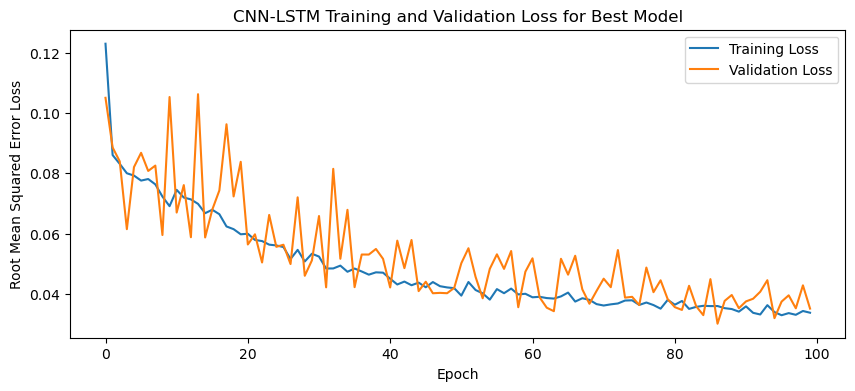

1/1 - 1s - loss: 0.0242 - 1s/epoch - 1s/step
Test Loss: 0.02424883097410202
1/1 [==============================] - 0s 31ms/step


NameError: name 'series' is not defined

In [3]:
n_batch = 1
nb_epoch = 100

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
 
# fit a CNN-LSTM network to training data
#Adapted from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters to be tuned by Optuna (taken from Javier Leon's dissertation 'Fruit Prices')
    lr = trial.suggest_float('lr', 1e-3, 1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_name == 'RMSprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr)
    
    #Optuna will try either Rectified Linear Unit (ReLU) = max(0, x), tanh, or sigmoid functions
    activation_function = trial.suggest_categorical('activation_function', ['relu', 'tanh', 'sigmoid'])
    
    filters = trial.suggest_categorical('filters', [256, 512, 1024]) # Used for CNN-LSTM model
    lstm_units = trial.suggest_categorical('lstm_units', [256, 512, 1024])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)

    # design network
    model = Sequential()
    model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(MaxPooling1D(pool_size=1)) # CNN-LSTM Only
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units, return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer)
        
    return model

# make forecast with the CNN-LSTM best model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_cnnlstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_cnnlstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # invert first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # propagate difference forecast using inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create array from forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test):
    # plot the entire dataset in blue
    plt.plot(series.values)
    # plot the forecasts in red
    for i in range(len(forecasts)):
        off_s = len(series) - n_test + i - 1
        off_e = off_s + len(forecasts[i]) + 1
        xaxis = [x for x in range(off_s, off_e)]
        yaxis = [series.values[off_s]] + forecasts[i]
        plt.plot(xaxis, yaxis, color='red')
    # show the plot
    plt.show()
    
def objective(trial):
    
    cv_accuracies = []
        
    for i in range(5):
        train1 = train[i]
        test1 = test[i]
        validation1 = validation[i]

        X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
        X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
        X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
        X = X.reshape(X.shape[0], 1, X.shape[1])
        X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
        X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
        model = create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch)

        history = model.fit(X, y, validation_data=(X_val, y_val), epochs=nb_epoch, verbose=0)

        cv_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
        loss = history.history['val_loss'][-1]
    
        # Plotting the training and validation loss
        #plt.figure(figsize=(10, 4))
        #plt.plot(history.history['loss'], label='Training Loss')
        #plt.plot(history.history['val_loss'], label='Validation Loss')
        #title1 = "CNN-LSTM Training and Validation Loss for Fold " + str(i+1)
        #plt.title(title1)
        #plt.xlabel('Epoch')
        #plt.ylabel('Root Mean Squared Error Loss')
        #plt.legend()
        #plt.show()
            
        cv_accuracies.append(cv_accuracy)
    
    print("Cross Validation Accuracies:")
    print(cv_accuracies)
    print("Mean Cross Validation Accuracy:")
    print(np.mean(cv_accuracies))
    print("Standard Deviation of Cross Validation Accuracy:")
    print(np.std(cv_accuracies))
        
    return np.mean(cv_accuracies)

n_batch = 1
nb_epoch = 100

# optimize and fit model
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)
print('Number of finished trials:', len(study.trials))

print('Best trial:', study.best_trial.params)
best_params = study.best_params
print("Best hyperparameters: ", best_params)

for i in range(5):
    print("Fold "+str(i+1)+":")
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
    X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
    X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
    X = X.reshape(X.shape[0], 1, X.shape[1])
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_model(optuna.trial.FixedTrial(best_params), X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Plotting the training and validation loss
    plt.figure(figsize=(10, 4))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title1 = "CNN-LSTM Training and Validation Loss for Best Model"
    plt.title(title1)
    plt.xlabel('Epoch')
    plt.ylabel('Root Mean Squared Error Loss')
    plt.legend()
    plt.show()

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    #print("Forecasts:")
    #print(forecasts)
    #print("Actual:")
    #print(actual)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction
    
    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    for j in range(len(X_test)):
        print("Weather Station "+str(j+1)+":")
        dataset_df = pd.DataFrame(y_test[j].flatten())
        dataset = dataset_df.values
        dataset = dataset[:, 0]
        dataset = np.array(dataset).reshape(-1, 1)
        dataset = dataset.flatten()
        dataset = pd.DataFrame(dataset)
        series = scaler[i].inverse_transform(dataset)
        series = pd.Series(series.flatten())

    # plot forecasts
    plot_forecasts(series, forecasts, 1)
    
    best_model.summary()

    # Print out table of actual and predicted values for each weather station
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")

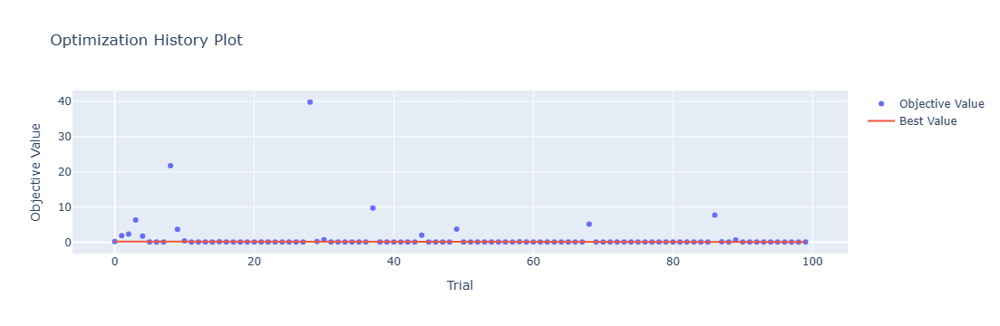

In [4]:
optuna.visualization.plot_optimization_history(study)

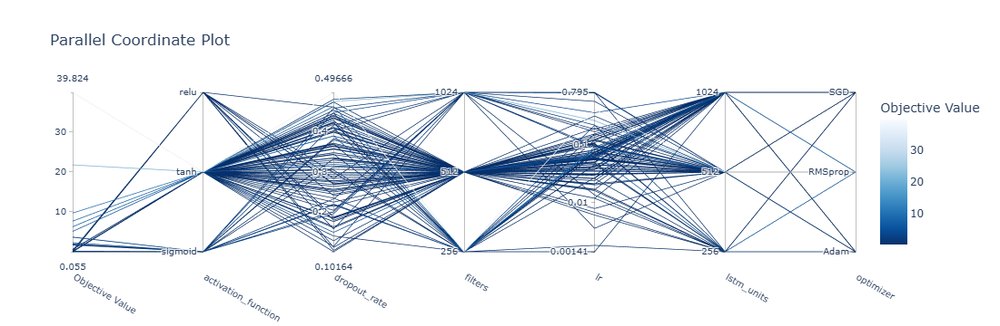

In [5]:
optuna.visualization.plot_parallel_coordinate(study)

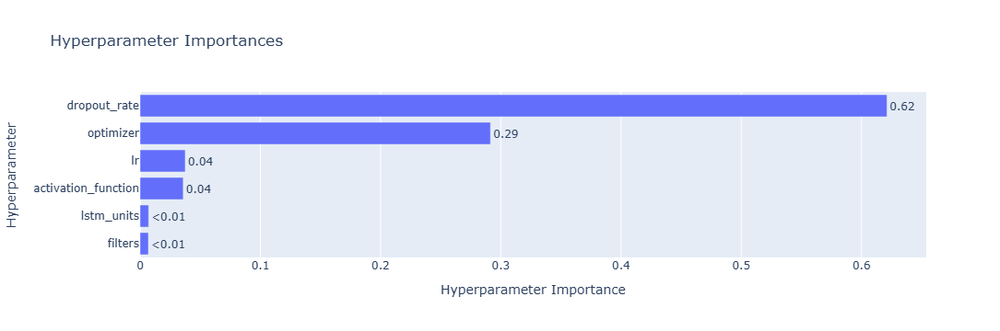

In [6]:
optuna.visualization.plot_param_importances(study)

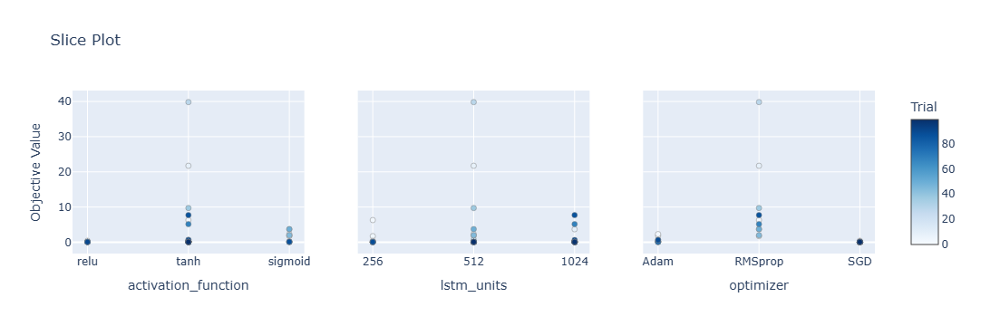

In [7]:
optuna.visualization.plot_slice(study, params=['optimizer', 'activation_function', 'lstm_units'])

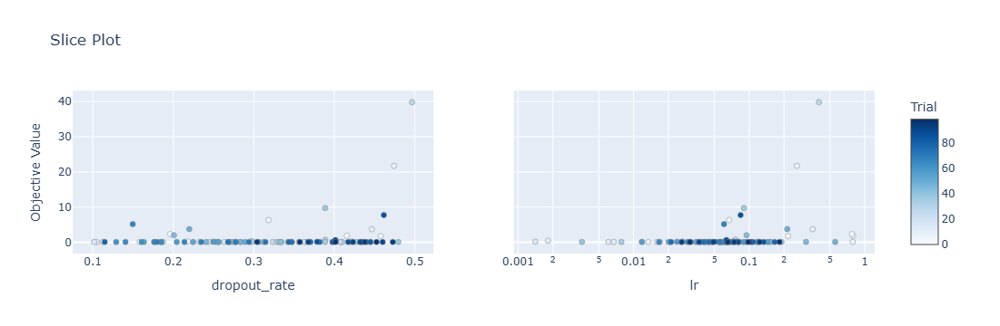

In [8]:
optuna.visualization.plot_slice(study, params=['lr', 'dropout_rate'])

[[12.21  8.17 15.68 ... 23.86 20.59 15.82]
 [14.52 12.85 16.77 ... 26.49 23.17 21.15]
 [ 8.91  6.23 11.39 ... 22.62 16.72 14.05]
 ...
 [ 7.87  5.76 10.62 ... 21.07 15.24 12.04]
 [ 6.49  2.73  9.77 ... 21.93 16.5  11.44]
 [ 5.29  1.27  5.84 ... 22.11 15.37  9.87]]
Epoch 1/100
84/84 [==============================] - 20s 88ms/step - loss: 0.1208 - accuracy: 0.5952 - mae: 0.1053 - rmse: 0.1208 - mape: 18.1781 - pearson: 0.6745 - val_loss: 0.0757 - val_accuracy: 0.6000 - val_mae: 0.0609 - val_rmse: 0.0757 - val_mape: 10.9522 - val_pearson: 0.7790
Epoch 2/100
84/84 [==============================] - 3s 39ms/step - loss: 0.0878 - accuracy: 0.6548 - mae: 0.0720 - rmse: 0.0878 - mape: 12.5805 - pearson: 0.7252 - val_loss: 0.0675 - val_accuracy: 0.6000 - val_mae: 0.0548 - val_rmse: 0.0675 - val_mape: 9.5344 - val_pearson: 0.7899
Epoch 3/100
84/84 [==============================] - 3s 39ms/step - loss: 0.0854 - accuracy: 0.6786 - mae: 0.0692 - rmse: 0.0854 - mape: 11.8808 - pearson: 0.7192 - val

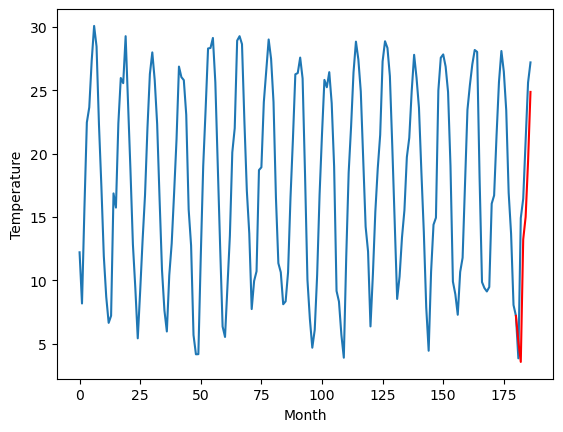

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.87		12.51		-0.36
12.78		13.81		1.03
17.84		18.89		1.05
19.24		20.39		1.15
23.26		24.22		0.96
26.74		27.88		1.14
[180, 181, 182, 183, 184, 185, 186]
[13.23, 12.505081317424775, 13.810587785243989, 18.888920686244965, 20.39205839395523, 24.221909782886506, 27.87762501001358]


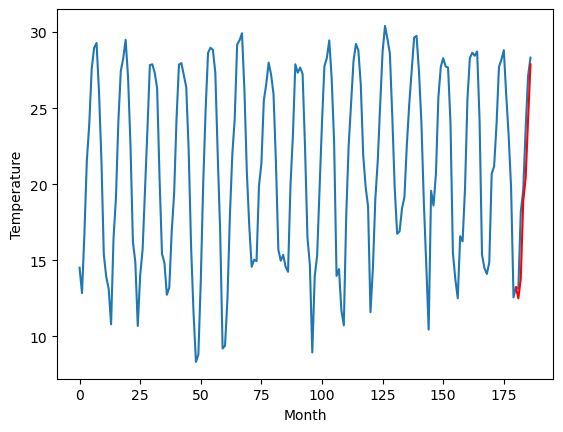

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
15.34		14.46		-0.88
16.20		15.23		-0.97
22.18		21.25		-0.93
23.82		23.06		-0.76
27.80		27.04		-0.76
31.94		31.25		-0.69
[180, 181, 182, 183, 184, 185, 186]
[7.18, 14.461493615508079, 15.228743318915367, 21.25340819776058, 23.05827701508999, 27.042597417235374, 31.248656396269798]


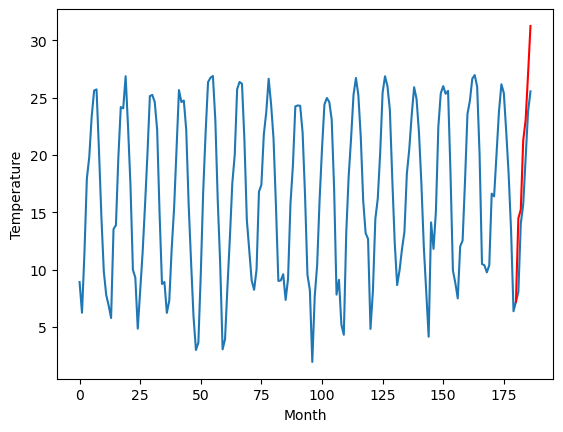

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.00		9.19		0.19
7.43		9.34		1.91
15.34		16.27		0.93
17.13		17.68		0.55
21.10		21.70		0.60
24.38		25.92		1.54
[180, 181, 182, 183, 184, 185, 186]
[11.46, 9.18774539589882, 9.336561519503594, 16.26980050265789, 17.681992966532707, 21.69677825629711, 25.922161061167717]


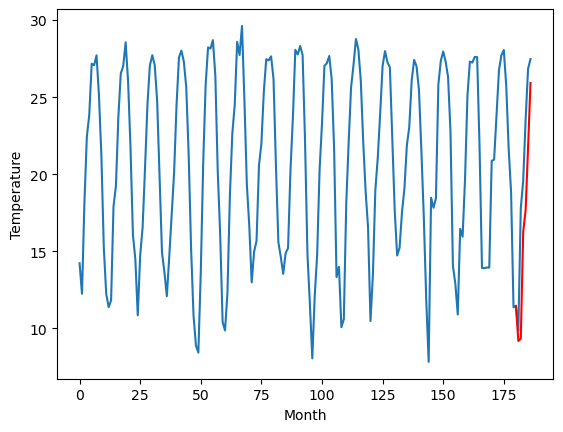

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.35		14.23		0.88
10.26		12.34		2.08
20.16		22.09		1.93
22.09		24.02		1.93
25.95		28.49		2.54
31.15		34.28		3.13
[180, 181, 182, 183, 184, 185, 186]
[9.27, 14.229929447178147, 12.336004137996934, 22.09083735943248, 24.018511533741258, 28.487534761432908, 34.281664609913136]


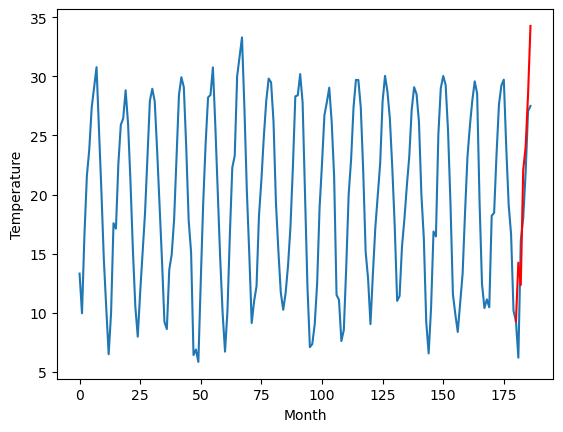

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.52		12.98		1.46
12.17		14.13		1.96
17.07		19.36		2.29
20.44		21.75		1.31
23.95		25.80		1.85
28.52		30.29		1.77
[180, 181, 182, 183, 184, 185, 186]
[7.77, 12.979622381925584, 14.13138582110405, 19.355104464292527, 21.750971573591233, 25.798731583356858, 30.285333889722825]


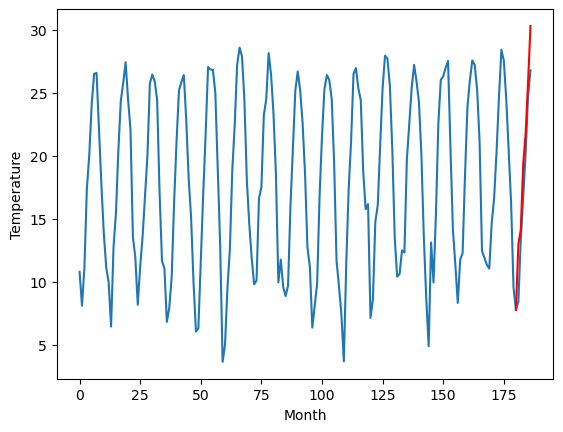

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.21		10.55		0.34
10.85		11.18		0.33
17.83		17.28		-0.55
18.86		19.47		0.61
22.57		23.56		0.99
26.90		28.17		1.27
[180, 181, 182, 183, 184, 185, 186]
[6.59, 10.554138594269752, 11.176838033795356, 17.278719061017036, 19.466741674542426, 23.56115447819233, 28.17127239048481]


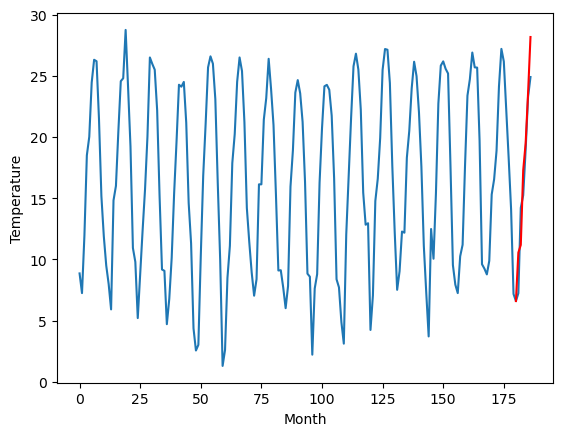

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.91		8.34		0.43
8.53		8.76		0.23
15.05		15.13		0.08
18.68		17.70		-0.98
21.70		21.91		0.21
26.49		26.93		0.44
[180, 181, 182, 183, 184, 185, 186]
[5.3, 8.335167860984802, 8.763418740034103, 15.134839123487472, 17.69582993388176, 21.905593460798265, 26.92819601893425]


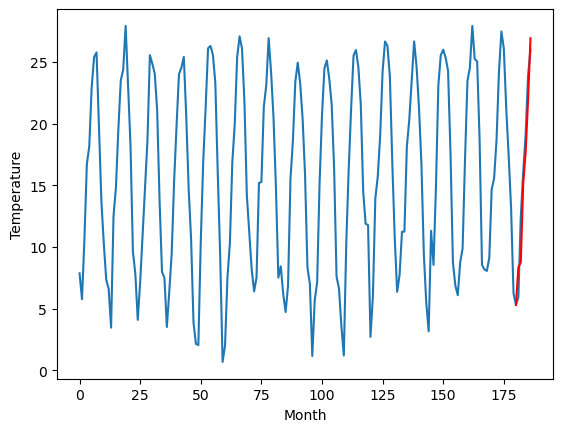

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.08		7.24		0.16
2.81		4.23		1.42
15.28		15.98		0.70
17.88		18.44		0.56
22.57		23.20		0.63
28.76		30.00		1.24
[180, 181, 182, 183, 184, 185, 186]
[3.1, 7.240656728744507, 4.22625696182251, 15.983572597503663, 18.44480001449585, 23.20229398727417, 29.997430438995362]


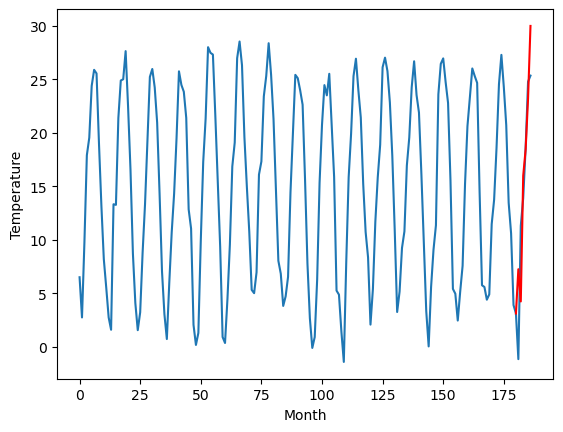

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
4.90		5.41		0.51
2.73		3.42		0.69
13.48		13.62		0.14
16.54		16.66		0.12
21.01		21.37		0.36
27.49		28.08		0.59
[180, 181, 182, 183, 184, 185, 186]
[0.6, 5.407603969573975, 3.416494598388672, 13.619362106323242, 16.65505241394043, 21.367851486206057, 28.08453582763672]


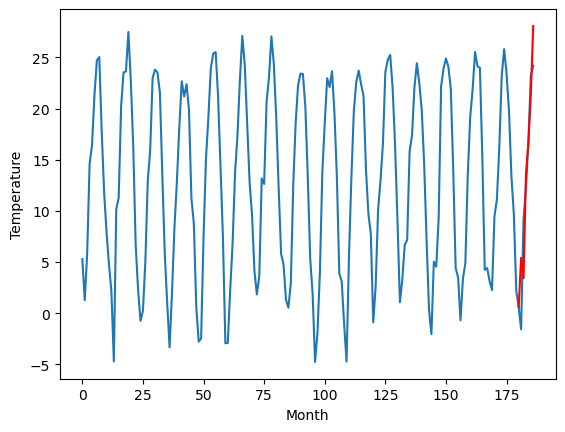

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
3.68		3.77		0.09
-0.63		0.85		1.48
11.10		12.15		1.05
15.07		15.93		0.86
20.22		21.03		0.81
27.53		28.80		1.27
[180, 181, 182, 183, 184, 185, 186]
[-0.75, 3.7740925931930542, 0.847482123374939, 12.153087058067321, 15.926188149452209, 21.025965371131896, 28.79547993183136]


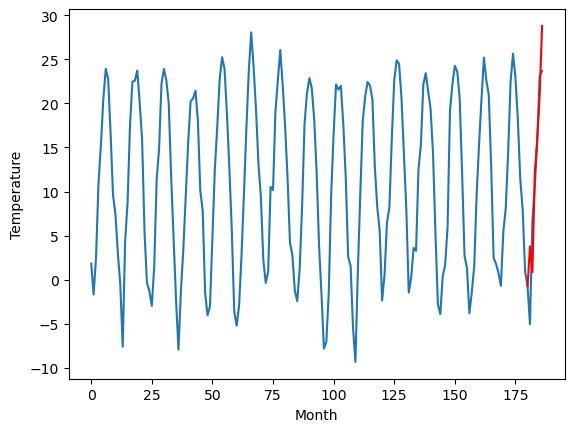

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.43   5.173538
1                 1   12.87  12.505081
2                 2   15.34  14.461494
3                 3    9.00   9.187745
4                 4   13.35  14.229929
5                 5   11.52  12.979622
6                 6   10.21  10.554139
7                 7    7.91   8.335168
8                 8    7.08   7.240657
9                 9    4.90   5.407604
10               10    3.68   3.774093


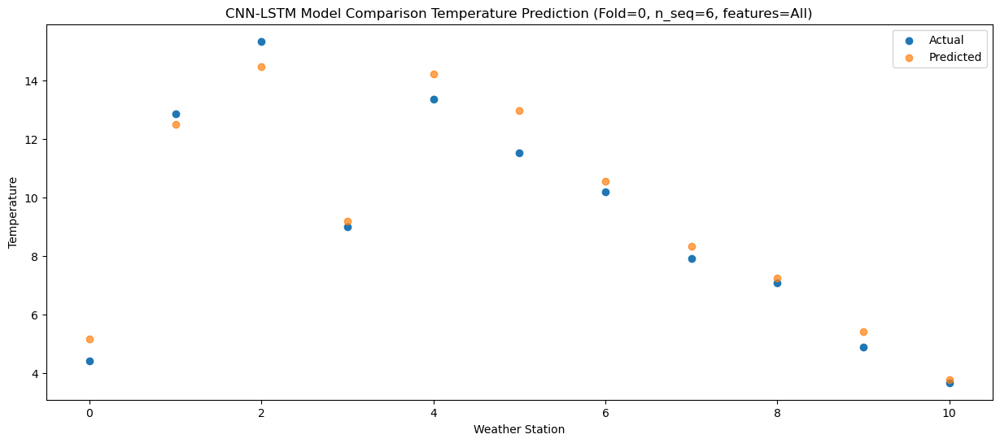

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    1.08   3.557716
1                 1   12.78  13.810588
2                 2   16.20  15.228743
3                 3    7.43   9.336562
4                 4   10.26  12.336004
5                 5   12.17  14.131386
6                 6   10.85  11.176838
7                 7    8.53   8.763419
8                 8    2.81   4.226257
9                 9    2.73   3.416495
10               10   -0.63   0.847482


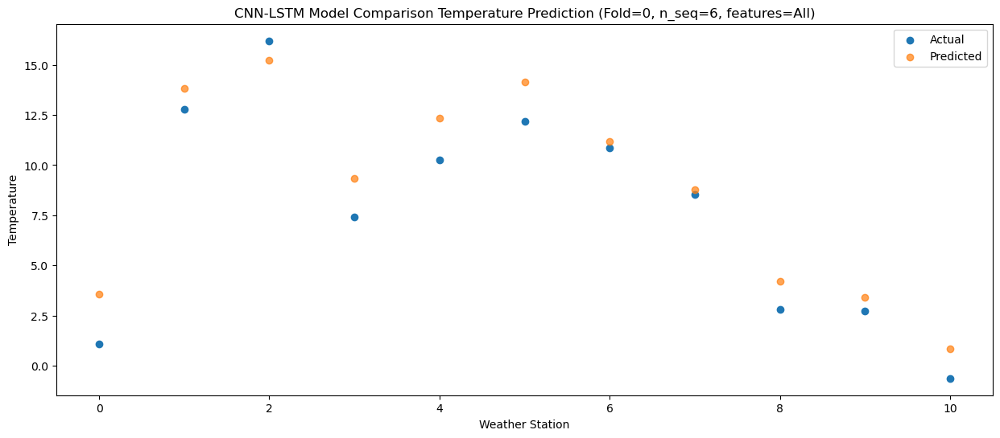

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   12.15  13.227330
1                 1   17.84  18.888921
2                 2   22.18  21.253408
3                 3   15.34  16.269801
4                 4   20.16  22.090837
5                 5   17.07  19.355104
6                 6   17.83  17.278719
7                 7   15.05  15.134839
8                 8   15.28  15.983573
9                 9   13.48  13.619362
10               10   11.10  12.153087


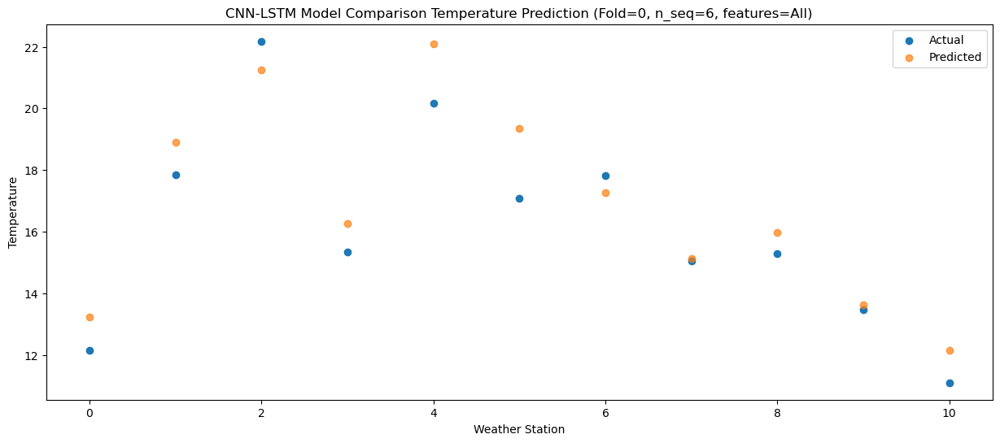

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   13.68  15.001941
1                 1   19.24  20.392058
2                 2   23.82  23.058277
3                 3   17.13  17.681993
4                 4   22.09  24.018512
5                 5   20.44  21.750972
6                 6   18.86  19.466742
7                 7   18.68  17.695830
8                 8   17.88  18.444800
9                 9   16.54  16.655052
10               10   15.07  15.926188


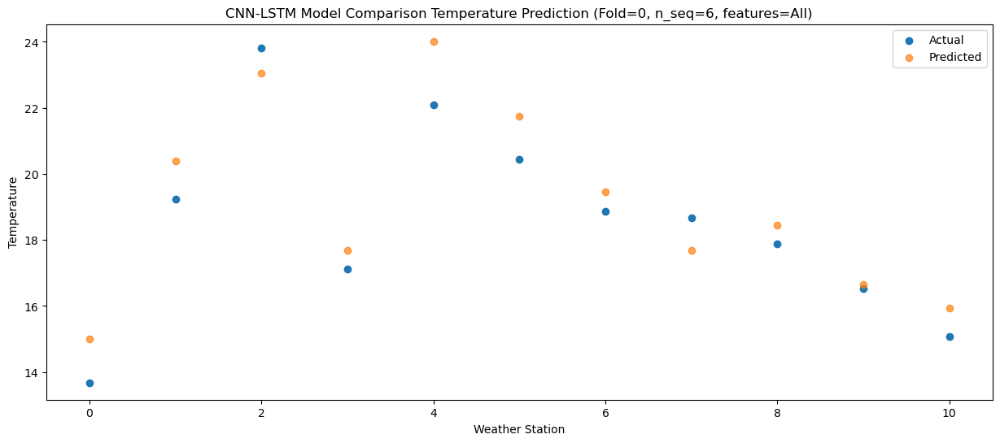

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   18.18  19.376570
1                 1   23.26  24.221910
2                 2   27.80  27.042597
3                 3   21.10  21.696778
4                 4   25.95  28.487535
5                 5   23.95  25.798732
6                 6   22.57  23.561154
7                 7   21.70  21.905593
8                 8   22.57  23.202294
9                 9   21.01  21.367851
10               10   20.22  21.025965


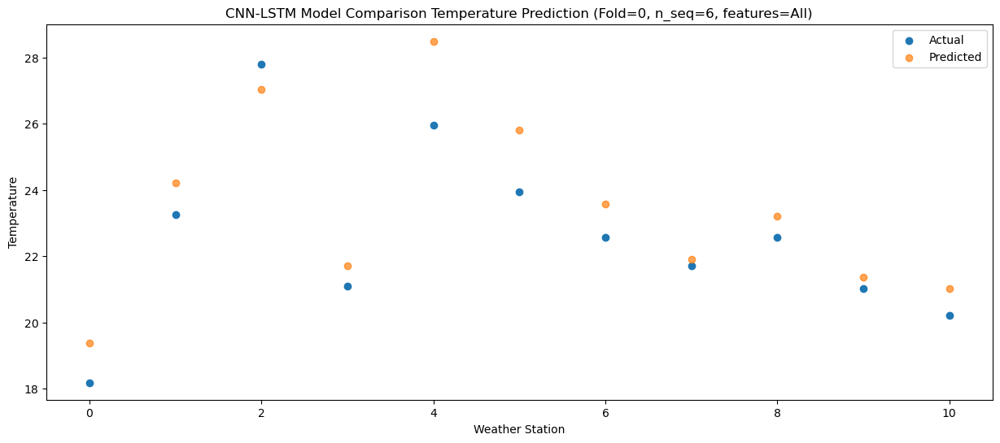

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   22.85  24.871115
1                 1   26.74  27.877625
2                 2   31.94  31.248656
3                 3   24.38  25.922161
4                 4   31.15  34.281665
5                 5   28.52  30.285334
6                 6   26.90  28.171272
7                 7   26.49  26.928196
8                 8   28.76  29.997430
9                 9   27.49  28.084536
10               10   27.53  28.795480


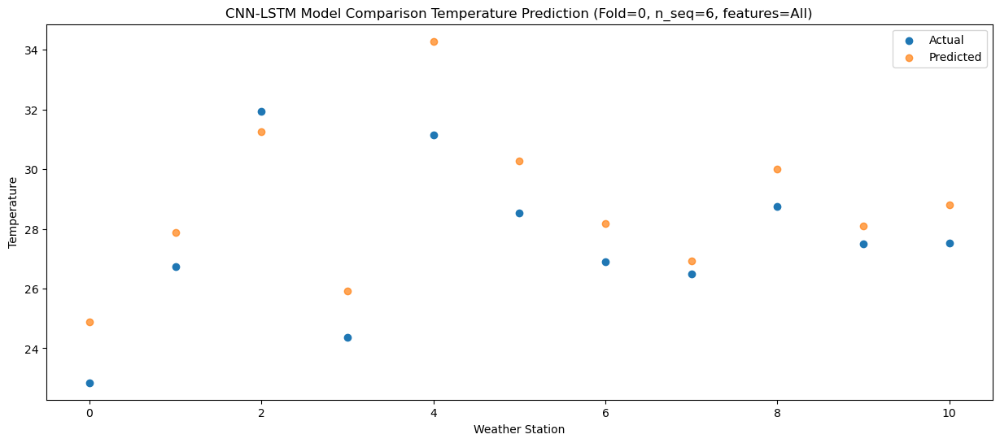

f, t:
[[ 4.43 12.87 15.34  9.   13.35 11.52 10.21  7.91  7.08  4.9   3.68]
 [ 1.08 12.78 16.2   7.43 10.26 12.17 10.85  8.53  2.81  2.73 -0.63]
 [12.15 17.84 22.18 15.34 20.16 17.07 17.83 15.05 15.28 13.48 11.1 ]
 [13.68 19.24 23.82 17.13 22.09 20.44 18.86 18.68 17.88 16.54 15.07]
 [18.18 23.26 27.8  21.1  25.95 23.95 22.57 21.7  22.57 21.01 20.22]
 [22.85 26.74 31.94 24.38 31.15 28.52 26.9  26.49 28.76 27.49 27.53]]
[[ 5.17353755 12.50508132 14.46149362  9.1877454  14.22992945 12.97962238
  10.55413859  8.33516786  7.24065673  5.40760397  3.77409259]
 [ 3.55771571 13.81058779 15.22874332  9.33656152 12.33600414 14.13138582
  11.17683803  8.76341874  4.22625696  3.4164946   0.84748212]
 [13.22732955 18.88892069 21.2534082  16.2698005  22.09083736 19.35510446
  17.27871906 15.13483912 15.9835726  13.61936211 12.15308706]
 [15.0019415  20.39205839 23.05827702 17.68199297 24.01851153 21.75097157
  19.46674167 17.69582993 18.44480001 16.65505241 15.92618815]
 [19.37657004 24.22190978 27.04

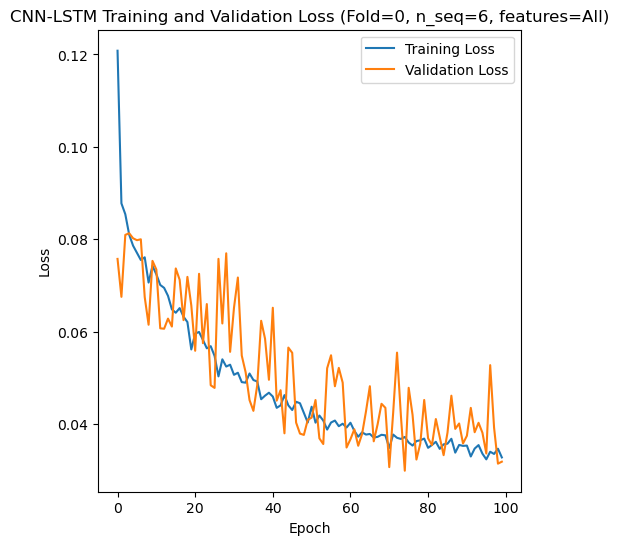

[[12.2  10.03 13.86 ... 24.46 19.58 17.03]
 [ 8.35  6.22 11.74 ... 22.47 18.02 13.98]
 [10.82  7.37 13.36 ... 24.57 19.57 16.15]
 ...
 [ 7.69  4.56 11.66 ... 25.3  19.83 13.28]
 [ 8.93  6.7  14.14 ... 25.37 21.51 12.55]
 [ 7.96  5.46 11.14 ... 25.13 20.28 10.63]]
Epoch 1/100
84/84 [==============================] - 52s 315ms/step - loss: 0.1239 - accuracy: 0.4881 - mae: 0.1049 - rmse: 0.1239 - mape: 17.8587 - pearson: 0.6143 - val_loss: 0.0814 - val_accuracy: 0.8000 - val_mae: 0.0634 - val_rmse: 0.0814 - val_mape: 11.6263 - val_pearson: 0.8007
Epoch 2/100
84/84 [==============================] - 20s 242ms/step - loss: 0.0871 - accuracy: 0.6310 - mae: 0.0720 - rmse: 0.0871 - mape: 12.4895 - pearson: 0.6977 - val_loss: 0.1058 - val_accuracy: 0.1000 - val_mae: 0.0991 - val_rmse: 0.1058 - val_mape: 17.0198 - val_pearson: 0.7637
Epoch 3/100
84/84 [==============================] - 20s 242ms/step - loss: 0.0842 - accuracy: 0.5595 - mae: 0.0685 - rmse: 0.0842 - mape: 11.9247 - pearson: 0.7153

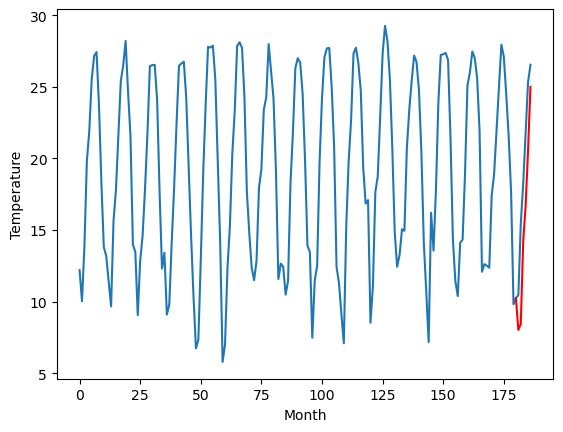

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.00		11.94		-0.06
12.66		11.58		-1.08
19.43		18.64		-0.79
21.57		21.20		-0.37
25.30		25.24		-0.06
29.44		30.26		0.82
[180, 181, 182, 183, 184, 185, 186]
[6.41, 11.943729650974273, 11.577968341112136, 18.639189940690994, 21.197924357652663, 25.235484820604324, 30.26498435139656]


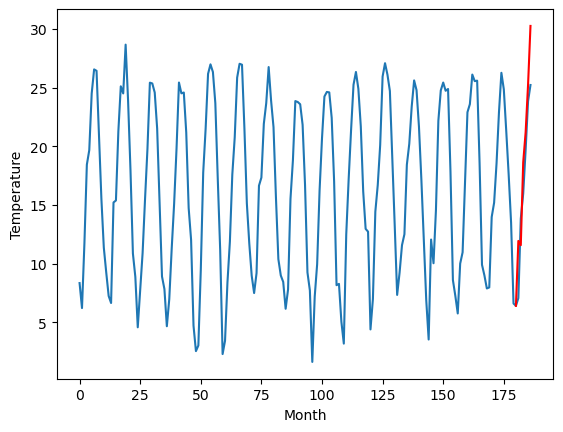

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.77		8.30		-0.47
9.26		7.81		-1.45
16.32		15.10		-1.22
17.72		17.35		-0.37
21.84		21.31		-0.53
25.72		26.22		0.50
[180, 181, 182, 183, 184, 185, 186]
[7.6, 8.298860205709934, 7.806580676138401, 15.103507174551487, 17.353662623465063, 21.308556927740575, 26.223431958258153]


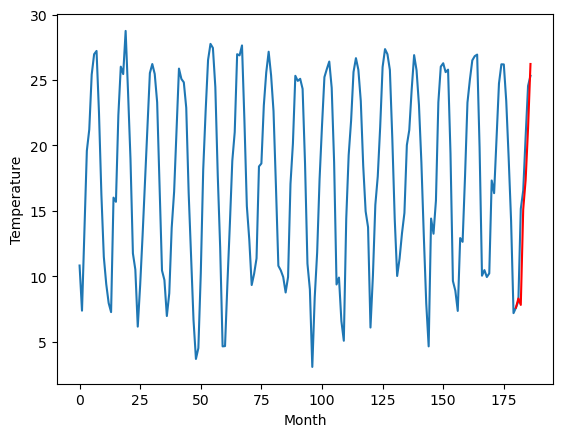

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.72		10.96		0.24
9.13		9.58		0.45
16.50		17.58		1.08
18.84		19.83		0.99
22.73		23.82		1.09
26.62		29.33		2.71
[180, 181, 182, 183, 184, 185, 186]
[11.89, 10.958900741934777, 9.579058341383934, 17.578336409926415, 19.82740395486355, 23.82490628182888, 29.330042771697045]


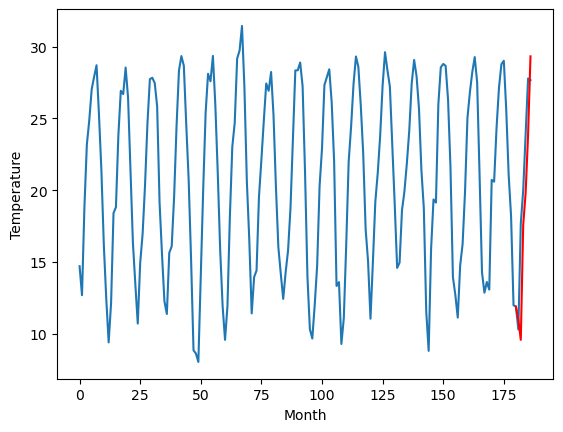

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.70		14.83		0.13
13.00		13.29		0.29
20.61		21.54		0.93
22.91		23.75		0.84
27.03		27.76		0.73
30.50		33.34		2.84
[180, 181, 182, 183, 184, 185, 186]
[10.96, 14.828540018796922, 13.286755970716477, 21.543603352308274, 23.751068762540818, 27.757903269529344, 33.3441869533062]


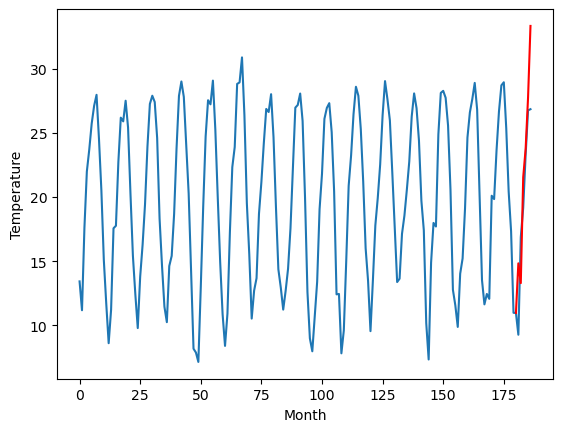

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.91		13.57		1.66
12.29		12.31		0.02
19.63		19.49		-0.14
21.90		22.44		0.54
27.49		26.58		-0.91
31.76		32.55		0.79
[180, 181, 182, 183, 184, 185, 186]
[7.75, 13.57483121573925, 12.309708325266838, 19.489270417094232, 22.43621060073376, 26.58130404174328, 32.54805227935314]


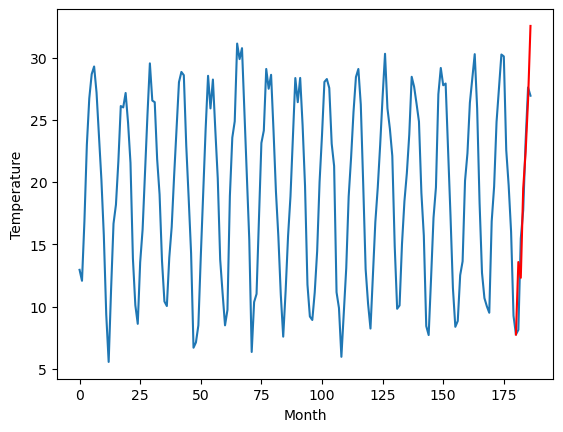

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.75		12.71		-0.04
13.53		12.50		-1.03
19.81		19.34		-0.47
22.38		21.94		-0.44
26.15		25.96		-0.19
30.16		30.91		0.75
[180, 181, 182, 183, 184, 185, 186]
[6.17, 12.706098717451095, 12.495051470398902, 19.343773928284644, 21.936787930130958, 25.96107706129551, 30.91017898619175]


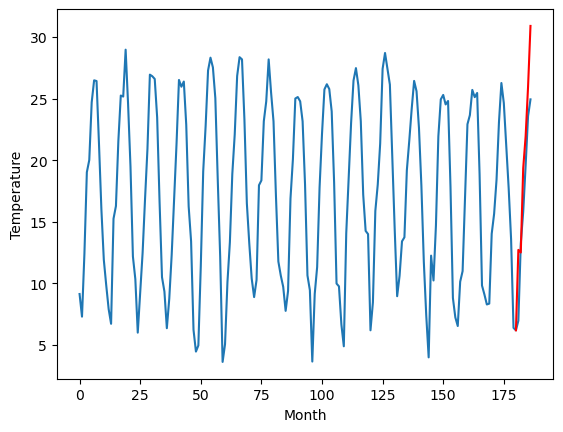

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.81		8.62		-0.19
5.81		5.57		-0.24
17.13		16.24		-0.89
18.84		18.60		-0.24
23.50		22.96		-0.54
29.58		29.72		0.14
[180, 181, 182, 183, 184, 185, 186]
[4.57, 8.624480957984924, 5.571893687248229, 16.23986434459686, 18.599253411293027, 22.9592721414566, 29.719029660224912]


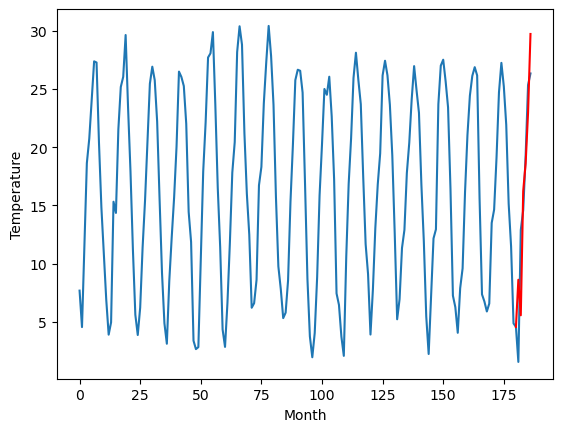

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.34		7.23		-0.11
2.56		3.56		1.00
15.12		14.75		-0.37
16.92		17.22		0.30
21.73		21.68		-0.05
27.76		28.94		1.18
[180, 181, 182, 183, 184, 185, 186]
[5.46, 7.232076379060746, 3.559150429964066, 14.750173302888872, 17.222881766557695, 21.675677272081376, 28.943298312425615]


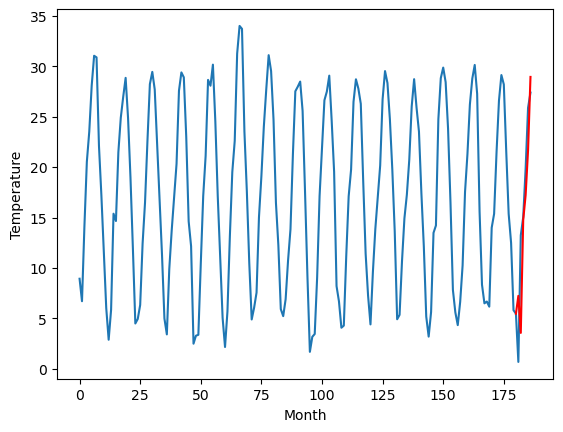

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.04		8.66		-0.38
4.67		5.43		0.76
15.38		15.38		-0.00
19.14		18.38		-0.76
23.69		22.86		-0.83
30.80		30.24		-0.56
[180, 181, 182, 183, 184, 185, 186]
[5.42, 8.662367366552353, 5.430695794820785, 15.378091119527816, 18.376986764669418, 22.864658616781234, 30.238840364217758]


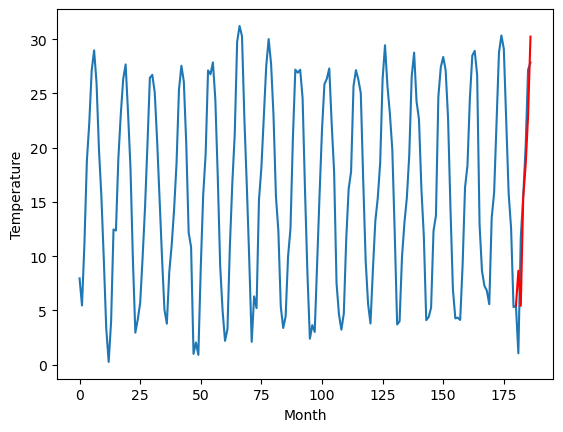

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.12		6.44		0.32
5.16		5.66		0.50
12.38		12.82		0.44
17.03		17.16		0.13
21.57		21.84		0.27
27.66		28.44		0.78
[180, 181, 182, 183, 184, 185, 186]
[2.17, 6.444106659889221, 5.657027206420898, 12.818772277832032, 17.162439785003663, 21.843040428161622, 28.444734058380128]


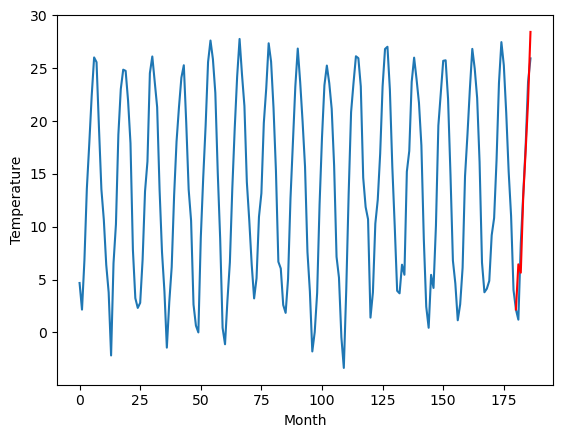

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    8.38   8.023115
1                 1   12.00  11.943730
2                 2    8.77   8.298860
3                 3   10.72  10.958901
4                 4   14.70  14.828540
5                 5   11.91  13.574831
6                 6   12.75  12.706099
7                 7    8.81   8.624481
8                 8    7.34   7.232076
9                 9    9.04   8.662367
10               10    6.12   6.444107


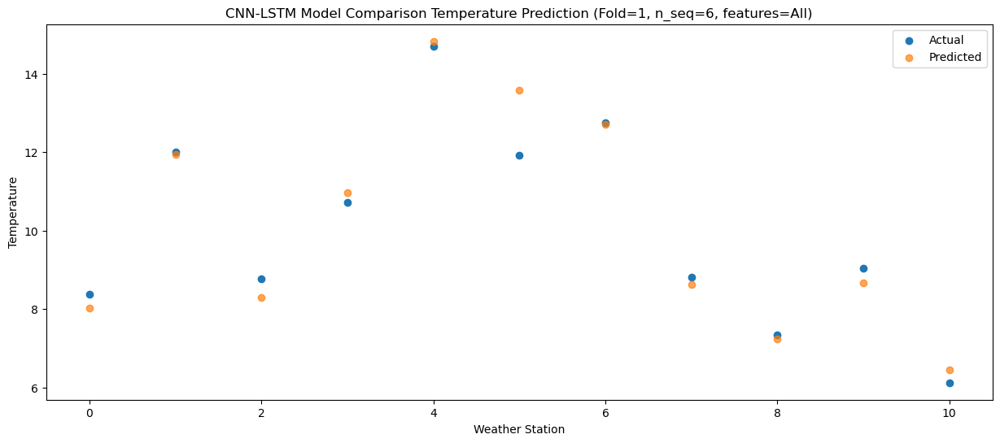

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    8.60   8.436755
1                 1   12.66  11.577968
2                 2    9.26   7.806581
3                 3    9.13   9.579058
4                 4   13.00  13.286756
5                 5   12.29  12.309708
6                 6   13.53  12.495051
7                 7    5.81   5.571894
8                 8    2.56   3.559150
9                 9    4.67   5.430696
10               10    5.16   5.657027


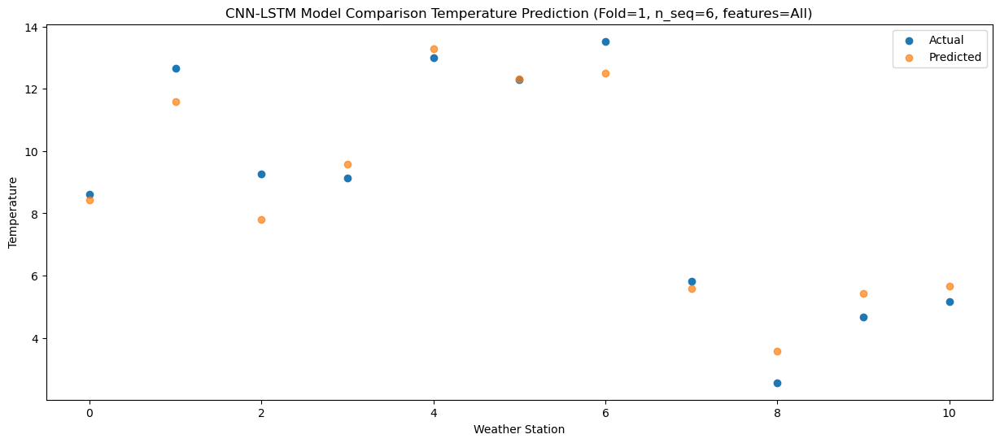

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   13.58  14.228640
1                 1   19.43  18.639190
2                 2   16.32  15.103507
3                 3   16.50  17.578336
4                 4   20.61  21.543603
5                 5   19.63  19.489270
6                 6   19.81  19.343774
7                 7   17.13  16.239864
8                 8   15.12  14.750173
9                 9   15.38  15.378091
10               10   12.38  12.818772


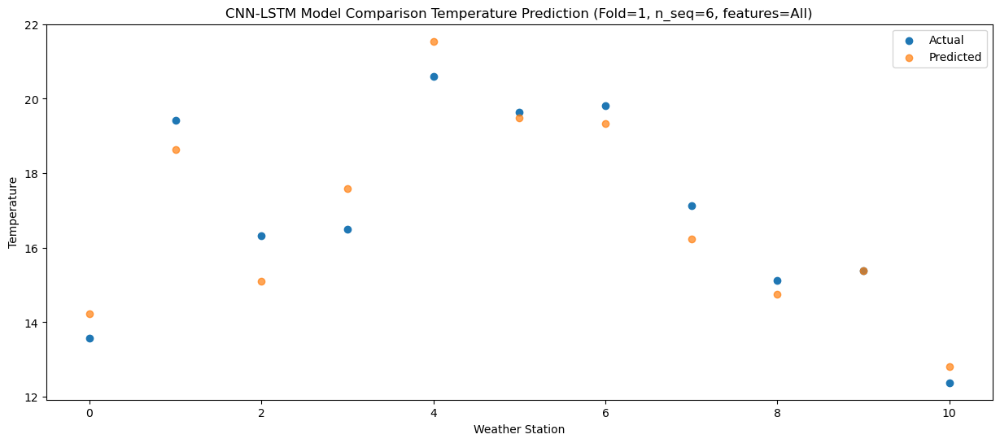

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   16.39  16.710019
1                 1   21.57  21.197924
2                 2   17.72  17.353663
3                 3   18.84  19.827404
4                 4   22.91  23.751069
5                 5   21.90  22.436211
6                 6   22.38  21.936788
7                 7   18.84  18.599253
8                 8   16.92  17.222882
9                 9   19.14  18.376987
10               10   17.03  17.162440


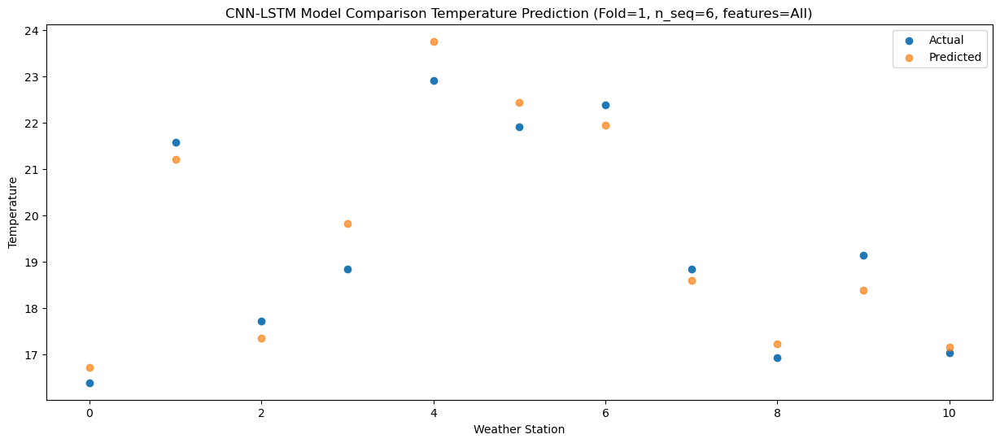

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   20.00  20.582970
1                 1   25.30  25.235485
2                 2   21.84  21.308557
3                 3   22.73  23.824906
4                 4   27.03  27.757903
5                 5   27.49  26.581304
6                 6   26.15  25.961077
7                 7   23.50  22.959272
8                 8   21.73  21.675677
9                 9   23.69  22.864659
10               10   21.57  21.843040


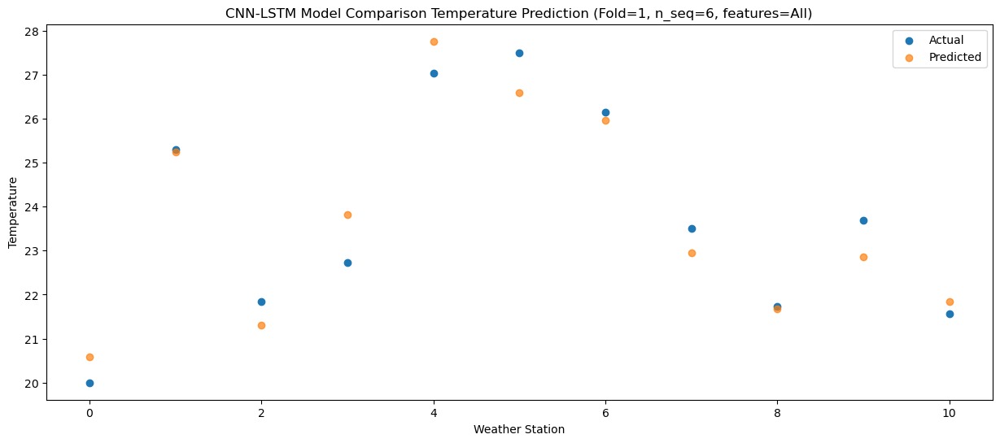

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   23.49  25.007708
1                 1   29.44  30.264984
2                 2   25.72  26.223432
3                 3   26.62  29.330043
4                 4   30.50  33.344187
5                 5   31.76  32.548052
6                 6   30.16  30.910179
7                 7   29.58  29.719030
8                 8   27.76  28.943298
9                 9   30.80  30.238840
10               10   27.66  28.444734


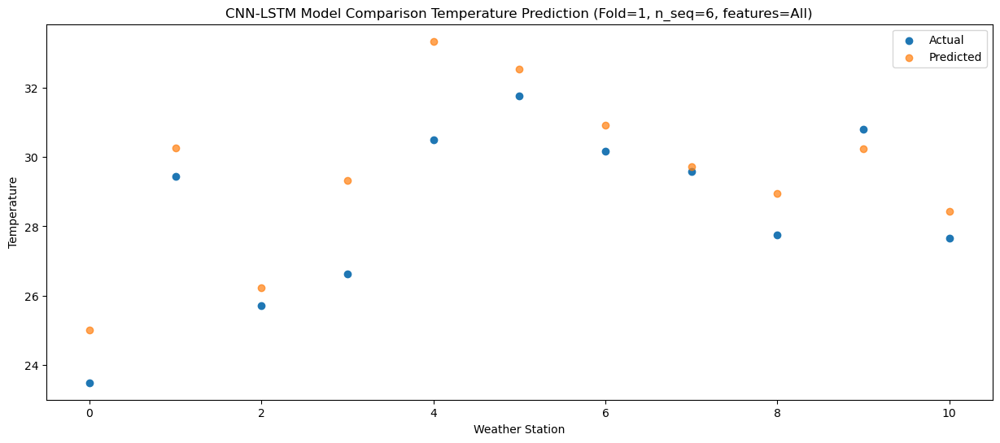

f, t:
[[ 8.38 12.    8.77 10.72 14.7  11.91 12.75  8.81  7.34  9.04  6.12]
 [ 8.6  12.66  9.26  9.13 13.   12.29 13.53  5.81  2.56  4.67  5.16]
 [13.58 19.43 16.32 16.5  20.61 19.63 19.81 17.13 15.12 15.38 12.38]
 [16.39 21.57 17.72 18.84 22.91 21.9  22.38 18.84 16.92 19.14 17.03]
 [20.   25.3  21.84 22.73 27.03 27.49 26.15 23.5  21.73 23.69 21.57]
 [23.49 29.44 25.72 26.62 30.5  31.76 30.16 29.58 27.76 30.8  27.66]]
[[ 8.02311504 11.94372965  8.29886021 10.95890074 14.82854002 13.57483122
  12.70609872  8.62448096  7.23207638  8.66236737  6.44410666]
 [ 8.43675533 11.57796834  7.80658068  9.57905834 13.28675597 12.30970833
  12.49505147  5.57189369  3.55915043  5.43069579  5.65702721]
 [14.22864023 18.63918994 15.10350717 17.57833641 21.54360335 19.48927042
  19.34377393 16.23986434 14.7501733  15.37809112 12.81877228]
 [16.7100195  21.19792436 17.35366262 19.82740395 23.75106876 22.4362106
  21.93678793 18.59925341 17.22288177 18.37698676 17.16243979]
 [20.58297005 25.23548482 21.308

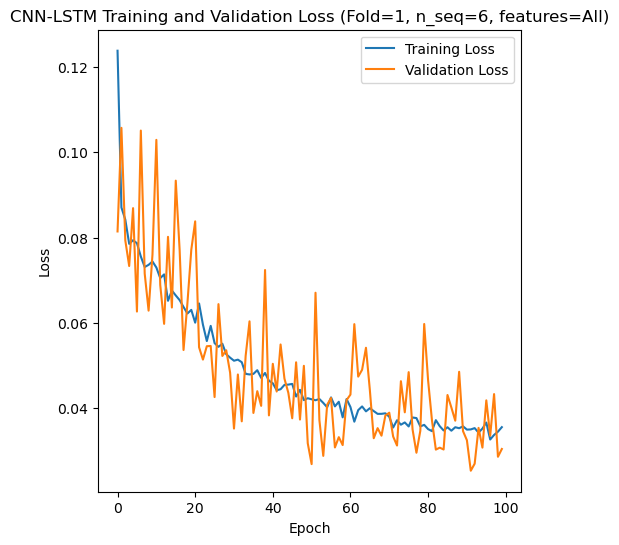

[[ 8.61  4.71 12.22 ... 22.49 18.22 13.52]
 [ 6.28  3.18  8.73 ... 22.36 17.39  7.52]
 [17.82 16.52 20.35 ... 28.79 25.32 22.93]
 ...
 [ 6.77  9.55 12.16 ... 24.55 20.29 10.24]
 [12.04 12.81 10.78 ... 23.32 20.33 13.93]
 [ 8.57  6.56 11.36 ... 21.36 16.14 12.65]]
Epoch 1/100
84/84 [==============================] - 52s 351ms/step - loss: 0.1244 - accuracy: 0.5833 - mae: 0.1063 - rmse: 0.1244 - mape: 18.2975 - pearson: 0.6859 - val_loss: 0.0465 - val_accuracy: 0.9000 - val_mae: 0.0386 - val_rmse: 0.0465 - val_mape: 6.9334 - val_pearson: 0.9421
Epoch 2/100
84/84 [==============================] - 19s 225ms/step - loss: 0.0917 - accuracy: 0.6310 - mae: 0.0738 - rmse: 0.0917 - mape: 12.8683 - pearson: 0.7103 - val_loss: 0.0920 - val_accuracy: 0.1000 - val_mae: 0.0727 - val_rmse: 0.0920 - val_mape: 12.6230 - val_pearson: 0.6491
Epoch 3/100
84/84 [==============================] - 19s 227ms/step - loss: 0.0855 - accuracy: 0.6190 - mae: 0.0700 - rmse: 0.0855 - mape: 12.3385 - pearson: 0.7216 

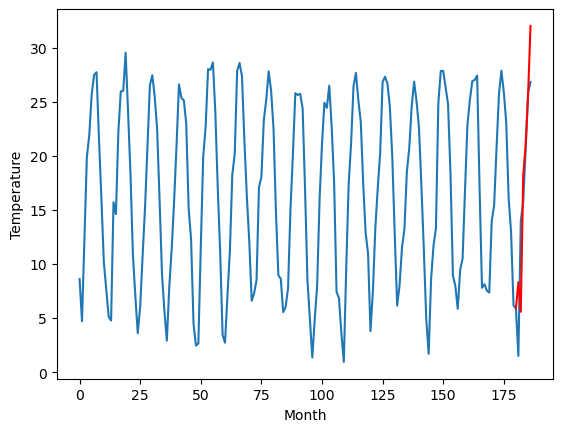

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.53		8.51		-0.02
4.49		4.88		0.39
14.68		17.34		2.66
18.44		21.27		2.83
23.62		26.25		2.63
30.87		34.12		3.25
[180, 181, 182, 183, 184, 185, 186]
[2.63, 8.513766684234142, 4.884233870208263, 17.343443312346935, 21.267822899520397, 26.247261681258678, 34.11830917805433]


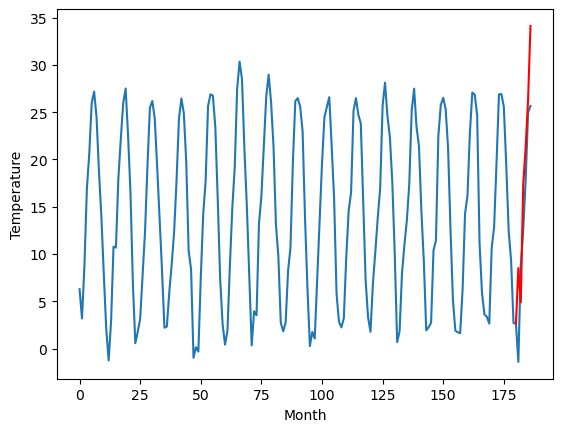

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.94		7.17		0.23
9.67		10.51		0.84
11.48		13.07		1.59
13.29		15.75		2.46
16.87		19.34		2.47
18.09		22.75		4.66
[180, 181, 182, 183, 184, 185, 186]
[16.55, 7.170545547008515, 10.506624906063081, 13.06620094060898, 15.74643751859665, 19.34292623281479, 22.752814977169038]


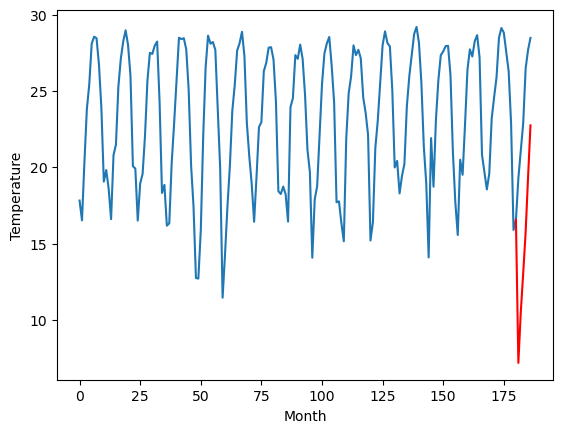

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.74		16.50		1.76
14.76		16.70		1.94
18.87		23.72		4.85
23.37		29.03		5.66
28.63		33.68		5.05
34.20		40.64		6.44
[180, 181, 182, 183, 184, 185, 186]
[-0.83, 16.50335545063019, 16.697431333065033, 23.721025235652924, 29.032624490261078, 33.683897264003754, 40.64074731588364]


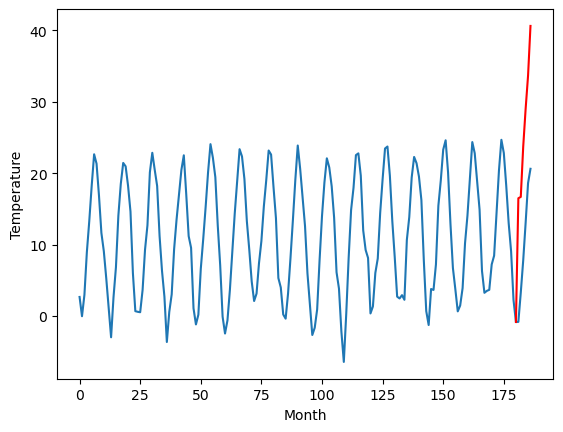

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
3.03		3.16		0.13
2.29		3.84		1.55
9.62		11.24		1.62
10.49		13.49		3.00
14.96		17.41		2.45
18.44		21.74		3.30
[180, 181, 182, 183, 184, 185, 186]
[11.52, 3.1635413098335268, 3.841696016788483, 11.23879932641983, 13.492847435474395, 17.40618180513382, 21.735521309375763]


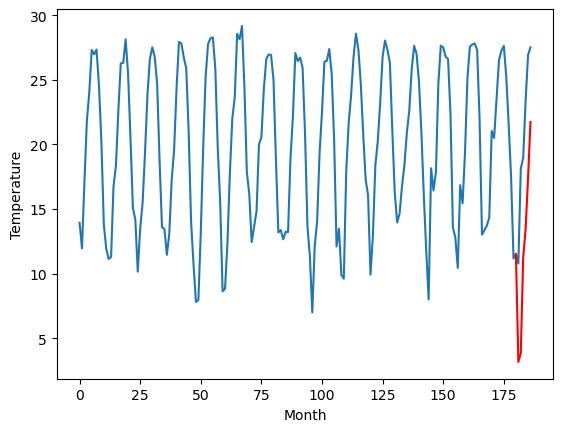

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.35		14.22		0.87
11.00		13.01		2.01
19.38		22.98		3.60
21.50		25.59		4.09
25.54		29.87		4.33
30.09		35.45		5.36
[180, 181, 182, 183, 184, 185, 186]
[11.47, 14.220653357505798, 13.00855010986328, 22.976213874816892, 25.589422407150266, 29.869600954055784, 35.453810396194456]


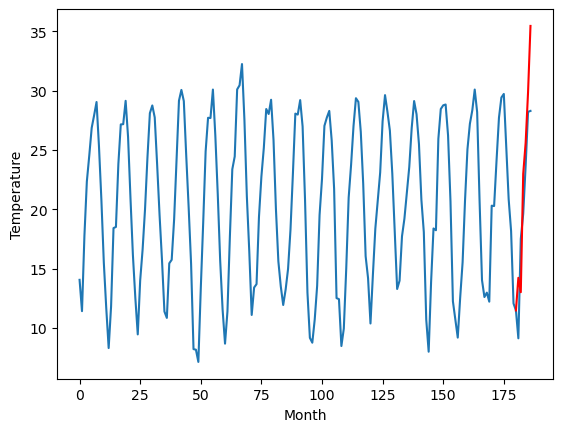

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.35		14.11		0.76
10.24		11.32		1.08
20.61		23.63		3.02
22.31		26.39		4.08
26.39		30.91		4.52
31.95		37.40		5.45
[180, 181, 182, 183, 184, 185, 186]
[7.75, 14.10655810236931, 11.318685787916184, 23.632751721143723, 26.387288588285447, 30.913778322935105, 37.40188028216362]


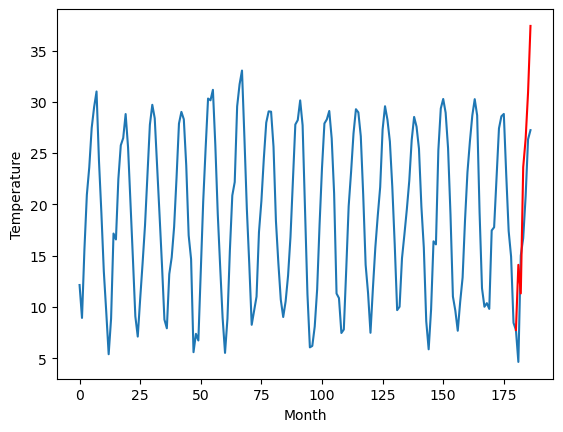

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.68		12.69		0.01
15.60		13.64		-1.96
18.70		18.52		-0.18
25.36		22.75		-2.61
30.37		27.09		-3.28
35.36		33.03		-2.33
[180, 181, 182, 183, 184, 185, 186]
[4.9, 12.687742009162903, 13.638255848884583, 18.521649613380433, 22.75338770389557, 27.091327443122864, 33.033341183662415]


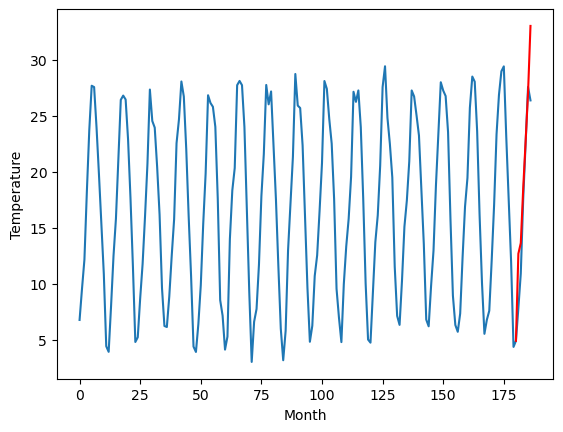

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.71		7.74		1.03
5.79		9.93		4.14
5.39		12.04		6.65
9.25		16.63		7.38
11.47		20.83		9.36
15.71		26.53		10.82
[180, 181, 182, 183, 184, 185, 186]
[14.14, 7.739309568405151, 9.930901308059692, 12.036119718551635, 16.632985372543335, 20.828152437210083, 26.52749897956848]


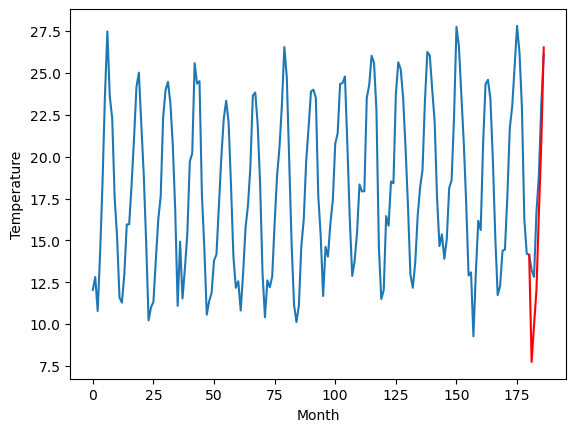

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.63		11.80		0.17
12.13		12.30		0.17
19.01		20.02		1.01
21.80		23.14		1.34
25.82		27.26		1.44
30.11		32.36		2.25
[180, 181, 182, 183, 184, 185, 186]
[5.55, 11.79564332306385, 12.295496278405189, 20.02062016069889, 23.14452438890934, 27.256264978051185, 32.359448724389075]


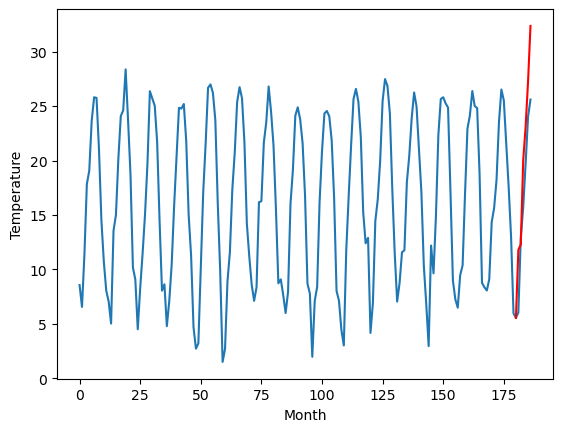

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.90		8.11		-0.79
10.25		7.87		-2.38
16.46		16.62		0.16
18.43		20.01		1.58
23.34		24.29		0.95
28.75		29.96		1.21
[180, 181, 182, 183, 184, 185, 186]
[3.19, 8.11199668765068, 7.87074417591095, 16.620660252571106, 20.011861271858216, 24.289102501869202, 29.95593351840973]


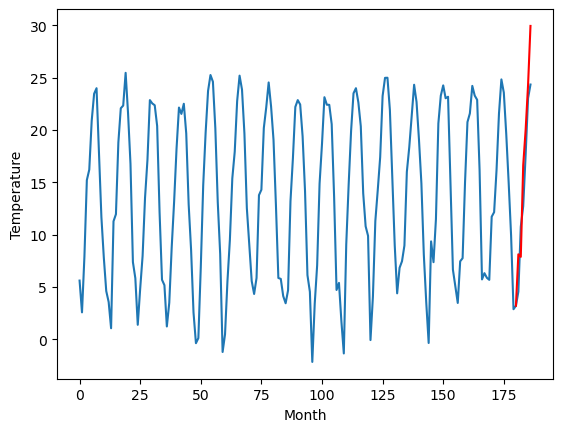

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    8.31   8.326454
1                 1    8.53   8.513767
2                 2    6.94   7.170546
3                 3   14.74  16.503355
4                 4    3.03   3.163541
5                 5   13.35  14.220653
6                 6   13.35  14.106558
7                 7   12.68  12.687742
8                 8    6.71   7.739310
9                 9   11.63  11.795643
10               10    8.90   8.111997


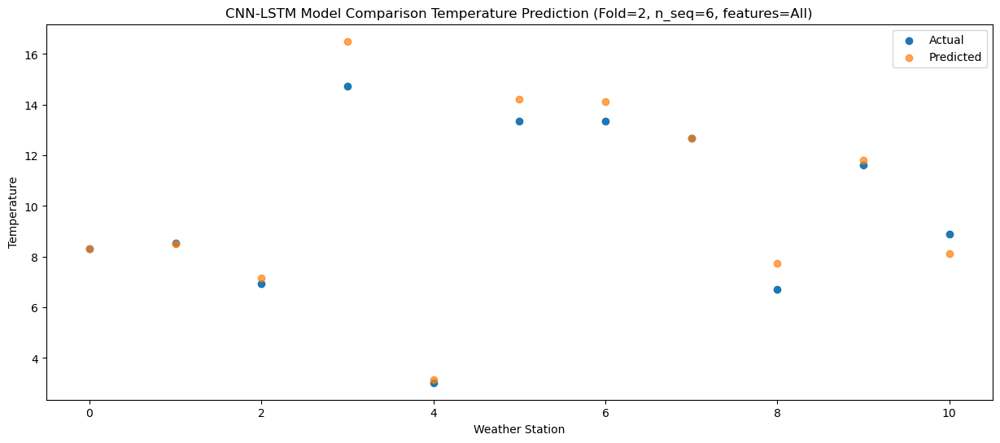

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.91   5.592392
1                 1    4.49   4.884234
2                 2    9.67  10.506625
3                 3   14.76  16.697431
4                 4    2.29   3.841696
5                 5   11.00  13.008550
6                 6   10.24  11.318686
7                 7   15.60  13.638256
8                 8    5.79   9.930901
9                 9   12.13  12.295496
10               10   10.25   7.870744


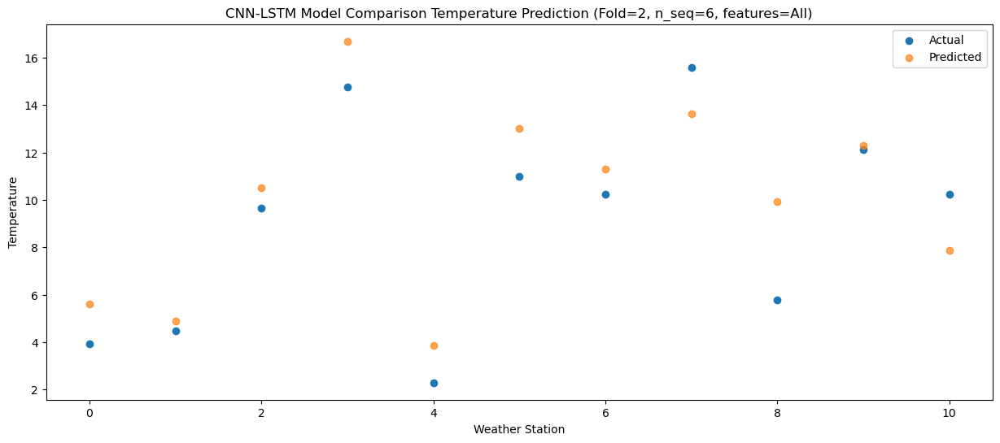

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   16.33  18.156462
1                 1   14.68  17.343443
2                 2   11.48  13.066201
3                 3   18.87  23.721025
4                 4    9.62  11.238799
5                 5   19.38  22.976214
6                 6   20.61  23.632752
7                 7   18.70  18.521650
8                 8    5.39  12.036120
9                 9   19.01  20.020620
10               10   16.46  16.620660


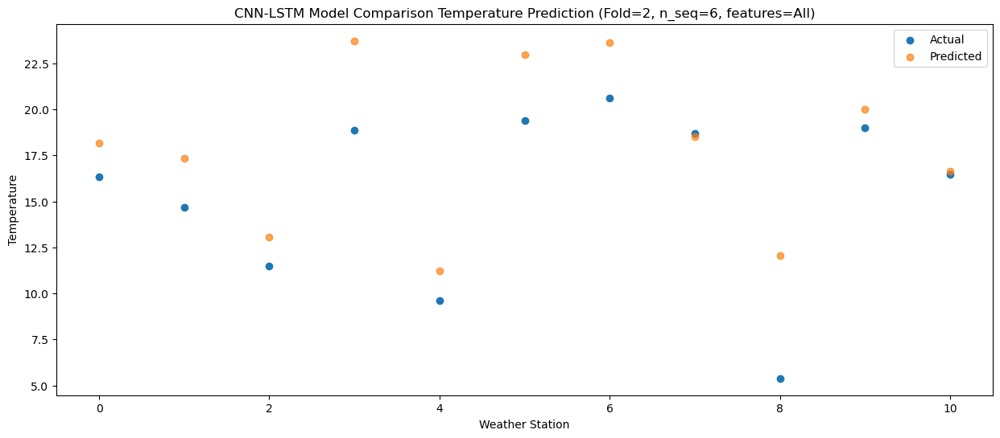

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   18.20  21.001734
1                 1   18.44  21.267823
2                 2   13.29  15.746438
3                 3   23.37  29.032624
4                 4   10.49  13.492847
5                 5   21.50  25.589422
6                 6   22.31  26.387289
7                 7   25.36  22.753388
8                 8    9.25  16.632985
9                 9   21.80  23.144524
10               10   18.43  20.011861


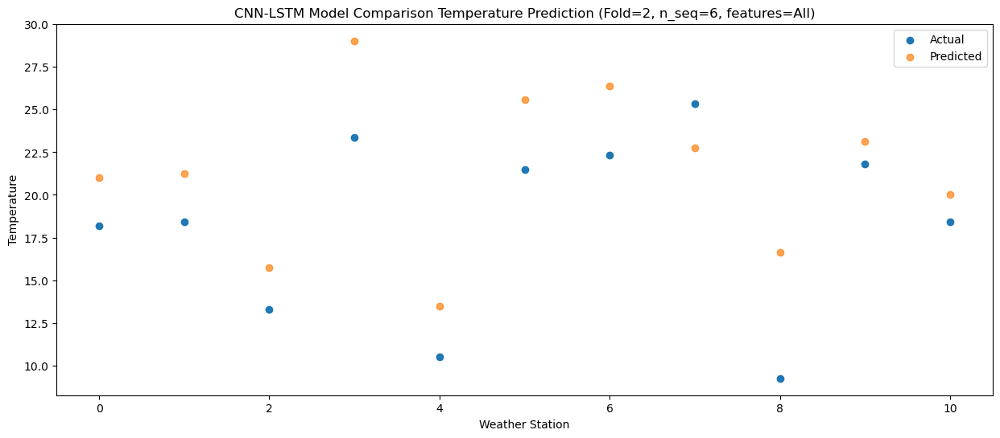

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   22.98  25.512658
1                 1   23.62  26.247262
2                 2   16.87  19.342926
3                 3   28.63  33.683897
4                 4   14.96  17.406182
5                 5   25.54  29.869601
6                 6   26.39  30.913778
7                 7   30.37  27.091327
8                 8   11.47  20.828152
9                 9   25.82  27.256265
10               10   23.34  24.289103


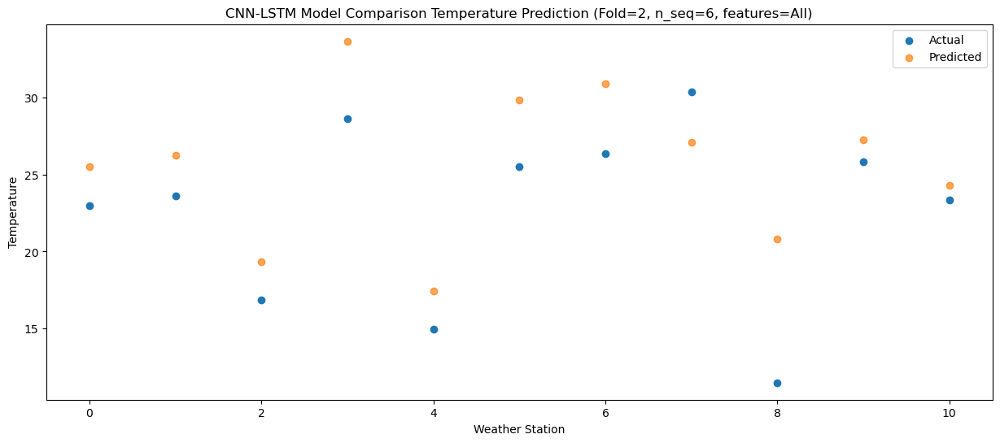

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   28.23  32.014223
1                 1   30.87  34.118309
2                 2   18.09  22.752815
3                 3   34.20  40.640747
4                 4   18.44  21.735521
5                 5   30.09  35.453810
6                 6   31.95  37.401880
7                 7   35.36  33.033341
8                 8   15.71  26.527499
9                 9   30.11  32.359449
10               10   28.75  29.955934


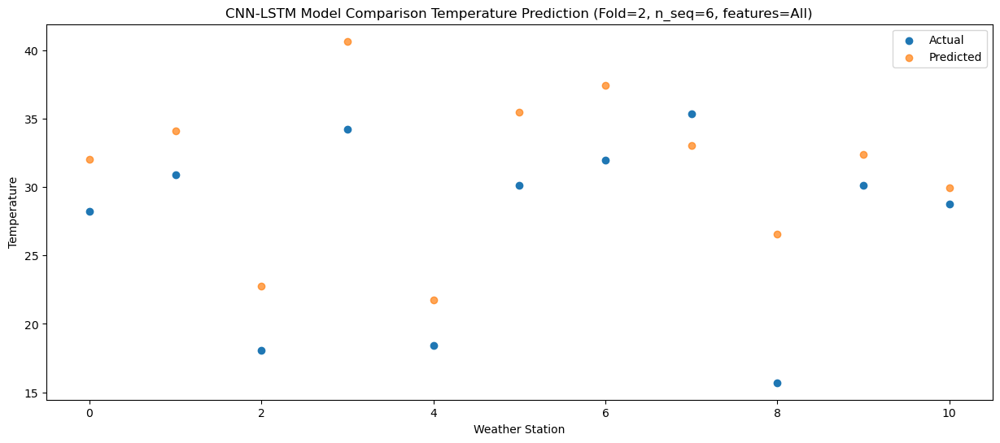

f, t:
[[ 8.31  8.53  6.94 14.74  3.03 13.35 13.35 12.68  6.71 11.63  8.9 ]
 [ 3.91  4.49  9.67 14.76  2.29 11.   10.24 15.6   5.79 12.13 10.25]
 [16.33 14.68 11.48 18.87  9.62 19.38 20.61 18.7   5.39 19.01 16.46]
 [18.2  18.44 13.29 23.37 10.49 21.5  22.31 25.36  9.25 21.8  18.43]
 [22.98 23.62 16.87 28.63 14.96 25.54 26.39 30.37 11.47 25.82 23.34]
 [28.23 30.87 18.09 34.2  18.44 30.09 31.95 35.36 15.71 30.11 28.75]]
[[ 8.32645371  8.51376668  7.17054555 16.50335545  3.16354131 14.22065336
  14.1065581  12.68774201  7.73930957 11.79564332  8.11199669]
 [ 5.59239247  4.88423387 10.50662491 16.69743133  3.84169602 13.00855011
  11.31868579 13.63825585  9.93090131 12.29549628  7.87074418]
 [18.15646221 17.34344331 13.06620094 23.72102524 11.23879933 22.97621387
  23.63275172 18.52164961 12.03611972 20.02062016 16.62066025]
 [21.00173428 21.2678229  15.74643752 29.03262449 13.49284744 25.58942241
  26.38728859 22.7533877  16.63298537 23.14452439 20.01186127]
 [25.51265814 26.24726168 19.34

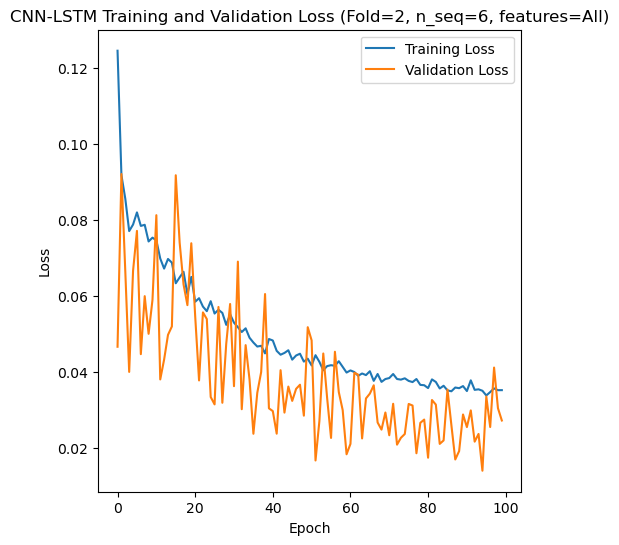

[[ 8.9   6.89 11.3  ... 22.19 16.88 13.54]
 [ 7.02  3.15 10.24 ... 22.31 18.92 11.32]
 [ 7.65  9.7   9.44 ... 25.68 20.65 11.46]
 ...
 [ 9.57 11.93 12.22 ... 30.9  25.01 12.37]
 [ 9.04  9.3   8.59 ... 17.72 17.26 10.73]
 [ 3.2   0.4   3.78 ... 18.92 14.39 10.04]]
Epoch 1/100
84/84 [==============================] - 30s 168ms/step - loss: 0.1090 - accuracy: 0.6667 - mae: 0.0944 - rmse: 0.1090 - mape: 16.8776 - pearson: 0.7343 - val_loss: 0.0809 - val_accuracy: 0.7000 - val_mae: 0.0644 - val_rmse: 0.0809 - val_mape: 12.8204 - val_pearson: 0.7638
Epoch 2/100
84/84 [==============================] - 10s 116ms/step - loss: 0.0832 - accuracy: 0.7262 - mae: 0.0682 - rmse: 0.0832 - mape: 12.2852 - pearson: 0.7487 - val_loss: 0.0711 - val_accuracy: 0.7000 - val_mae: 0.0566 - val_rmse: 0.0711 - val_mape: 11.0555 - val_pearson: 0.8010
Epoch 3/100
84/84 [==============================] - 15s 183ms/step - loss: 0.0818 - accuracy: 0.7381 - mae: 0.0668 - rmse: 0.0818 - mape: 12.0164 - pearson: 0.7675

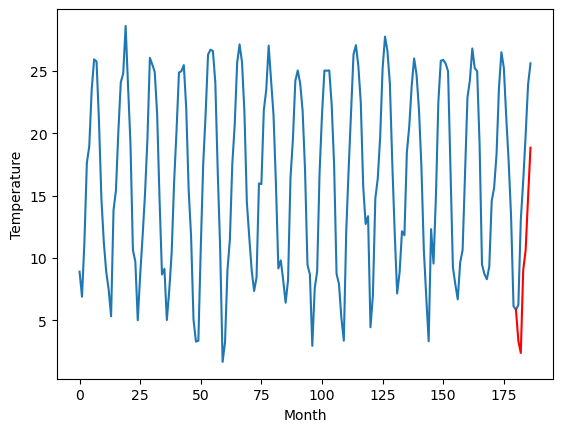

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.75		8.46		0.71
4.03		3.72		-0.31
16.00		15.37		-0.63
17.86		17.37		-0.49
22.08		22.29		0.21
28.79		27.96		-0.83
[180, 181, 182, 183, 184, 185, 186]
[3.2, 8.463466846942902, 3.7157847523689274, 15.372408592700959, 17.371464574337004, 22.28763564825058, 27.963512742519377]


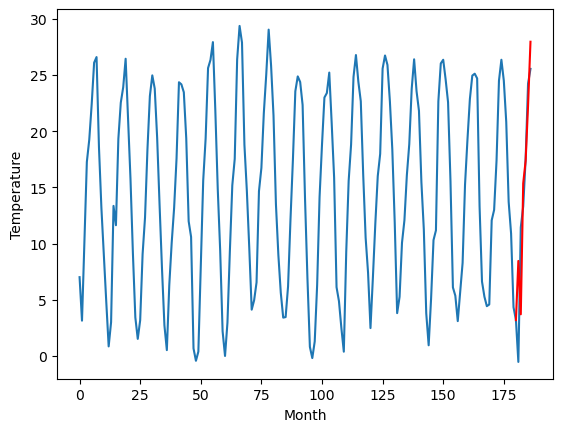

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.28		7.45		-0.83
10.58		7.10		-3.48
11.73		10.48		-1.25
17.46		13.60		-3.86
22.26		18.07		-4.19
27.11		23.45		-3.66
[180, 181, 182, 183, 184, 185, 186]
[8.48, 7.450272966623306, 7.095447678565979, 10.476884503364563, 13.597180981636047, 18.07140507221222, 23.454242367744445]


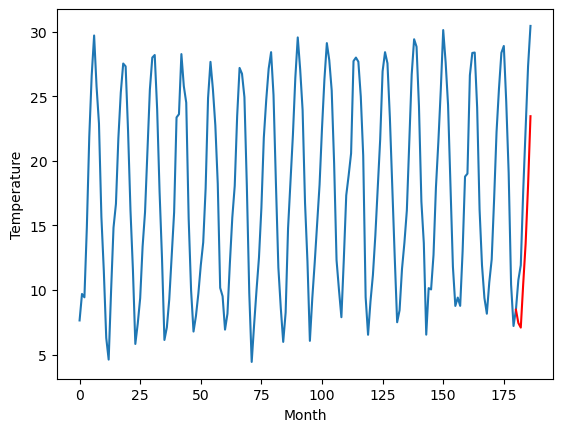

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.19		6.93		0.74
4.87		4.29		-0.58
15.08		13.34		-1.74
17.43		15.65		-1.78
21.50		20.31		-1.19
27.42		25.50		-1.92
[180, 181, 182, 183, 184, 185, 186]
[1.55, 6.928956055641175, 4.2853141069412235, 13.337853932380677, 15.654036068916321, 20.308382058143614, 25.49750473499298]


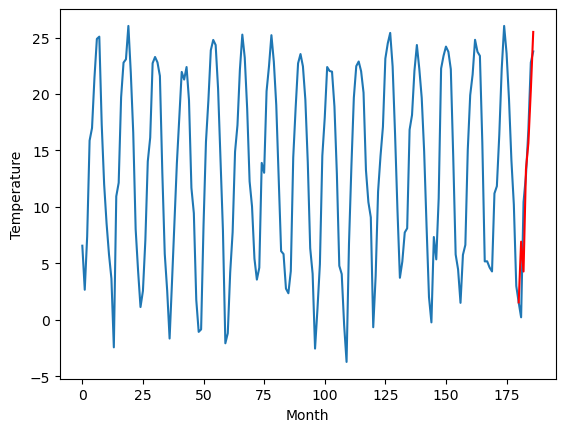

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.10		5.55		0.45
1.23		0.35		-0.88
14.31		12.63		-1.68
17.60		15.31		-2.29
22.17		20.47		-1.70
29.65		26.79		-2.86
[180, 181, 182, 183, 184, 185, 186]
[1.08, 5.546776480674744, 0.3536250066757205, 12.631182379722595, 15.31098289012909, 20.474290080070496, 26.78674430370331]


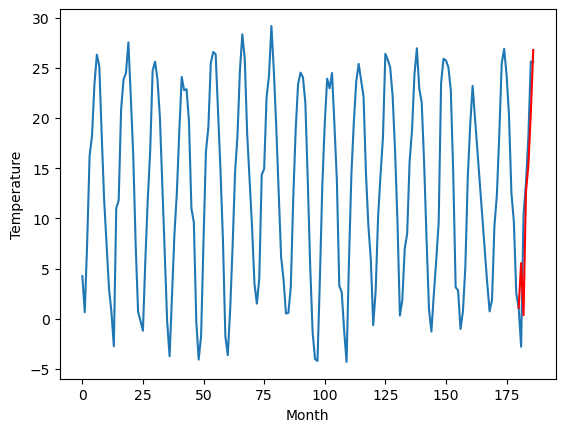

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
2.80		3.12		0.32
0.08		-1.22		-1.30
11.41		10.10		-1.31
14.86		12.79		-2.07
19.14		17.80		-1.34
25.85		23.84		-2.01
[180, 181, 182, 183, 184, 185, 186]
[0.21, 3.122613310813904, -1.220863938331604, 10.09672486782074, 12.787440180778503, 17.803826689720154, 23.839351534843445]


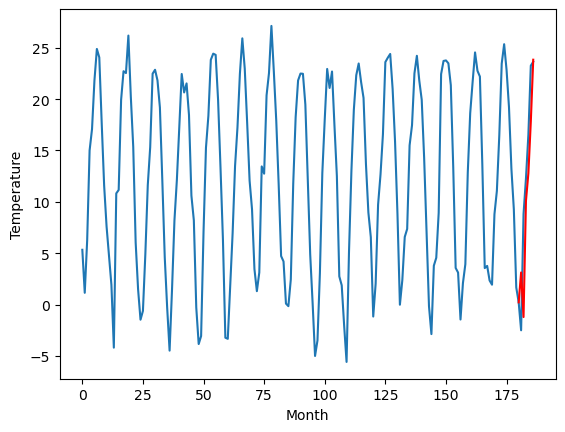

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.60		5.51		-0.09
5.70		4.06		-1.64
8.67		9.73		1.06
13.45		12.48		-0.97
18.50		17.07		-1.43
25.89		22.48		-3.41
[180, 181, 182, 183, 184, 185, 186]
[-8.22, 5.510214658379555, 4.062164397835732, 9.734344573616982, 12.483204694390297, 17.071381898522375, 22.478298516869543]


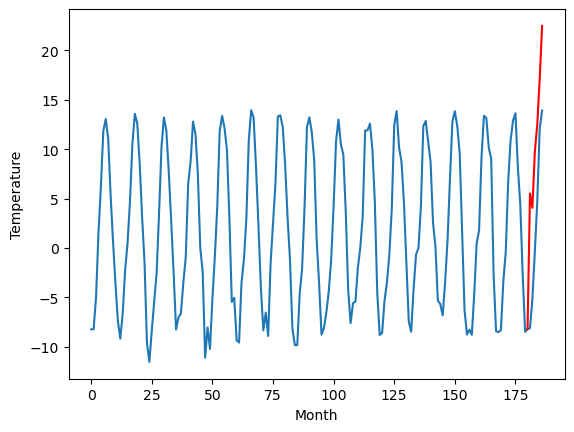

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
-7.69		-7.88		-0.19
-4.84		-8.62		-3.78
-3.24		-4.60		-1.36
4.73		-1.47		-6.20
9.16		3.07		-6.09
16.80		8.62		-8.18
[180, 181, 182, 183, 184, 185, 186]
[10.04, -7.875759830474854, -8.624036242961884, -4.595626285076142, -1.4724406504631045, 3.0666499829292295, 8.617771694660187]


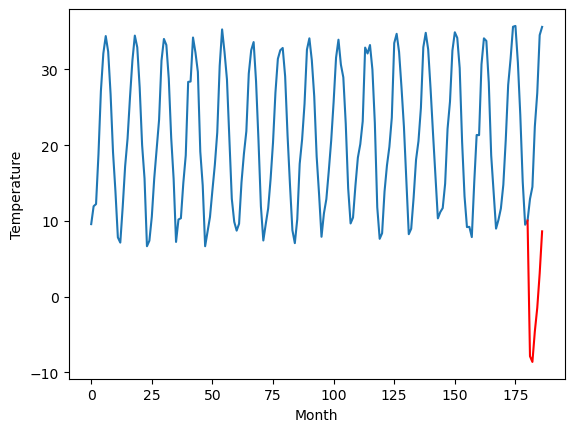

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.79		10.18		-0.61
11.72		10.11		-1.61
11.50		13.11		1.61
13.69		16.02		2.33
17.98		20.39		2.41
19.68		25.50		5.82
[180, 181, 182, 183, 184, 185, 186]
[9.17, 10.183178491592408, 10.108949243724346, 13.112103283107281, 16.017319500148297, 20.394234001338482, 25.504197418391705]


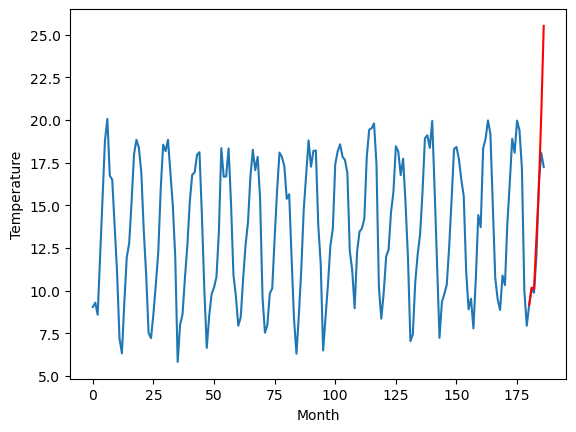

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.02		7.71		1.69
5.90		6.19		0.29
10.90		12.72		1.82
15.52		16.49		0.97
20.35		21.31		0.96
26.22		27.35		1.13
[180, 181, 182, 183, 184, 185, 186]
[0.94, 7.706433453559875, 6.193212785720824, 12.718945302963256, 16.48511103630066, 21.31417254447937, 27.347395219802856]


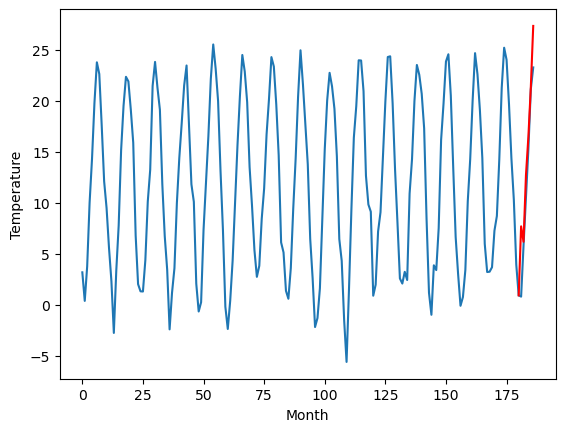

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
1.64		1.84		0.20
0.84		-0.02		-0.86
8.03		7.32		-0.71
12.90		10.85		-2.05
17.16		15.67		-1.49
23.33		21.58		-1.75
[180, 181, 182, 183, 184, 185, 186]
[-0.13, 1.8396510601043703, -0.020065355300903143, 7.31979603767395, 10.848077964782714, 15.672740650177001, 21.576316547393798]


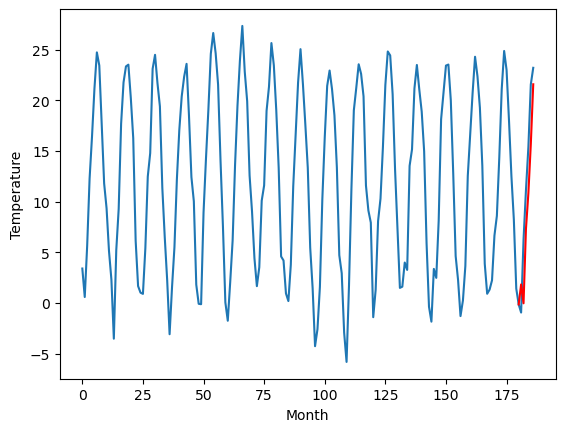

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    2.92   3.343578
1                 1    7.75   8.463467
2                 2    8.28   7.450273
3                 3    6.19   6.928956
4                 4    5.10   5.546776
5                 5    2.80   3.122613
6                 6    5.60   5.510215
7                 7   -7.69  -7.875760
8                 8   10.79  10.183178
9                 9    6.02   7.706433
10               10    1.64   1.839651


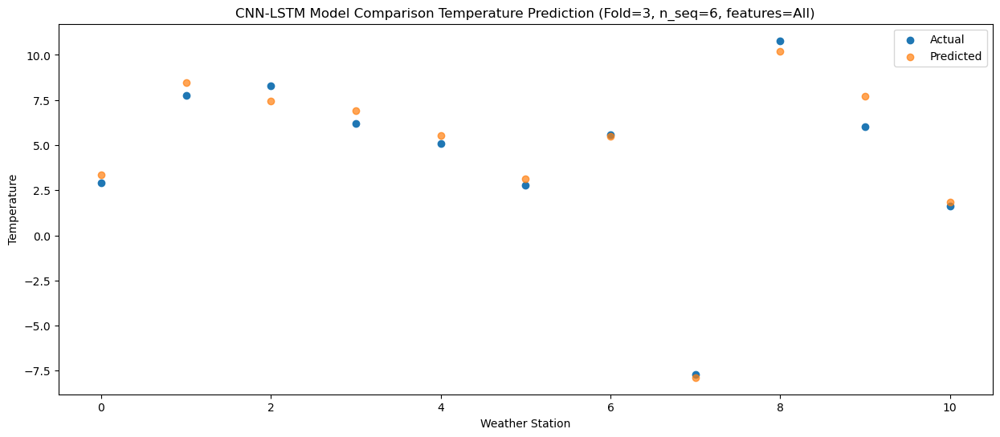

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.29   2.379734
1                 1    4.03   3.715785
2                 2   10.58   7.095448
3                 3    4.87   4.285314
4                 4    1.23   0.353625
5                 5    0.08  -1.220864
6                 6    5.70   4.062164
7                 7   -4.84  -8.624036
8                 8   11.72  10.108949
9                 9    5.90   6.193213
10               10    0.84  -0.020065


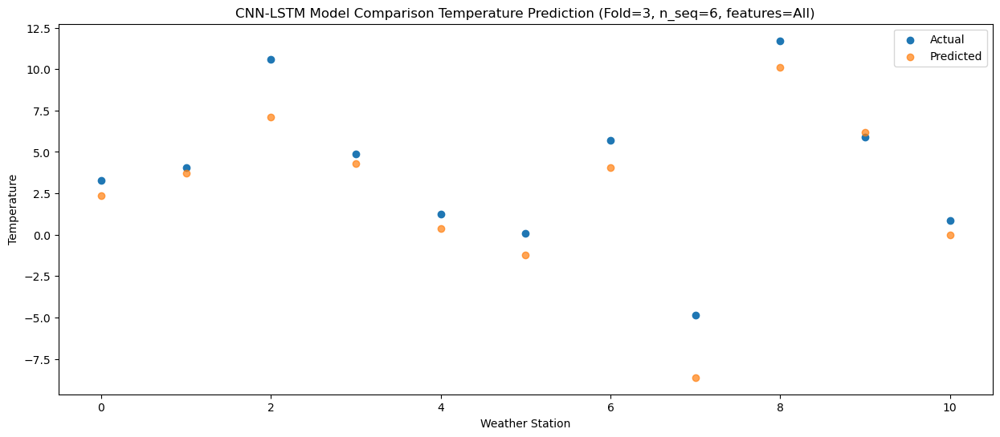

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   10.09   9.038225
1                 1   16.00  15.372409
2                 2   11.73  10.476885
3                 3   15.08  13.337854
4                 4   14.31  12.631182
5                 5   11.41  10.096725
6                 6    8.67   9.734345
7                 7   -3.24  -4.595626
8                 8   11.50  13.112103
9                 9   10.90  12.718945
10               10    8.03   7.319796


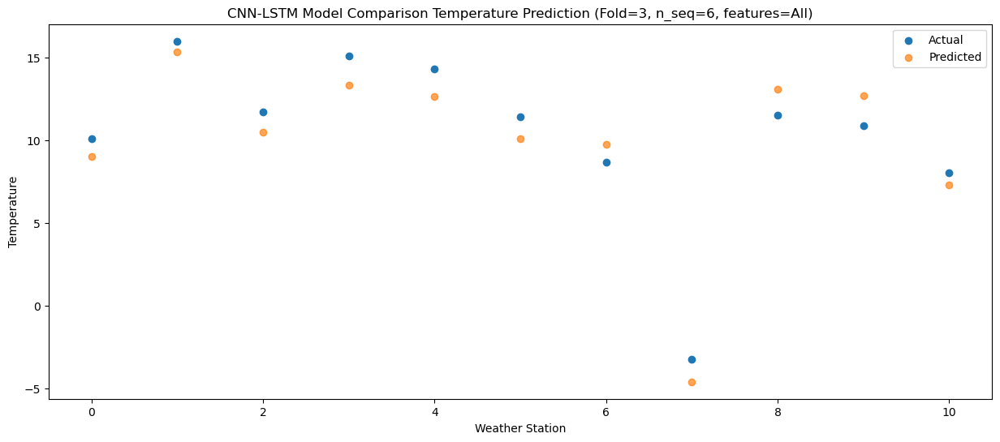

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   13.25  10.614835
1                 1   17.86  17.371465
2                 2   17.46  13.597181
3                 3   17.43  15.654036
4                 4   17.60  15.310983
5                 5   14.86  12.787440
6                 6   13.45  12.483205
7                 7    4.73  -1.472441
8                 8   13.69  16.017320
9                 9   15.52  16.485111
10               10   12.90  10.848078


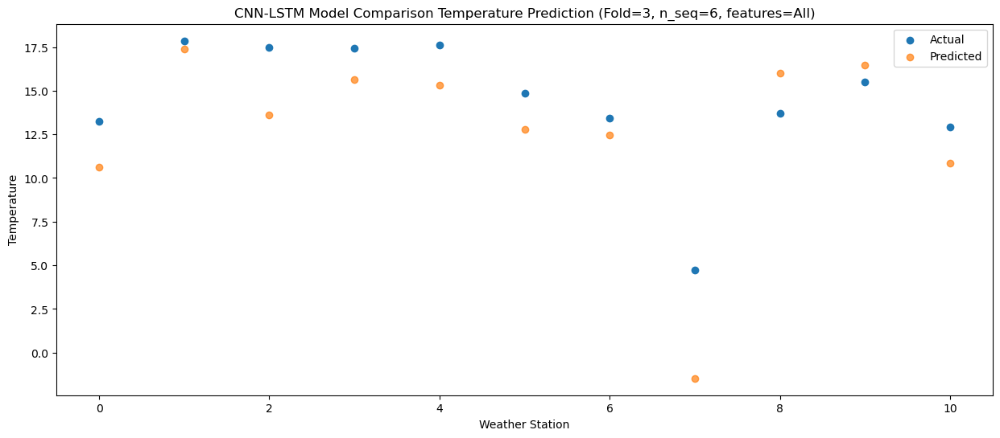

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   16.91  14.846555
1                 1   22.08  22.287636
2                 2   22.26  18.071405
3                 3   21.50  20.308382
4                 4   22.17  20.474290
5                 5   19.14  17.803827
6                 6   18.50  17.071382
7                 7    9.16   3.066650
8                 8   17.98  20.394234
9                 9   20.35  21.314173
10               10   17.16  15.672741


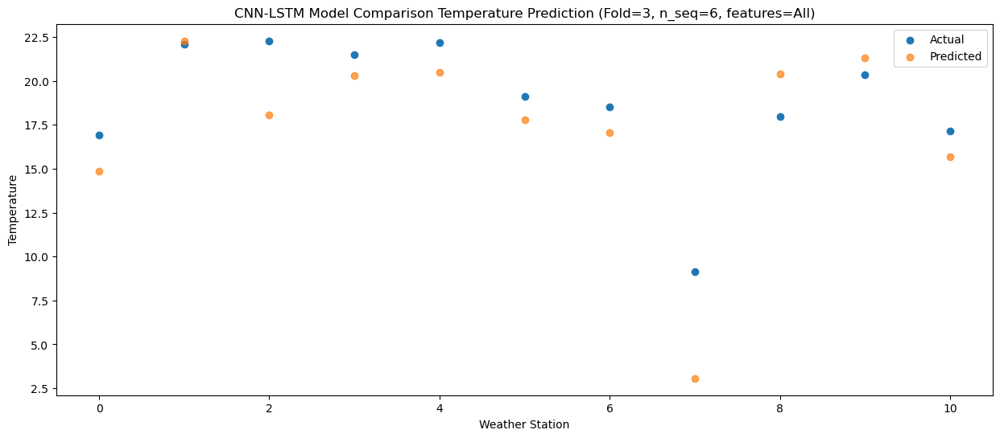

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   20.97  18.841298
1                 1   28.79  27.963513
2                 2   27.11  23.454242
3                 3   27.42  25.497505
4                 4   29.65  26.786744
5                 5   25.85  23.839352
6                 6   25.89  22.478299
7                 7   16.80   8.617772
8                 8   19.68  25.504197
9                 9   26.22  27.347395
10               10   23.33  21.576317


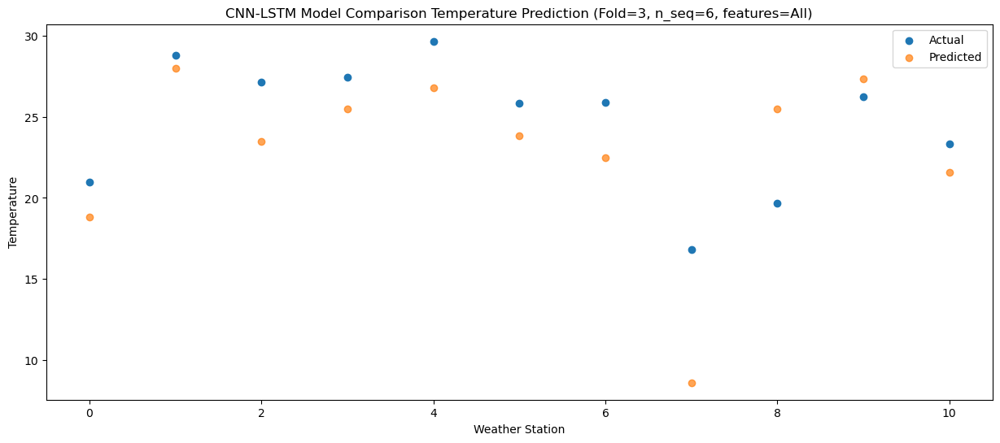

f, t:
[[ 2.92  7.75  8.28  6.19  5.1   2.8   5.6  -7.69 10.79  6.02  1.64]
 [ 3.29  4.03 10.58  4.87  1.23  0.08  5.7  -4.84 11.72  5.9   0.84]
 [10.09 16.   11.73 15.08 14.31 11.41  8.67 -3.24 11.5  10.9   8.03]
 [13.25 17.86 17.46 17.43 17.6  14.86 13.45  4.73 13.69 15.52 12.9 ]
 [16.91 22.08 22.26 21.5  22.17 19.14 18.5   9.16 17.98 20.35 17.16]
 [20.97 28.79 27.11 27.42 29.65 25.85 25.89 16.8  19.68 26.22 23.33]]
[[ 3.34357789e+00  8.46346685e+00  7.45027297e+00  6.92895606e+00
   5.54677648e+00  3.12261331e+00  5.51021466e+00 -7.87575983e+00
   1.01831785e+01  7.70643345e+00  1.83965106e+00]
 [ 2.37973430e+00  3.71578475e+00  7.09544768e+00  4.28531411e+00
   3.53625007e-01 -1.22086394e+00  4.06216440e+00 -8.62403624e+00
   1.01089492e+01  6.19321279e+00 -2.00653553e-02]
 [ 9.03822496e+00  1.53724086e+01  1.04768845e+01  1.33378539e+01
   1.26311824e+01  1.00967249e+01  9.73434457e+00 -4.59562629e+00
   1.31121033e+01  1.27189453e+01  7.31979604e+00]
 [ 1.06148348e+01  1.73714646e

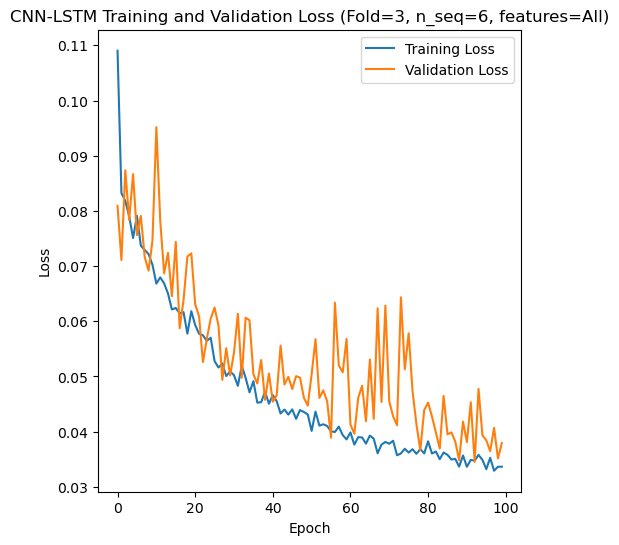

[[ 4.89  1.26  7.78 ... 22.59 18.46  9.82]
 [15.38 13.87 17.63 ... 26.66 22.89 20.2 ]
 [11.49  8.39 14.48 ... 24.97 20.83 17.82]
 ...
 [ 7.64  3.61 10.44 ... 21.3  17.62 11.34]
 [ 4.26  0.29  5.21 ... 21.47 15.54  9.34]
 [ 3.62 -0.32  6.05 ... 19.99 14.92  8.29]]
Epoch 1/100
84/84 [==============================] - 53s 350ms/step - loss: 0.1155 - accuracy: 0.6548 - mae: 0.1001 - rmse: 0.1155 - mape: 17.0056 - pearson: 0.6788 - val_loss: 0.1156 - val_accuracy: 0.1000 - val_mae: 0.0928 - val_rmse: 0.1156 - val_mape: 16.7621 - val_pearson: 0.5587
Epoch 2/100
84/84 [==============================] - 19s 221ms/step - loss: 0.0849 - accuracy: 0.6310 - mae: 0.0692 - rmse: 0.0849 - mape: 12.1060 - pearson: 0.7267 - val_loss: 0.1040 - val_accuracy: 0.2000 - val_mae: 0.0803 - val_rmse: 0.1040 - val_mape: 13.3490 - val_pearson: 0.6830
Epoch 3/100
84/84 [==============================] - 19s 231ms/step - loss: 0.0793 - accuracy: 0.6071 - mae: 0.0640 - rmse: 0.0793 - mape: 11.1606 - pearson: 0.7278

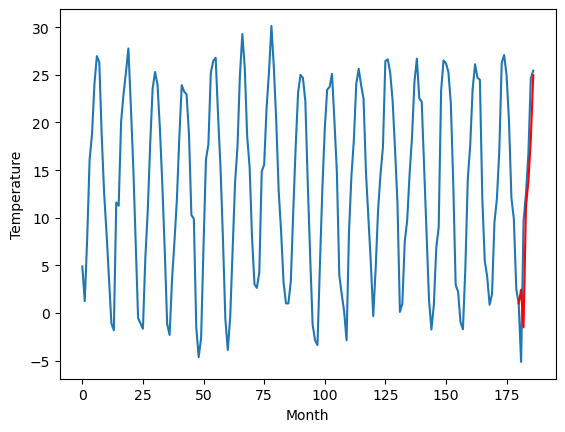

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.59		5.46		-0.13
9.02		8.17		-0.85
10.62		9.70		-0.92
12.06		11.94		-0.12
16.10		14.05		-2.05
17.73		15.93		-1.80
[180, 181, 182, 183, 184, 185, 186]
[14.25, 5.456547572612762, 8.166081502437592, 9.704473807811738, 11.944343163967133, 14.04939086675644, 15.930047109127045]


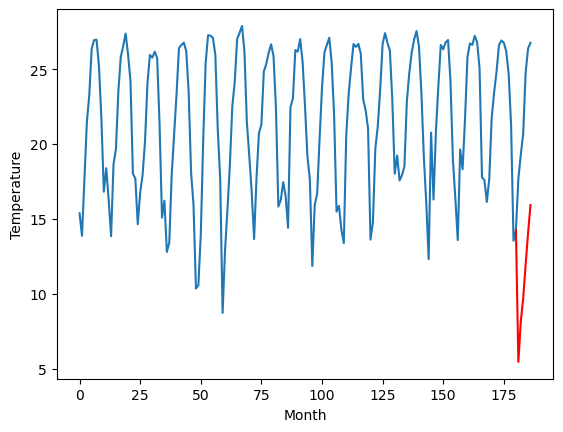

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
15.41		15.27		-0.14
13.49		15.17		1.68
22.82		22.15		-0.67
23.89		24.03		0.14
28.36		27.02		-1.34
32.62		30.67		-1.95
[180, 181, 182, 183, 184, 185, 186]
[9.06, 15.265612554848195, 15.167937037646771, 22.14666533201933, 24.03027665346861, 27.01793467730284, 30.6714779111743]


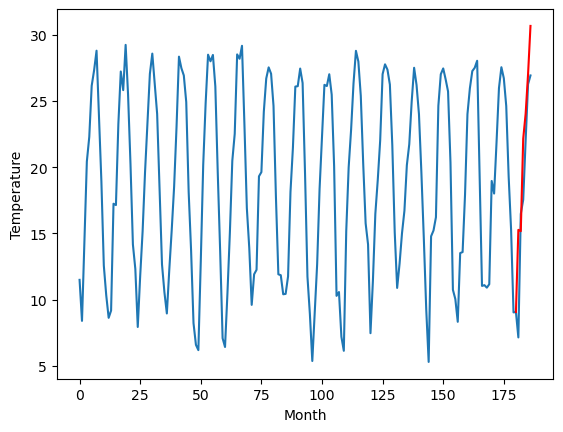

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.57		10.95		0.38
7.11		8.91		1.80
18.07		18.83		0.76
19.76		20.95		1.19
23.92		24.59		0.67
29.60		29.71		0.11
[180, 181, 182, 183, 184, 185, 186]
[7.48, 10.953699579238892, 8.90776967048645, 18.834545602798464, 20.95214532852173, 24.59348176956177, 29.70852493286133]


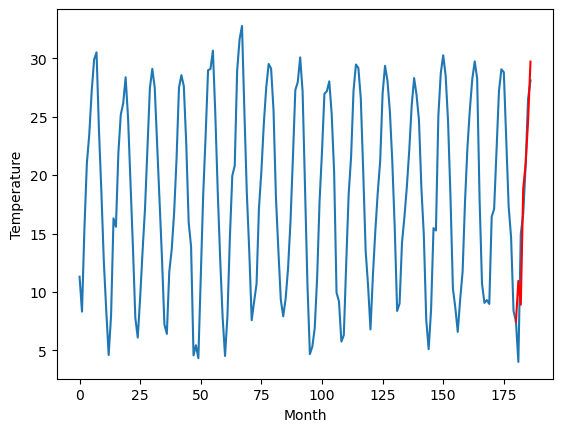

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.71		10.74		0.03
6.82		8.61		1.79
17.74		18.60		0.86
19.92		20.78		0.86
23.45		24.46		1.01
30.30		29.69		-0.61
[180, 181, 182, 183, 184, 185, 186]
[7.33, 10.737628755569459, 8.609407720565796, 18.595876989364626, 20.783183393478396, 24.46356731414795, 29.68525510787964]


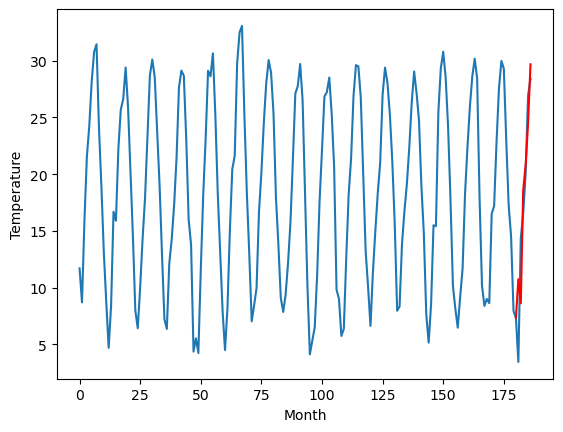

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.59		11.48		0.89
9.02		11.04		2.02
18.27		17.56		-0.71
20.50		20.23		-0.27
25.99		23.47		-2.52
30.95		27.86		-3.09
[180, 181, 182, 183, 184, 185, 186]
[6.59, 11.481857406497001, 11.040373730063438, 17.563759254813192, 20.227937387824056, 23.467553781867025, 27.8602873557806]


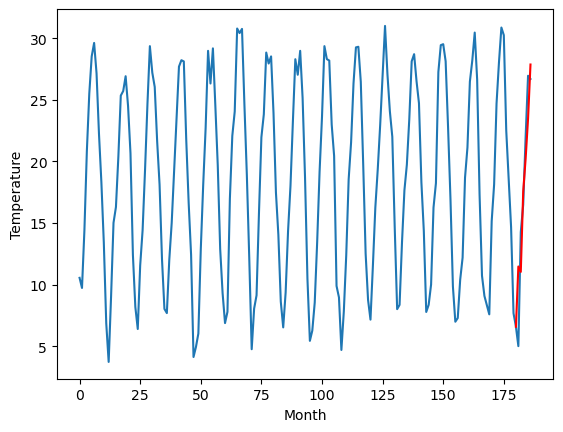

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.79		10.28		-0.51
11.46		11.37		-0.09
17.86		16.28		-1.58
20.59		18.70		-1.89
24.04		21.49		-2.55
28.06		24.82		-3.24
[180, 181, 182, 183, 184, 185, 186]
[6.04, 10.277192351818085, 11.368445870876313, 16.28425264120102, 18.699380395412447, 21.491492984294894, 24.820243594646456]


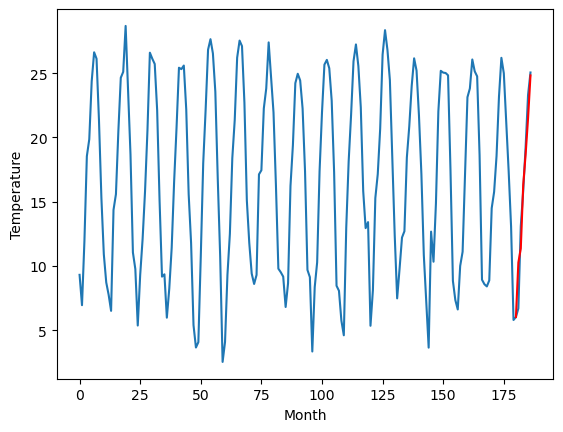

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.65		8.49		0.84
4.04		6.11		2.07
16.31		16.77		0.46
18.21		19.02		0.81
22.25		22.84		0.59
28.55		28.33		-0.22
[180, 181, 182, 183, 184, 185, 186]
[3.13, 8.492401487827301, 6.107046015262604, 16.774470217227936, 19.021760590076447, 22.84240139245987, 28.33418787240982]


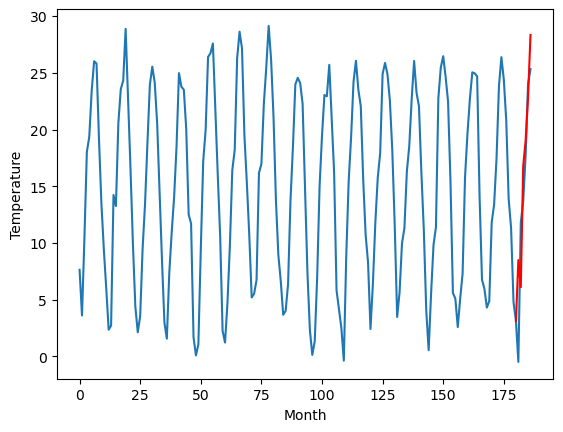

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.06		6.10		0.04
2.70		3.90		1.20
14.67		14.06		-0.61
18.32		17.21		-1.11
22.73		21.25		-1.48
29.97		27.36		-2.61
[180, 181, 182, 183, 184, 185, 186]
[-0.29, 6.1005238437652585, 3.9000846290588376, 14.06287015914917, 17.210191144943238, 21.250942125320435, 27.35724581718445]


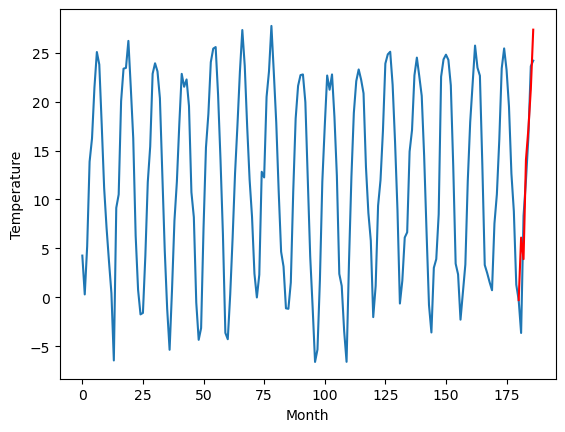

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
2.23		2.72		0.49
-2.21		-0.71		1.50
11.65		11.41		-0.24
15.36		14.36		-1.00
20.14		18.73		-1.41
27.53		25.45		-2.08
[180, 181, 182, 183, 184, 185, 186]
[-1.03, 2.7248337364196775, -0.7143151664733889, 11.405426273345947, 14.358730325698852, 18.733951578140257, 25.450031766891478]


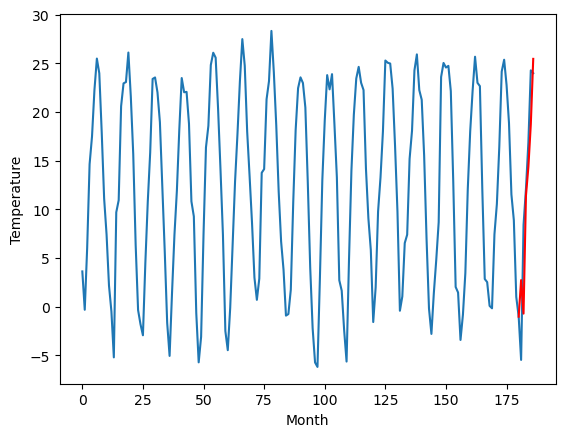

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
1.70		1.82		0.12
-0.54		0.42		0.96
9.35		8.82		-0.53
13.15		12.67		-0.48
17.68		16.67		-1.01
24.57		22.76		-1.81
[180, 181, 182, 183, 184, 185, 186]
[-2.29, 1.8210297775268556, 0.42254733562469493, 8.819401736259461, 12.6731564950943, 16.665196175575257, 22.761375184059144]


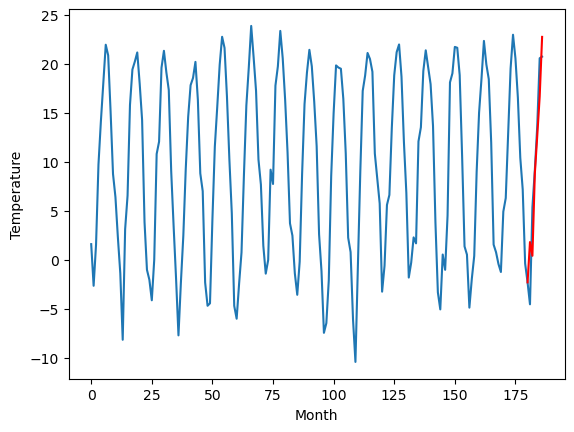

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    2.11   2.447135
1                 1    5.59   5.456548
2                 2   15.41  15.265613
3                 3   10.57  10.953700
4                 4   10.71  10.737629
5                 5   10.59  11.481857
6                 6   10.79  10.277192
7                 7    7.65   8.492401
8                 8    6.06   6.100524
9                 9    2.23   2.724834
10               10    1.70   1.821030


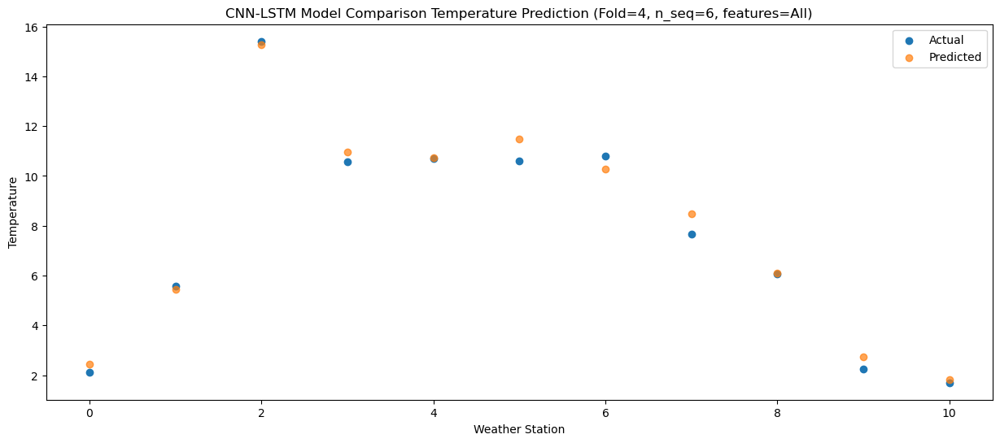

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0   -4.02  -1.491023
1                 1    9.02   8.166082
2                 2   13.49  15.167937
3                 3    7.11   8.907770
4                 4    6.82   8.609408
5                 5    9.02  11.040374
6                 6   11.46  11.368446
7                 7    4.04   6.107046
8                 8    2.70   3.900085
9                 9   -2.21  -0.714315
10               10   -0.54   0.422547


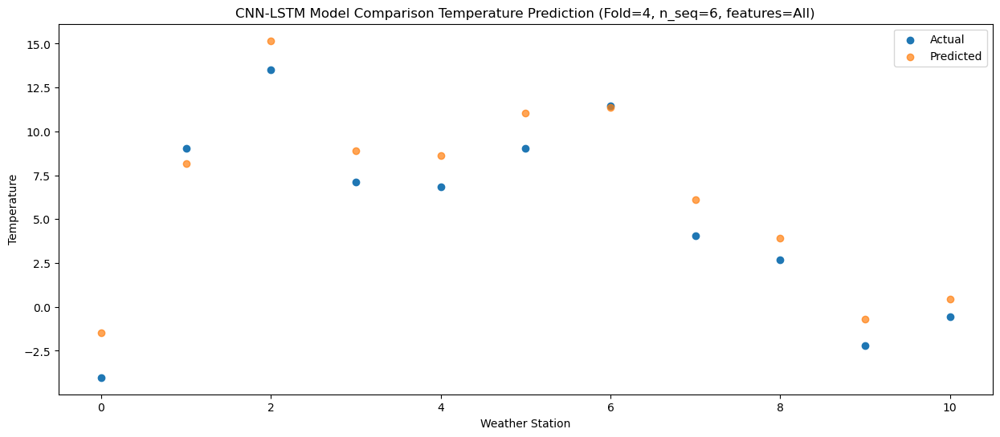

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   10.71  11.150163
1                 1   10.62   9.704474
2                 2   22.82  22.146665
3                 3   18.07  18.834546
4                 4   17.74  18.595877
5                 5   18.27  17.563759
6                 6   17.86  16.284253
7                 7   16.31  16.774470
8                 8   14.67  14.062870
9                 9   11.65  11.405426
10               10    9.35   8.819402


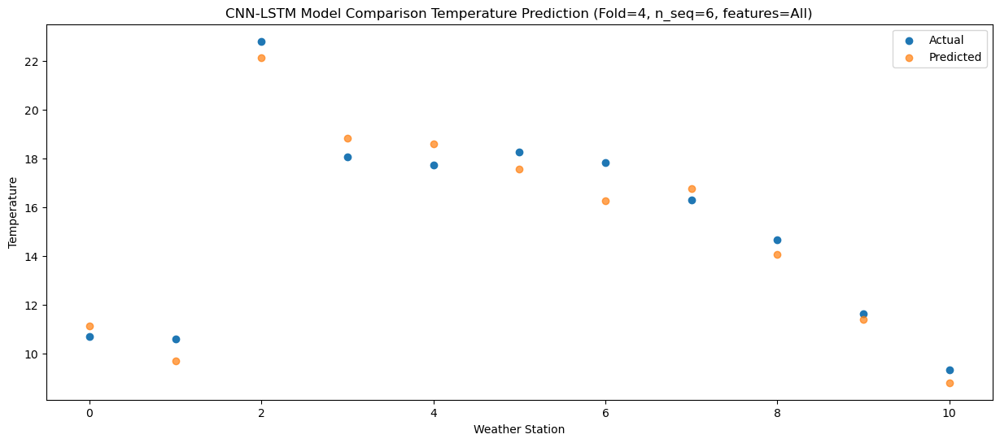

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   13.62  13.819009
1                 1   12.06  11.944343
2                 2   23.89  24.030277
3                 3   19.76  20.952145
4                 4   19.92  20.783183
5                 5   20.50  20.227937
6                 6   20.59  18.699380
7                 7   18.21  19.021761
8                 8   18.32  17.210191
9                 9   15.36  14.358730
10               10   13.15  12.673156


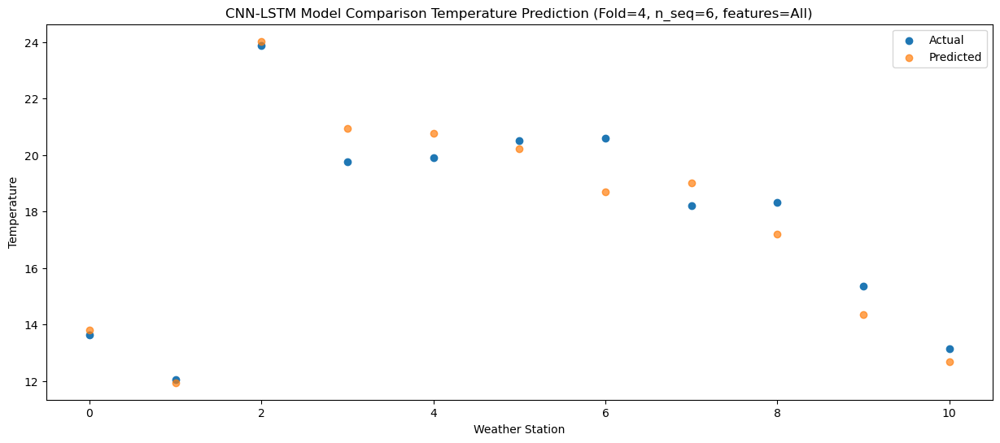

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   17.83  18.213548
1                 1   16.10  14.049391
2                 2   28.36  27.017935
3                 3   23.92  24.593482
4                 4   23.45  24.463567
5                 5   25.99  23.467554
6                 6   24.04  21.491493
7                 7   22.25  22.842401
8                 8   22.73  21.250942
9                 9   20.14  18.733952
10               10   17.68  16.665196


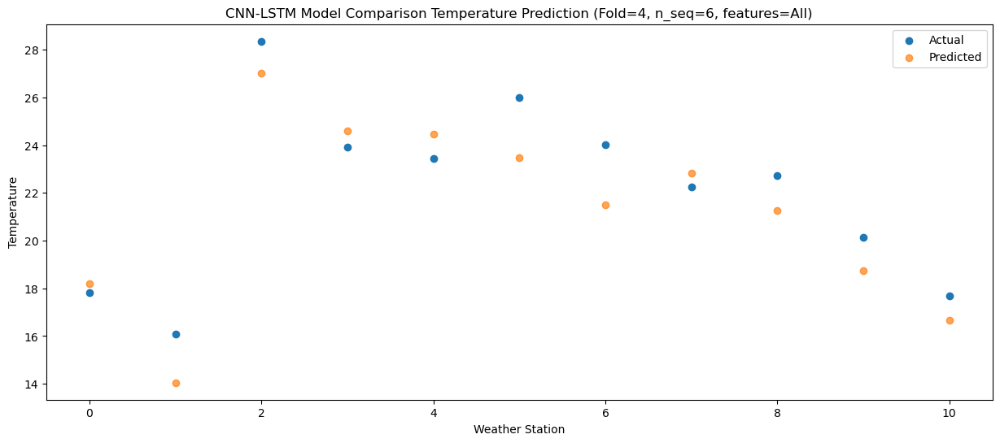

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   25.74  24.961596
1                 1   17.73  15.930047
2                 2   32.62  30.671478
3                 3   29.60  29.708525
4                 4   30.30  29.685255
5                 5   30.95  27.860287
6                 6   28.06  24.820244
7                 7   28.55  28.334188
8                 8   29.97  27.357246
9                 9   27.53  25.450032
10               10   24.57  22.761375


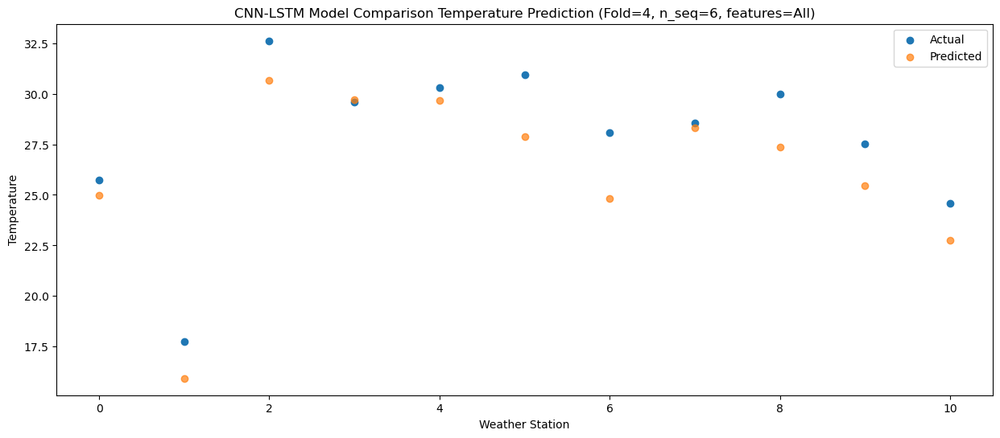

f, t:
[[ 2.11  5.59 15.41 10.57 10.71 10.59 10.79  7.65  6.06  2.23  1.7 ]
 [-4.02  9.02 13.49  7.11  6.82  9.02 11.46  4.04  2.7  -2.21 -0.54]
 [10.71 10.62 22.82 18.07 17.74 18.27 17.86 16.31 14.67 11.65  9.35]
 [13.62 12.06 23.89 19.76 19.92 20.5  20.59 18.21 18.32 15.36 13.15]
 [17.83 16.1  28.36 23.92 23.45 25.99 24.04 22.25 22.73 20.14 17.68]
 [25.74 17.73 32.62 29.6  30.3  30.95 28.06 28.55 29.97 27.53 24.57]]
[[ 2.44713544  5.45654757 15.26561255 10.95369958 10.73762876 11.48185741
  10.27719235  8.49240149  6.10052384  2.72483374  1.82102978]
 [-1.49102259  8.1660815  15.16793704  8.90776967  8.60940772 11.04037373
  11.36844587  6.10704602  3.90008463 -0.71431517  0.42254734]
 [11.15016317  9.70447381 22.14666533 18.8345456  18.59587699 17.56375925
  16.28425264 16.77447022 14.06287016 11.40542627  8.81940174]
 [13.8190093  11.94434316 24.03027665 20.95214533 20.78318339 20.22793739
  18.6993804  19.02176059 17.21019114 14.35873033 12.6731565 ]
 [18.21354818 14.04939087 27.01

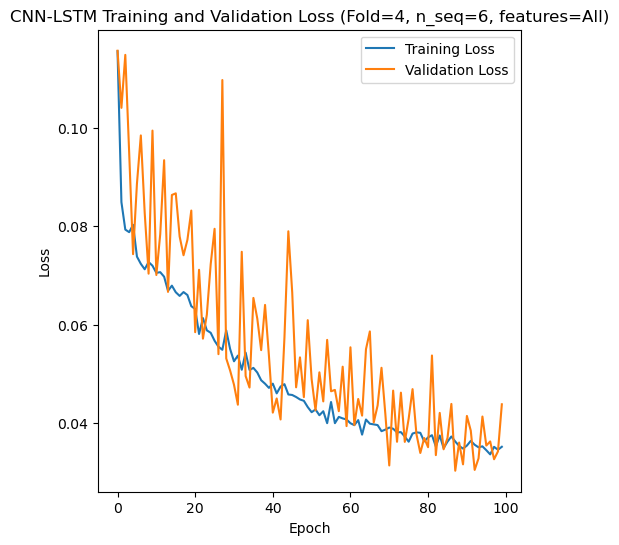

[[1.219873390100189], [0.8323225332123371], [3.4687851741415487], [2.3806070998066264], [1.3255668766249769]]
[[array(1.21987339)], [array(0.83232253)], [array(3.46878517)], [array(2.3806071)], [array(1.32556688)]]
[[1.0224658063238403], [0.6306103754946681], [2.6782606388583314], [1.796116418734644], [1.0543820436253697]]
[[0.13890459069621303], [0.04375453731658529], [0.18874782564049972], [0.4305782251914677], [0.12296639739469993]]
[[0.9755871586725647], [0.9876506392535157], [0.8235772879684898], [0.9227684692903296], [0.9776272077855878]]
[[array(0.06783763)], [array(0.04375454)], [array(0.18874783)], [array(0.39347565)], [array(0.02937929)]]
[[array(0.98669598)], [array(0.98948967)], [array(0.91642614)], [array(0.9400811)], [array(0.98424465)]]
[ 4.43  1.08 12.15 13.68 18.18 22.85 12.87 12.78 17.84 19.24 23.26 26.74
 15.34 16.2  22.18 23.82 27.8  31.94  9.    7.43 15.34 17.13 21.1  24.38
 13.35 10.26 20.16 22.09 25.95 31.15 11.52 12.17 17.07 20.44 23.95 28.52
 10.21 10.85 17.83 

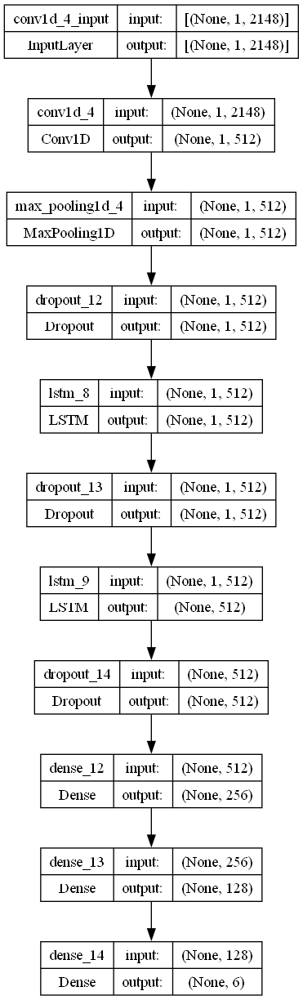

In [2]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def kmape (y_true, y_pred):
    return K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def kpearson (y_true, y_pred):
    mean_true = K.mean(y_true)
    mean_pred = K.mean(y_pred)
    return (K.square(K.mean((y_true - mean_true)*(y_pred - mean_pred))))/(K.mean(K.square(y_true - mean_true))*K.mean(K.square(y_pred - mean_pred)))

# fit the best CNN-LSTM model using parameters found by Optuna
def create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters from the best model
    filters = 512
    lr = 0.055894697755093155
    optimizer = SGD(learning_rate = lr)
    activation_function = 'tanh'
    lstm_units = 512
    dropout_rate = 0.27398607464926755

    # design network
    model = Sequential()
    model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(MaxPooling1D(pool_size=1)) # CNN-LSTM only
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units, return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer, metrics=['accuracy', 'mae', rmse, mape, pearson])
        
    return model

# Make one forecast with a CNN-LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_cnnlstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# Evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_cnnlstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # Invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # Propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# Inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# Evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(actual, forecasts, n_lag, n_seq):

    t = np.array(actual).transpose()
    f = np.array(forecasts).transpose()

    print("f, t:")
    print(t)
    print(f)
    rmse_list = []
    mae_list = []
    skmape_list = []
    mape_list = []
    r2_list = []
    pearson_list = []
    actual_list = []

    for i in range(n_seq):
        act = [row for row in t[i]]
        predicted = [forecast for forecast in f[i]]
        rmse1 = sqrt(mean_squared_error(act, predicted))
        rmse2 = np.array(rmse(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        mae = mean_absolute_error(act, predicted)
        mse = mean_squared_error(act, predicted)
        skmape = mean_absolute_percentage_error(act, predicted)
        kmape1 = np.array(kmape(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        kpearson1 = np.array(kpearson(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        r2 = r2_score(act, predicted) 
        avg_actual = np.mean(act)
        print("Year at t+"+str(i+1)+":")
        print('t+%d SKRMSE: %f' % ((i+1), rmse1))
        print('t+%d KRMSE: %f' % ((i+1), rmse2))        
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d SKMAPE: %f' % ((i+1), skmape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))
        print('t+%d KMAPE: %f' % ((i+1), kmape1))
        print('t+%d PEARSON: %f' % ((i+1), kpearson1))
        print('t+%d AVERAGE ACTUAL: %f' % ((i+1), avg_actual))

    y_true = tf.convert_to_tensor(np.array(actual).flatten())
    y_pred = tf.convert_to_tensor(np.array(forecasts).flatten())

    rmse1 = sqrt(mean_squared_error(np.array(y_true), np.array(y_pred)))
    rmse2 = np.array(rmse(y_true, y_pred))
    mae = mean_absolute_error(np.array(y_true), np.array(y_pred))
    mse = mean_squared_error(np.array(y_true), np.array(y_pred))
    skmape = mean_absolute_percentage_error(np.array(y_true), np.array(y_pred))
    kmape1 = np.array(kmape(y_true, y_pred))
    kpearson1 = np.array(kpearson(y_true, y_pred))
    r2 = r2_score(np.array(y_true), np.array(y_pred)) 
    avg_actual = np.mean(np.array(y_true))
    rmse1_list.append(rmse1)
    rmse2_list.append(rmse2)
    mae_list.append(mae)
    skmape_list.append(skmape)
    pearson_list.append(kpearson1)
    mape_list.append(kmape1)
    r2_list.append(r2)
    actual_list.append(avg_actual)
    print("Metrics for this Fold:")
    print('SKRMSE: %f' % (rmse1))
    print('KRMSE: %f' % (rmse2))        
    print('MAE: %f' % (mae))
    print('SKMAPE: %f' % (skmape))
    print('R2_SCORE: %f' % (r2))
    print('KMAPE: %f' % (kmape1))
    print('PEARSON: %f' % (kpearson1))
    print('AVERAGE ACTUAL: %f' % (avg_actual))

    return rmse1_list, rmse2_list, mae_list, skmape_list, r2_list, mape_list, pearson_list, actual_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, actual, n_test, n_seq, n_lag):
    # Plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # Plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Temperature")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100
    
rmse1_avg_list = []
rmse2_avg_list = []
mae_avg_list = []
skmape_avg_list = []
r2_score_avg_list = []
mape_avg_list = []
pearson_avg_list = []
actual_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]
    
    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    print(dataset)

    series = pd.Series(dataset[:, 0]) # Using first column (temperatures)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))
    
    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test, n_seq)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    print(results_df)
    
    print("Actual and Forecasts:")
    print(actual)
    print(forecasts)
    
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        actual_ws = actual[j]
        
        plot_forecasts(series_ws, forecasts_ws, actual_ws, n_test, n_seq, n_lag)

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)

        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='CNN-LSTM Model Comparison Temperature Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=All)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Temperature')
        plt.legend()
        plt.show()

    rmse1_list = [] # list stores sklearn's root mean squared errors for each future time prediction
    rmse2_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores mean absolute errors for each future time prediction
    skmape_list = [] # list stores sklearn's mean squared percentage errors for each future time prediction
    r2_list = [] # list stores sklearn's r2 pearson values for each future time prediction
    mape_list = [] # list stores mean squared percentage errors for each future time prediction
    pearson_list = [] # list stores r2 pearson values for each future time prediction
    actual_list = [] # list stores average actual values for each future time prediction

    # evaluate forecasts
    rmse1_list, rmse2_list, mae_list, skmape_list, r2_list, mape_list, pearson_list, actual_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse1_avg_list.append(rmse1_list)
    rmse2_avg_list.append(rmse2_list)
    mae_avg_list.append(mae_list)
    skmape_avg_list.append(skmape_list)
    r2_score_avg_list.append(r2_list)
    mape_avg_list.append(mape_list)
    pearson_avg_list.append(pearson_list)
    actual_avg_list.append(actual_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)
            
    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'CNN-LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=All)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse1_avg_list)
print(rmse2_avg_list)
print(mae_avg_list)
print(skmape_avg_list)
print(r2_score_avg_list)
print(mape_avg_list)
print(pearson_avg_list)
print(np.array(actual_results).flatten())
print(np.array(forecast_results).flatten())
a2 = np.array(actual_results).flatten()
f2 = np.array(forecast_results).flatten()
p1 = np.array(pearson(tf.convert_to_tensor(a2), tf.convert_to_tensor(f2)))
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse1_avg_list)
print("Average SKRMSE:"+str(np.mean(rmse1_avg_list)))
print("Average KRMSE:"+str(np.mean(rmse2_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average SKMAPE:"+str(np.mean(skmape_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average PEARSON:"+str(p1))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "cnnlstm_model_optimized_CV_S6.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)